In [1]:
#@author Shray Alag
#@version 08.05.2020
#@mentor Abhi
#@runtime running the whole notebook takes less than 10 seconds, but remember to input your choice of which motifs it
#should get the co-occurance of
#Finds the co-occurances of two motifs and runs statistics using the kmer sequences in a fasta file. Displays all
#of the meme motif sequences (in the sequence logo format) and the meme motifs information (e-value, etc.). Asks user
#which of thsoe two motifs they would like to get co-occurance of and then reads through the fasta file and uses a dict
#to store the information about the length difference between when the two motifs occur. Then, it creates histograms.
#The doExtraAnalysis feature allows analysis of negative and positive lengths (when the second motif occurs before the
#first).



#You need to install biopython (pip install biopython) and logomaker (pip install logomaker)

from modisco.visualization import viz_sequence
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from pandas import DataFrame
import logomaker as logo
from Bio import SeqIO
import pandas as pd
import numpy as np
%matplotlib inline
import time
import re
import os


class RunMotif():
    
    def __init__(self, fastaFileTemp, memeTextFileNameTemp):
        self.fastaFile, self.memeTextFileName = fastaFileTemp, memeTextFileNameTemp
        self.motifList = []
        self.infoMotifList = []
        self.firstMotifIndex, self.secondMotifIndex = -2, -2
        self.firstMotifStr, self.secondMotifStr = "", ""
        self.bothOccuranceLength = {}
        self.doExtraAnalysis = True
        self.global_time = time.time()
#         self.fig, self.axs = plt.subplots(2, 2)
#         self.figLogo, self.axsLogo = plt.subplots(2,1,figsize=[12,10])
        
        
        self.fig = plt.figure(figsize=(20,10))
        gs = self.fig.add_gridspec(4,2)
        self.ax1 = self.fig.add_subplot(gs[0, :])
        self.ax2 = self.fig.add_subplot(gs[1, :])
        self.ax3 = self.fig.add_subplot(gs[2, :])
        self.ax4 = self.fig.add_subplot(gs[3, 0])
        self.ax5 = self.fig.add_subplot(gs[3, 1])
        
        self.useTopTwo = True
    
    def readFasta(self, motifs):
        self.fastaReader = open(self.memeTextFileName, "r") 
        inMotif = False

        np_motif_array = []


        for row in self.fastaReader:
            if inMotif and not row.startswith("------"):
                #print(row.strip().split())
                np_motif_array.append(row.strip().split())
            if row.startswith("letter-probability"):
                inMotif = True
            elif inMotif and row.startswith("--------"):
                pd_Motif = pd.DataFrame(np_motif_array,
                    columns=['A', 'C', 'G', 'T'])
                motifs.append(pd_Motif)
                np_motif_array = []
                inMotif = False

            if row.startswith("letter-probability matrix:"):
                self.infoMotifList.append(row[38:])
        self.motifList = motifs


    def convert_to_ic_scale(self, pwm):
        background = np.array([0.27, 0.23, 0.23, 0.27])
        pwm_sum = np.sum(pwm, axis=1, keepdims=True)
        pwm_sum[pwm_sum == 0] = 1  # Keep 0 where 0
        ic_scale_pwm = viz_sequence.ic_scale(pwm / pwm_sum, background)
        return ic_scale_pwm





    def displayLogos(self, motifs):
        for i in range(len(motifs)):
            logo_logo = logo.Logo(self.notsoSpecialEncoding(motifs[i]), color_scheme={'A': 'red','C': 'blue', 'G': 'orange', 'T': 'green'},baseline_width=0,
                               show_spines=False,
                               vsep=.005,
                               width=.80)
            logo_logo.ax.text(14, 0, "#" + str(i+1) + ": " + self.infoMotifList[i], fontsize=40-len(motifs[i]))
            plt.show()





    #takes in a 2D Pandas Dataframe
    def getSpecialEncoding(self, motifs):
        rows = []
        for index, row in motifs.iterrows():
            rows.append((self.computationNeg(row["A"]), self.computationNeg(row["C"]), self.computationNeg(row["G"]), self.computationNeg(row["T"])))
        df = pd.DataFrame(rows, columns=['A', 'C', 'G', 'T'])
        return df

    

    #takes in a 2D Pandas Dataframe
    def notsoSpecialEncoding(self, motifs):
        rows = []
        for index, row in motifs.iterrows():
            rows.append((row["A"], row["C"], row["G"], row["T"]))
        rows = np.asarray(rows).astype(float)
        rows = self.convert_to_ic_scale(rows)
        df = pd.DataFrame(rows, columns=['A', 'C', 'G', 'T'])
        return df



    def computationNeg(self, coloumn):
        temp = float(coloumn)
        if temp < 0.15:
            return temp - 0.10
        if temp > 0.8:
            return (temp - 0.70)*15 + 0.2
        else:
            return temp + 0.1






    #takes in a 2D Pandas Dataframe
    def getOneHot(self, motifs):
        rows = []
        for index, row in motifs.iterrows():
            rows.append((roundedVersion(row["A"]), roundedVersion(row["C"]), roundedVersion(row["G"]), roundedVersion(row["T"])))
        df = pd.DataFrame(np.array(rows).astype(np.float), columns=['A', 'C', 'G', 'T'])
        return df






    def roundedVersion(self, coloumn):
        if float(coloumn) > 0.8:
            return 1
        else:
            return 0


    def setUp(self, b=None):
        if b ==None:
            self.readFasta(self.motifList)
            self.displayLogos(self.motifList)
            self.firstMotifIndex, self.secondMotifIndex = -1, -1





    def setUpParam(self, fastaFileTemp, memeTextFileNameTemp):
        fastaFile = fastaFileTemp
        memeTextFileName = memeTextFileNameTemp
        print(fastaFile, memeTextFileName)
        setUp()






    def setUpParamWithIndexes(self, fastaFileTemp, memeTextFileNameTemp, firstMotifIndexTemp, secondMotifIndex):
        firstMotifIndex = firstMotifIndexTemp
        secondMotifIndex = secondMotifIndexTemp
        setUpParam(fastaFileTemp, memeTextFileNameTemp)

    #There are many different methods for the setUp method. Depending on which parameters you know choose the appropriate 
    #method



TF-MoDISco is using the TensorFlow backend.
/opt/miniconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.neighbors.kde module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
class RunOccurrence:

    def __init__(self, RunMotif):
        if RunMotif.useTopTwo:
            RunMotif.firstMotifIndex = 0
            RunMotif.secondMotifIndex = 1
        else:
            RunMotif.firstMotifIndex = int(input("Please enter the number (1 to 10) of the first motif you would like to get the co-occurance of: ")) - 1
            RunMotif.secondMotifIndex = int(input("Please enter the number (1 to 10) of the second motif you would like to get the co-occurance of: ")) - 1
        print("Thanks! Running co-occurance statistics on motifs " + str(RunMotif.firstMotifIndex + 1) + " and " + str(RunMotif.secondMotifIndex + 1))    
        self.shouldSkip = False
        
        
        
        
    def defineKeyMarkersForMotifs(self, RunMotif):
        firstMotifStr = RunMotif.firstMotifStr 
        secondMotifStr = RunMotif.secondMotifStr
        if len(RunMotif.motifList) < 2:
            self.shouldSkip = True
        else:
            self.shouldSkip = False
            for index, row in RunMotif.motifList[RunMotif.firstMotifIndex].iterrows():
                hasFoundOne = False
                for i in range(4):
                    if float(row[i]) > 0.75:
                        RunMotif.firstMotifStr = RunMotif.firstMotifStr + str((i + 1))
                        hasFoundOne = True
                    if i == 3 and hasFoundOne == False:
                        RunMotif.firstMotifStr = RunMotif.firstMotifStr + "."



            for index, row in RunMotif.motifList[RunMotif.secondMotifIndex].iterrows():
                hasFoundOne = False
                for i in range(4):
                    if float(row[i]) > 0.8:
                        RunMotif.secondMotifStr = RunMotif.secondMotifStr + str((i + 1))
                        hasFoundOne = True
                    if i == 3 and hasFoundOne == False:
                        RunMotif.secondMotifStr = RunMotif.secondMotifStr + "."



            RunMotif.firstMotifStr = RunMotif.firstMotifStr.replace('1','A')
            RunMotif.firstMotifStr = RunMotif.firstMotifStr.replace('2','C')
            RunMotif.firstMotifStr = RunMotif.firstMotifStr.replace('3','G')
            RunMotif.firstMotifStr = RunMotif.firstMotifStr.replace('4','T')

            RunMotif.secondMotifStr = RunMotif.secondMotifStr.replace('1','A')
            RunMotif.secondMotifStr = RunMotif.secondMotifStr.replace('2','C')
            RunMotif.secondMotifStr = RunMotif.secondMotifStr.replace('3','G')
            RunMotif.secondMotifStr = RunMotif.secondMotifStr.replace('4','T')




            print(RunMotif.firstMotifStr)
            print(RunMotif.secondMotifStr)
            
            
            logo_logo = logo.Logo(RunMotif.notsoSpecialEncoding(RunMotif.motifList[RunMotif.firstMotifIndex]), color_scheme={'A': 'red','C': 'blue', 'G': 'orange', 'T': 'green'},baseline_width=0,
                                  show_spines=False,
                                  ax = RunMotif.ax1,
                                  vsep=.005,
                                  width=.80)
            logo_logo.ax.text(14, 0, "#" + str(RunMotif.firstMotifIndex+1) + ": " + RunMotif.infoMotifList[RunMotif.firstMotifIndex], fontsize=40-len(RunMotif.motifList[RunMotif.firstMotifIndex]))

            logo_logoT = logo.Logo(RunMotif.notsoSpecialEncoding(RunMotif.motifList[RunMotif.secondMotifIndex]), color_scheme={'A': 'red','C': 'blue', 'G': 'orange', 'T': 'green'},baseline_width=0,
                                   show_spines=False,
                                   ax = RunMotif.ax2,
                                   vsep=.005,
                                   width=.80)
            logo_logoT.ax.text(14, 0, "#" + str(RunMotif.secondMotifIndex+1) + ": " + RunMotif.infoMotifList[RunMotif.secondMotifIndex], fontsize=40-len(RunMotif.motifList[RunMotif.secondMotifIndex]))

       
        return RunMotif.firstMotifStr, RunMotif.secondMotifStr







    def readInFasta(self, RunMotif):
        firstMotifStr = RunMotif.firstMotifStr
        secondMotifStr = RunMotif.secondMotifStr
        bothOccuranceLength = RunMotif.bothOccuranceLength
        self.twelveSequenceDict = {}
        self.negThirteenSequence = {}
        counter = 0


        if not self.shouldSkip:
            fasta_sequences = SeqIO.parse(open(RunMotif.fastaFile),'fasta')

            for fasta in fasta_sequences:
                counter = counter + 1
                name, sequence = fasta.id, str(fasta.seq)
                firstFound = re.search(RunMotif.firstMotifStr, sequence)
                secondFound = re.search(RunMotif.secondMotifStr, sequence)


                if firstFound and secondFound:

                    length = firstFound.start() - secondFound.start()

                    if length in RunMotif.bothOccuranceLength:
                        RunMotif.bothOccuranceLength.update({length: (RunMotif.bothOccuranceLength.get(length) + 1)})       
                    else:
                        RunMotif.bothOccuranceLength.update({length: 1})



                    if RunMotif.doExtraAnalysis:
                        pass
    #                     if length == 12:
    #     #                     print(sequence[secondFound.start():firstFound.start()+len(firstMotifStr)])
    #                         if sequence[secondFound.start():firstFound.start()+len(firstMotifStr)] in twelveSequenceDict:
    #                             twelveSequenceDict.update({sequence[secondFound.start():firstFound.start()+len(firstMotifStr)]: (twelveSequenceDict.get(sequence[secondFound.start():firstFound.start()+len(firstMotifStr)]) + 1)})

    #                         else:
    #                             twelveSequenceDict.update({sequence[secondFound.start():firstFound.start()+len(firstMotifStr)]: 1})



    #                     if length == -12:
    #     #                     print(sequence)
    #     #                     print(sequence[firstFound.start():secondFound.start()+len(secondMotifStr)])
    #                         if sequence[firstFound.start():secondFound.start()+len(secondMotifStr)] in negThirteenSequence:
    #                             negThirteenSequence.update({sequence[firstFound.start():secondFound.start()+len(secondMotifStr)]: (negThirteenSequence.get(sequence[firstFound.start():secondFound.start()+len(secondMotifStr)]) + 1)})

    #                         else:
    #                             negThirteenSequence.update({sequence[firstFound.start():secondFound.start()+len(secondMotifStr)]: 1})




            RunMotif.bothOccuranceLength = {k: v for k, v in sorted(bothOccuranceLength.items(), key=lambda item: item[1])}
            print(RunMotif.bothOccuranceLength)
            print(counter)
            
    
            print("{:<16} {:<8}".format('Spacing Distribution','Counts'))
            for k, v in RunMotif.bothOccuranceLength.items():
                label= v
                print("{:<16} {:<8}".format(k, label))



            if RunMotif.doExtraAnalysis:
                self.negThirteenSequence = {k: v for k, v in sorted(self.negThirteenSequence.items(), key=lambda item: item[1])}
                #print(negThirteenSequence)
                self.twelveSequenceDict = {k: v for k, v in sorted(self.twelveSequenceDict.items(), key=lambda item: item[1])}
                #print(twelveSequenceDict)
            return RunMotif.bothOccuranceLength, self.negThirteenSequence, self.twelveSequenceDict



    

    def act(self, fname, RunMotif):
        temp1, temp2 = self.defineKeyMarkersForMotifs(RunMotif)
        if not self.shouldSkip:
            RunMotif.bothOccuranceLength,_,_ = self.readInFasta(RunMotif)

            posLength = {}
            negLength = {}



            if RunMotif.doExtraAnalysis:
                for key in RunMotif.bothOccuranceLength:
                    if int(key) > 0:
                        posLength.update({key: RunMotif.bothOccuranceLength.get(key)})
                    else:
                        negLength.update({key: RunMotif.bothOccuranceLength.get(key)})

            RunMotif.ax3.bar(RunMotif.bothOccuranceLength.keys(), RunMotif.bothOccuranceLength.values(), 1, color='g')

            if RunMotif.doExtraAnalysis:
                RunMotif.ax5.bar(posLength.keys(), posLength.values(), 1, color='b')
                #plt.show()

            if RunMotif.doExtraAnalysis:
                RunMotif.ax4.bar(negLength.keys(), negLength.values(), 1, color='r')
                #plt.show()
            RunMotif.fig.savefig("Results_Co-occurrence/" + fname + "Plot.png", dpi=None, facecolor='w', edgecolor='w', orientation='portrait', 
                                 papertype=None, format=None, transparent=True, bbox_inches=None, pad_inches=0.1,
                                 frameon=None, metadata=None)
        print("--- %s seconds ---" % (time.time() - RunMotif.global_time))

----------  ZNF317_AG40NGGAATC_IVT_BatchAATBA_Cycle3_R1  ---------


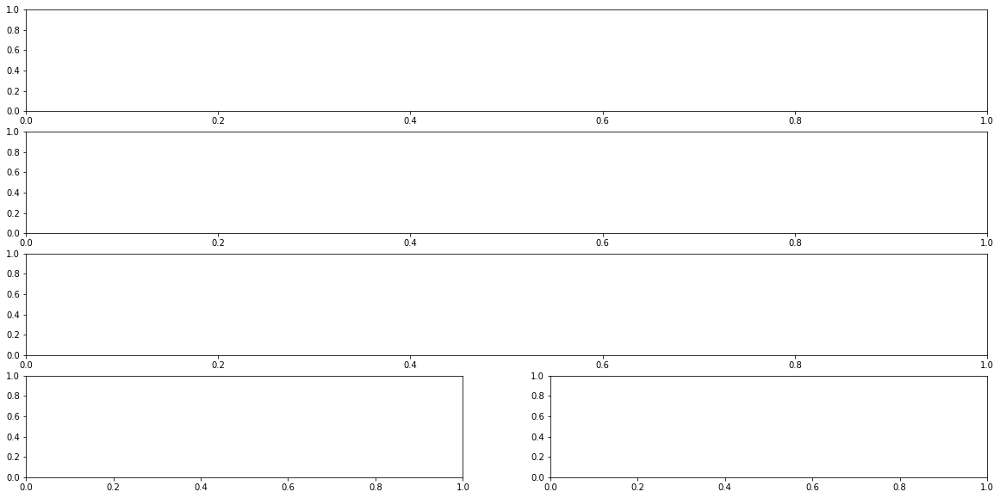

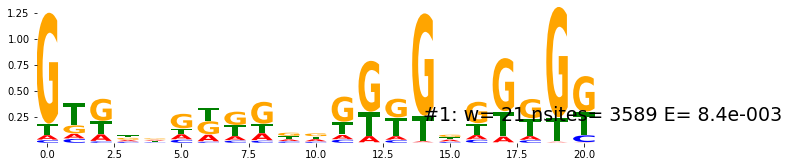

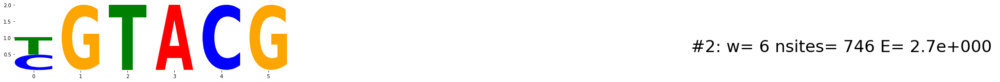

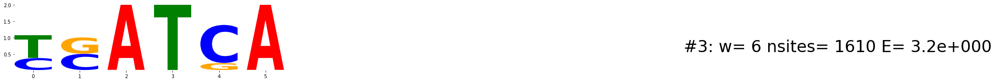

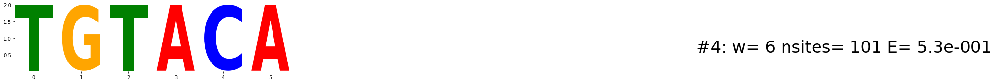

...

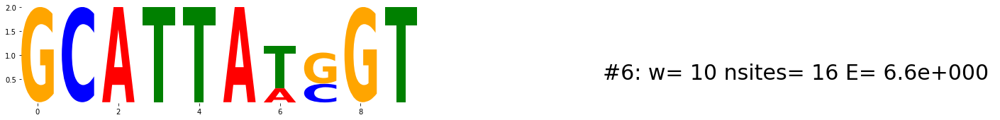

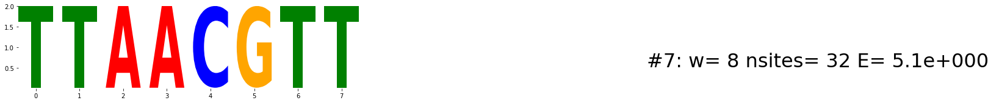

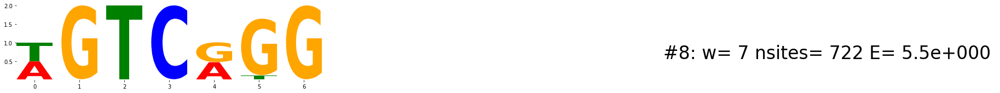

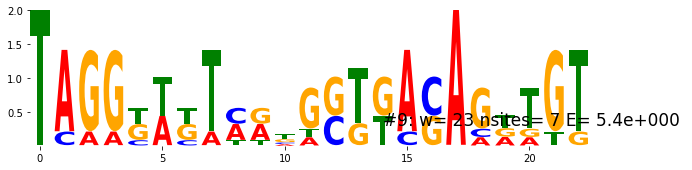

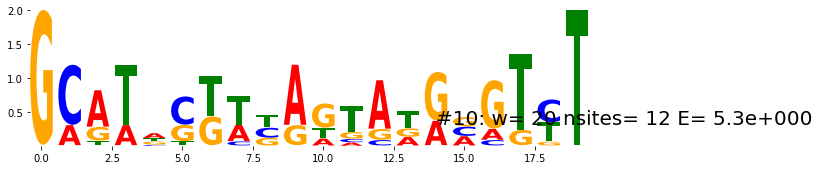

Thanks! Running co-occurance statistics on motifs 1 and 2
G.............G....G.
.GTACG
{18: 1, 19: 2, -31: 2, 17: 2, 13: 2, -33: 3, 15: 4, 16: 4, -32: 4, -29: 5, -28: 6, 12: 8, -23: 8, -30: 9, 14: 10, -8: 10, 10: 10, 8: 11, 11: 12, 7: 12, -24: 14, -21: 14, -25: 14, 9: 15, 6: 15, -22: 16, -2: 20, -27: 21, -19: 21, -26: 21, -1: 25, -4: 25, 0: 25, -3: 29, -7: 29, -20: 30, -5: 31, -6: 31, 5: 49, -18: 56, -14: 67, 1: 71, -13: 72, -9: 91}
35255
Spacing Distribution Counts  
18               1       
19               2       
-31              2       
17               2       
13               2       
-33              3       
15               4       
16               4       
-32              4       
-29              5       
-28              6       
12               8       
-23              8       
-30              9       
14               10      
-8               10      
10               10      
8                11      
11               12      
7                12      
-24    

/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:190: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.


--- 2.8989012241363525 seconds ---
----------  ZNF30_AA40NAGTGGT_IVT_BatchAATBA_Cycle3_R1  ---------


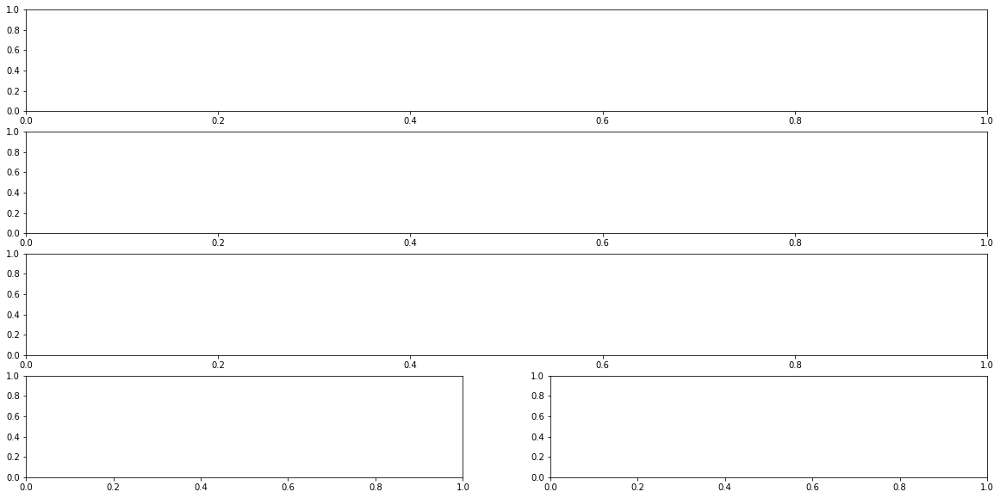

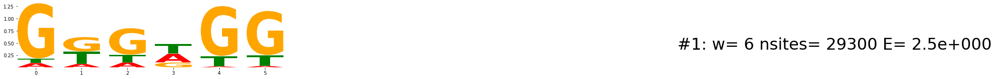

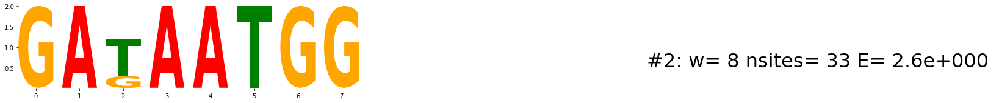

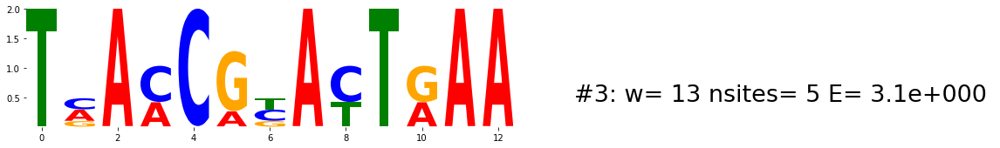

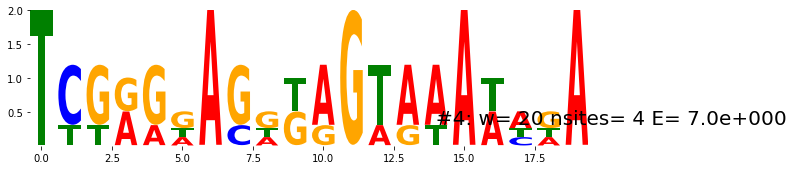

...

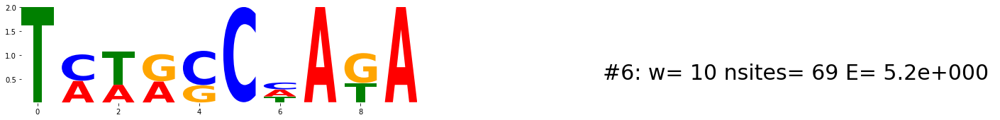

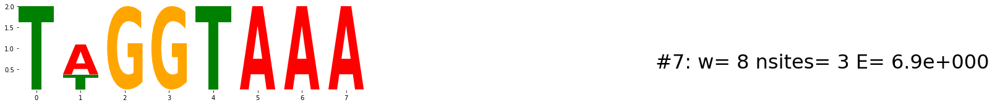

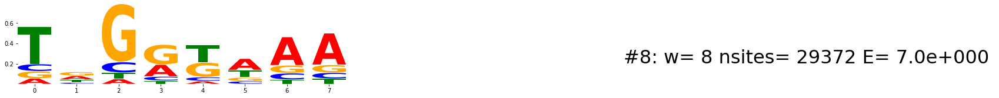

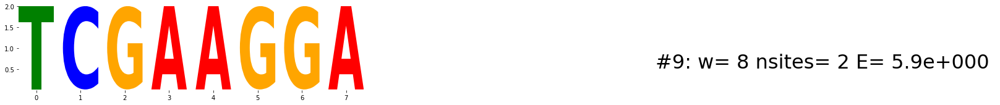

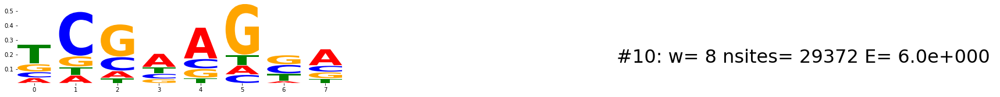

Thanks! Running co-occurance statistics on motifs 1 and 2
G...GG
GA.AATGG
{19: 1, 14: 1, -18: 1, -23: 1, 18: 1, 16: 1, -24: 1, 27: 1, 11: 1, 8: 1, 24: 1, -28: 1, 17: 1, -25: 1, -27: 1, -12: 1, -14: 1, 22: 1, -8: 2, -29: 2, -26: 2, -7: 2, 12: 2, 10: 2, 13: 2, -10: 2, 15: 2, 9: 3, -31: 3, -16: 3, -20: 3, -11: 3, -22: 3, -15: 3, -19: 4, -13: 4, -5: 5, -6: 5, -9: 5, 6: 6, 7: 6, 2: 36}
29372
Spacing Distribution Counts  
19               1       
14               1       
-18              1       
-23              1       
18               1       
16               1       
-24              1       
27               1       
11               1       
8                1       
24               1       
-28              1       
17               1       
-25              1       
-27              1       
-12              1       
-14              1       
22               1       
-8               2       
-29              2       
-26              2       
-7               2       
12      

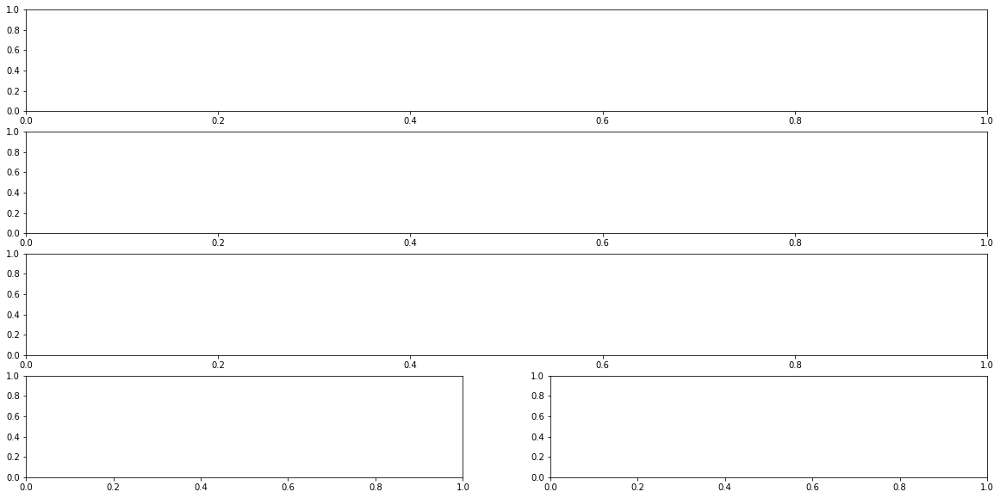

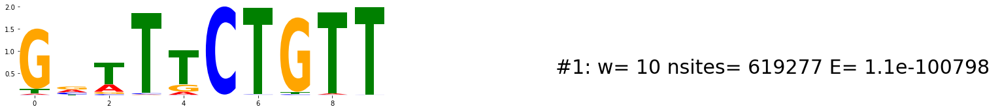

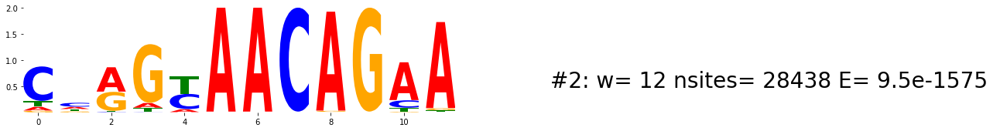

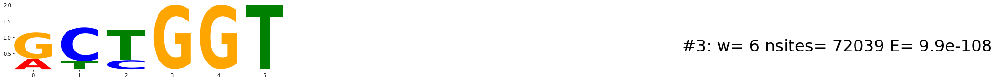

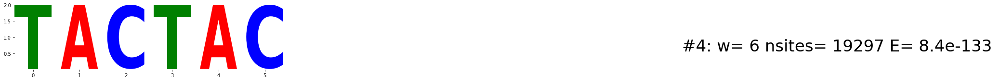

...

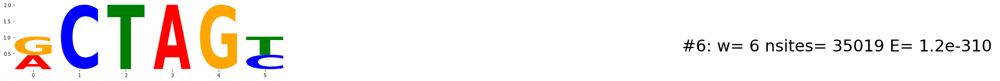

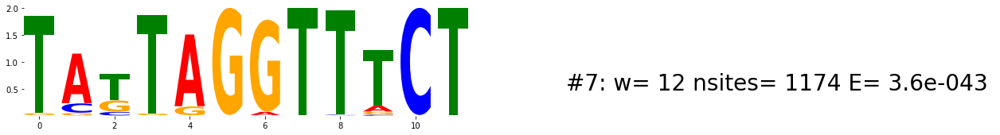

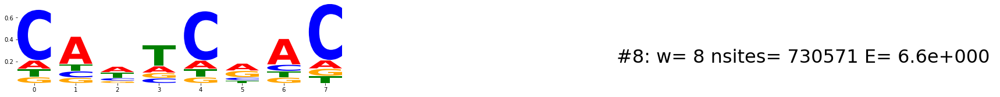

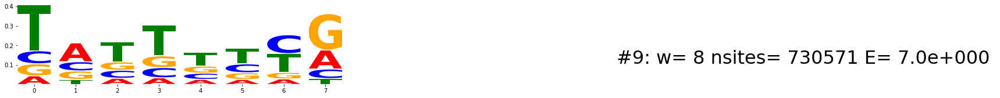

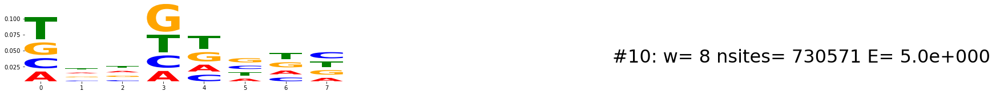

Thanks! Running co-occurance statistics on motifs 1 and 2
G..TTCTGTT
...G.AACAG.A
{17: 1, 29: 1, 10: 1, 27: 1, 18: 2, -8: 2, -26: 2, 19: 2, 25: 3, 26: 3, 24: 3, 14: 4, 23: 4, -23: 4, -9: 4, 28: 5, 21: 5, -25: 5, 22: 5, -22: 6, -19: 7, 13: 7, 15: 7, -13: 7, -10: 8, 20: 8, -7: 8, -15: 9, -12: 9, -17: 12, -20: 14, -11: 16, -24: 17, -21: 19, -14: 22, -18: 28, -16: 33, 12: 64, 9: 176}
730571
Spacing Distribution Counts  
17               1       
29               1       
10               1       
27               1       
18               2       
-8               2       
-26              2       
19               2       
25               3       
26               3       
24               3       
14               4       
23               4       
-23              4       
-9               4       
28               5       
21               5       
-25              5       
22               5       
-22              6       
-19              7       
13               7       
15      

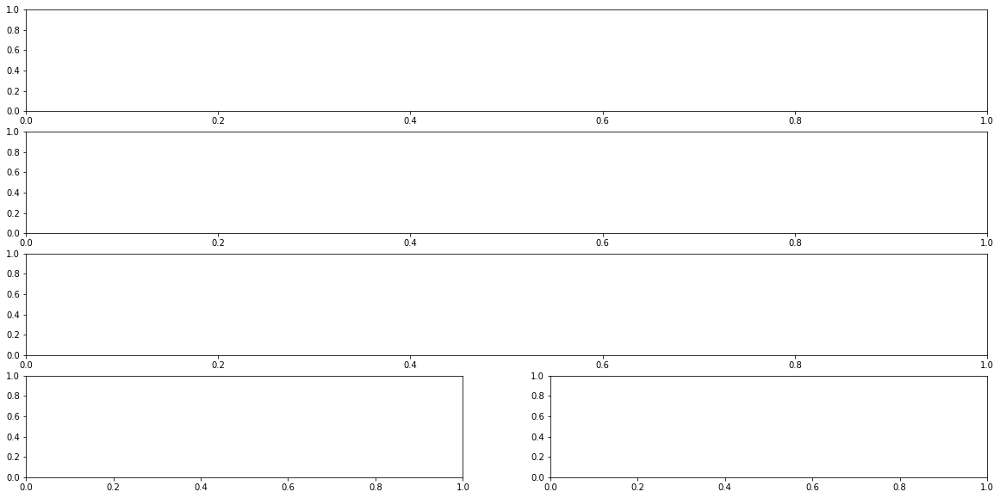

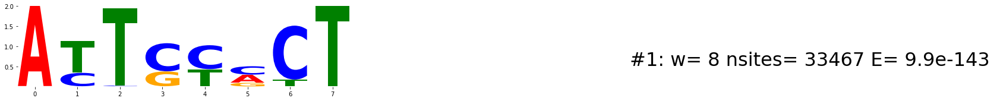

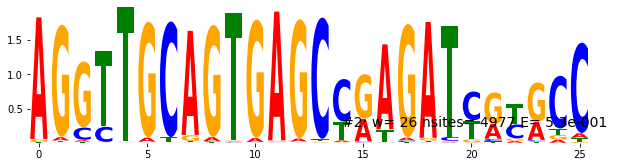

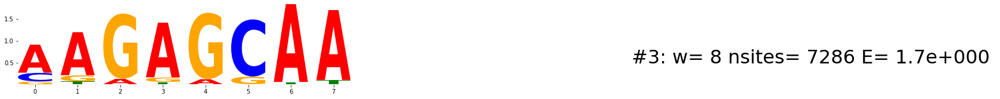

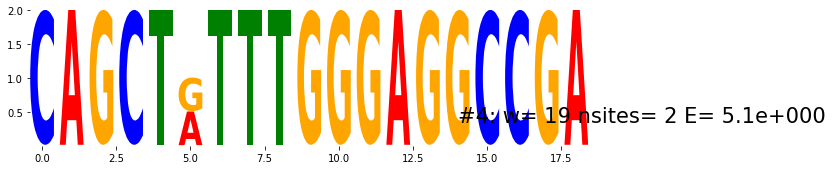

...

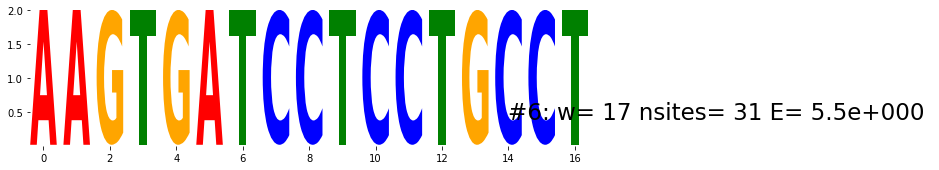

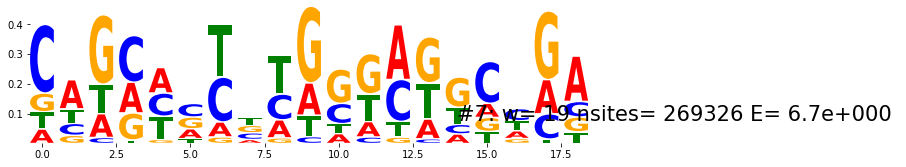

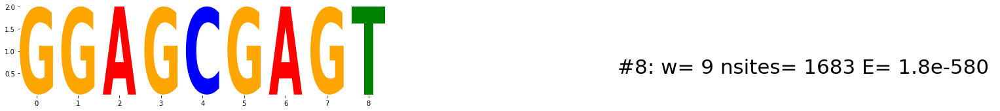

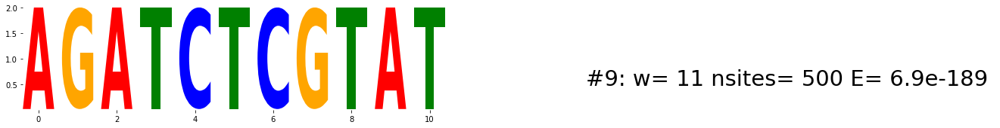

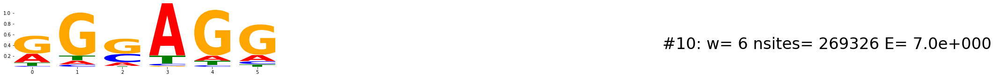

Thanks! Running co-occurance statistics on motifs 1 and 2
A.T...CT
AGGTTGCAGTGAGC..AGAT.....C
{-24: 1, 27: 2, -23: 4, 26: 281, 7: 314}
269326
Spacing Distribution Counts  
-24              1       
27               2       
-23              4       
26               281     
7                314     
--- 4.717430114746094 seconds ---
----------  ZNF250_GA40NGGTCAT_IVT_BatchAATBA_Cycle3_R1  ---------


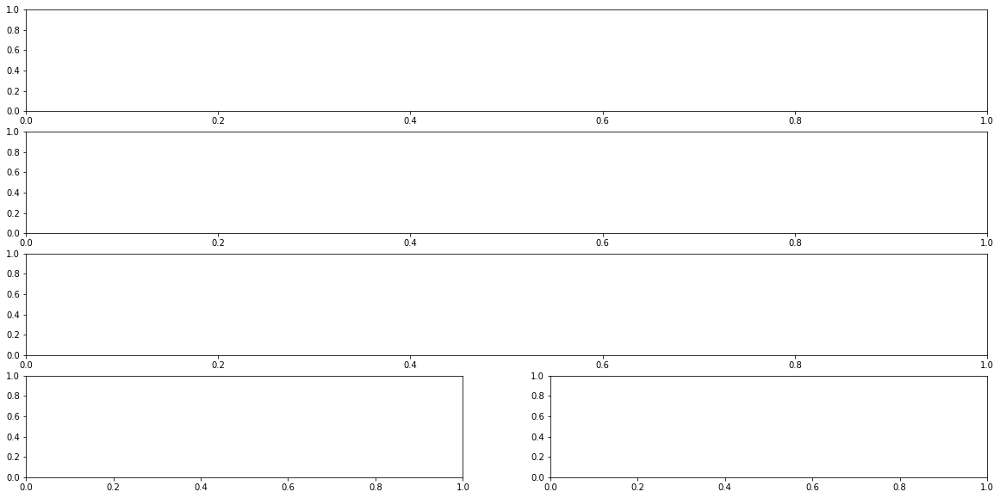

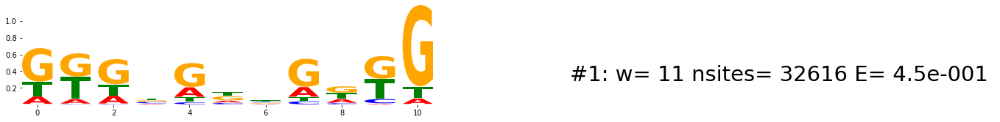

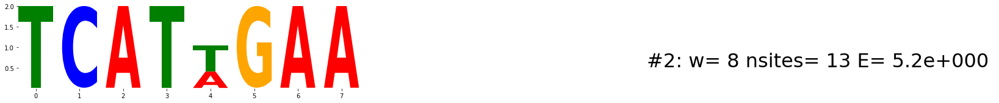

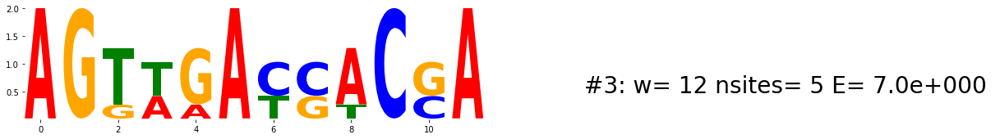

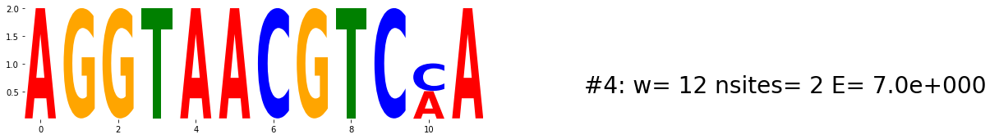

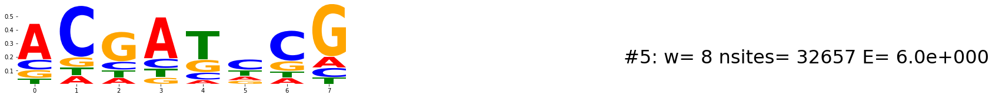

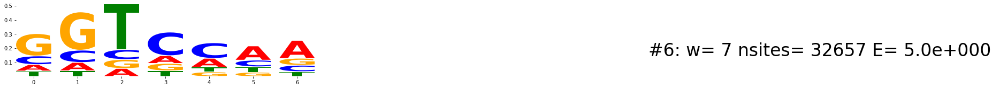

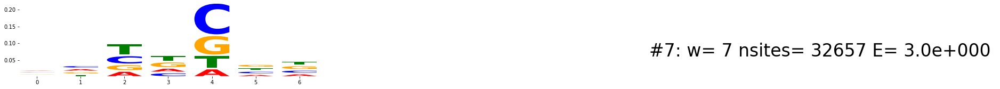

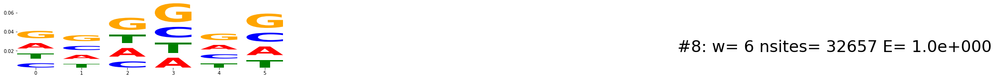

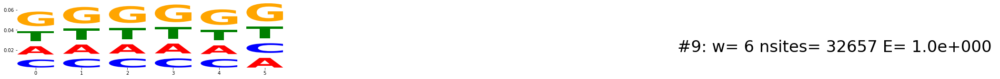

Thanks! Running co-occurance statistics on motifs 1 and 2
..........G
TCAT.GAA
{-26: 1, 0: 1, -27: 1, -15: 1, -12: 1, 1: 1, -14: 1, -11: 1, -1: 1, -13: 1, -6: 2, -19: 2, -20: 2, -24: 2, -28: 2, -21: 3, -5: 3, -22: 3}
32657
Spacing Distribution Counts  
-26              1       
0                1       
-27              1       
-15              1       
-12              1       
1                1       
-14              1       
-11              1       
-1               1       
-13              1       
-6               2       
-19              2       
-20              2       
-24              2       
-28              2       
-21              3       
-5               3       
-22              3       
--- 2.649644613265991 seconds ---
----------  ZNF264_CC40NCGTTTT_Lysate_BatchAATA_Cycle3_R1  ---------


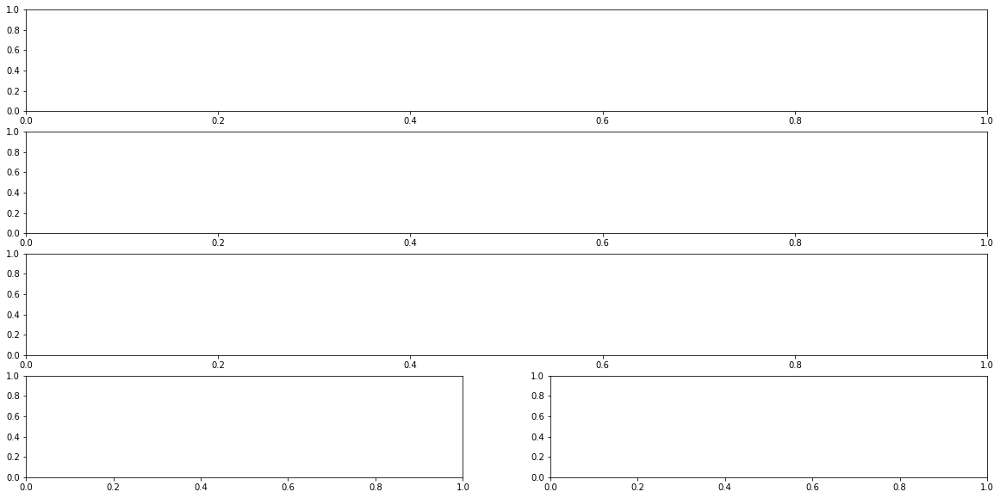

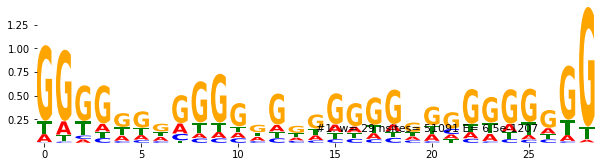

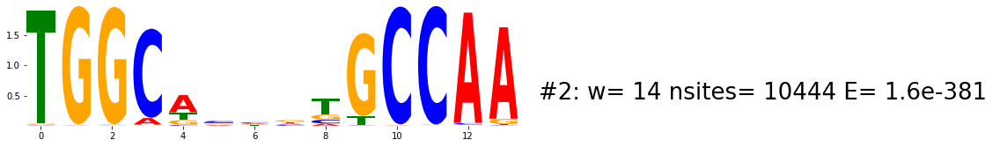

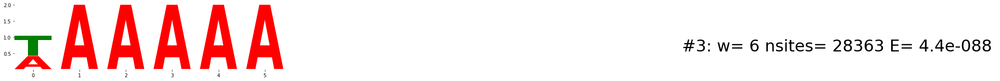

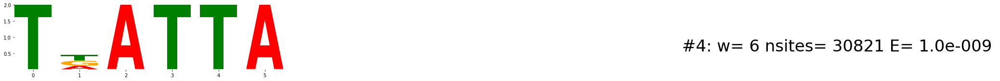

...

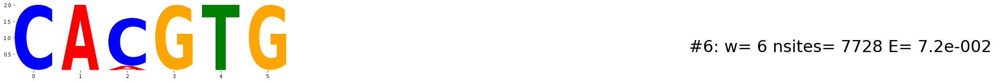

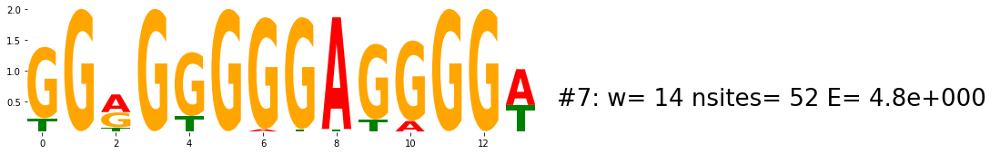

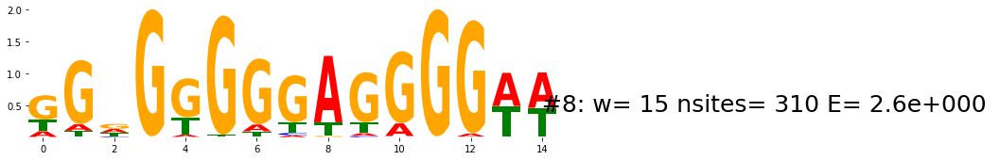

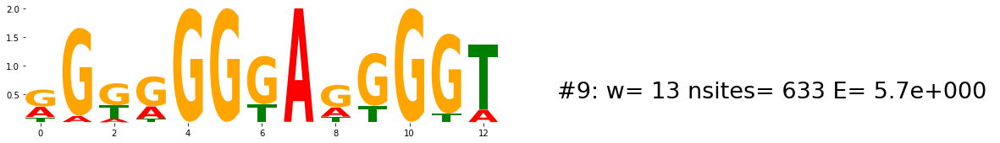

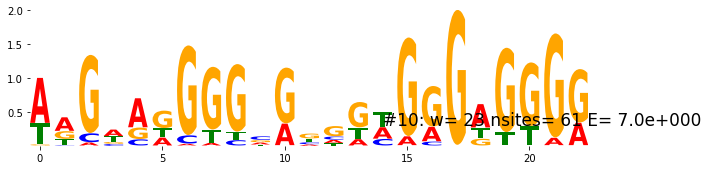

Thanks! Running co-occurance statistics on motifs 1 and 2
GG..........................G
TGGC.....GCCAA
{-2: 2, -26: 8, -24: 12, -23: 13, 5: 15, -22: 17, 4: 17, 7: 19, -20: 21, 8: 31, 6: 32, -7: 41, -13: 44, -21: 48, -12: 49, -9: 50, -4: 51, -3: 52, -10: 56, -11: 59, -8: 63, -5: 66, -6: 67, -14: 89, -19: 119, 1: 719}
765605
Spacing Distribution Counts  
-2               2       
-26              8       
-24              12      
-23              13      
5                15      
-22              17      
4                17      
7                19      
-20              21      
8                31      
6                32      
-7               41      
-13              44      
-21              48      
-12              49      
-9               50      
-4               51      
-3               52      
-10              56      
-11              59      
-8               63      
-5               66      
-6               67      
-14              89      
-19              119 

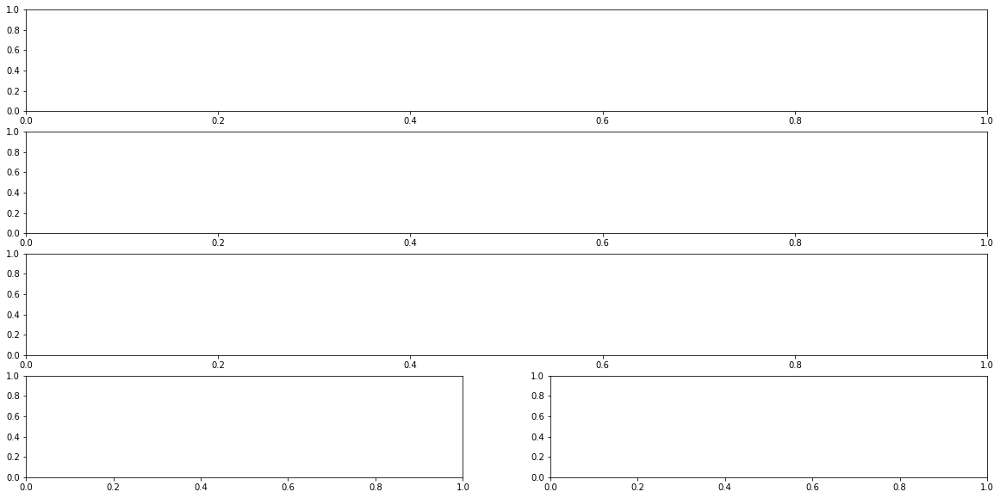

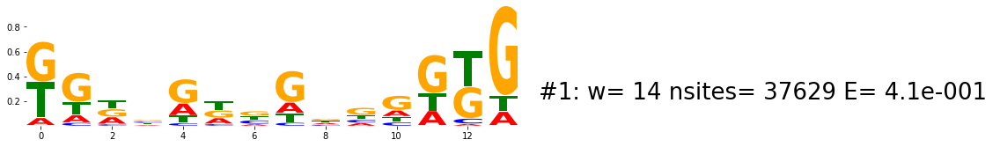

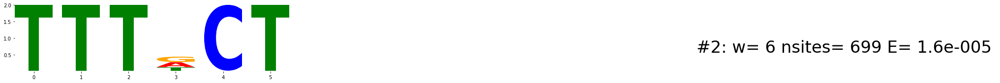

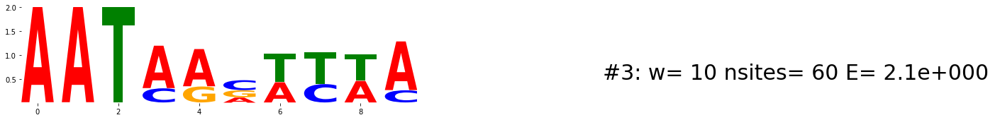

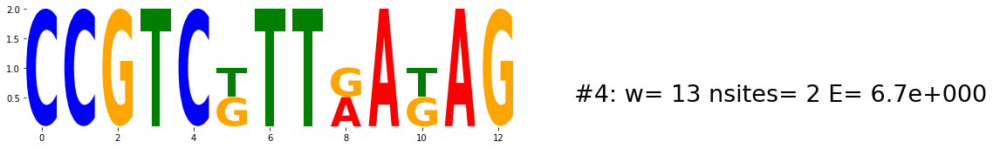

...

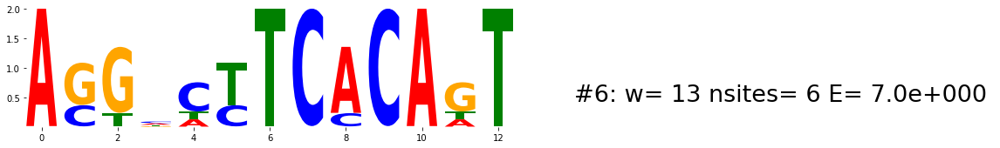

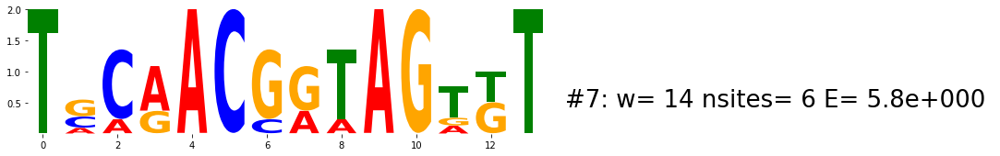

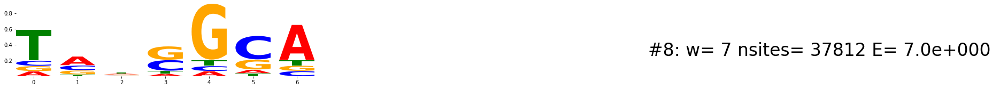

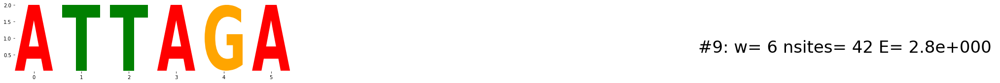

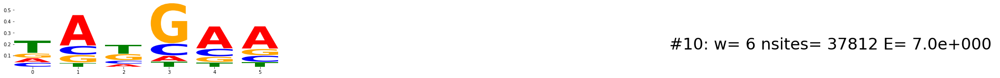

Thanks! Running co-occurance statistics on motifs 1 and 2
.............G
TTT.CT
{8: 1, 11: 1, 6: 2, 7: 3, -33: 3, 4: 5, -34: 9, 2: 11, 3: 11, -26: 12, -21: 12, -28: 12, -19: 13, -27: 14, -20: 15, -24: 16, -25: 16, 1: 17, -31: 18, -22: 18, -32: 19, -30: 21, -23: 23, -18: 24, -16: 24, -29: 25, -15: 28, -17: 29, -1: 30, 0: 31, -14: 39, -2: 41, -4: 43, -10: 45, -3: 45, -5: 45, -6: 59, -7: 61}
37812
Spacing Distribution Counts  
8                1       
11               1       
6                2       
7                3       
-33              3       
4                5       
-34              9       
2                11      
3                11      
-26              12      
-21              12      
-28              12      
-19              13      
-27              14      
-20              15      
-24              16      
-25              16      
1                17      
-31              18      
-22              18      
-32              19      
-30              21      


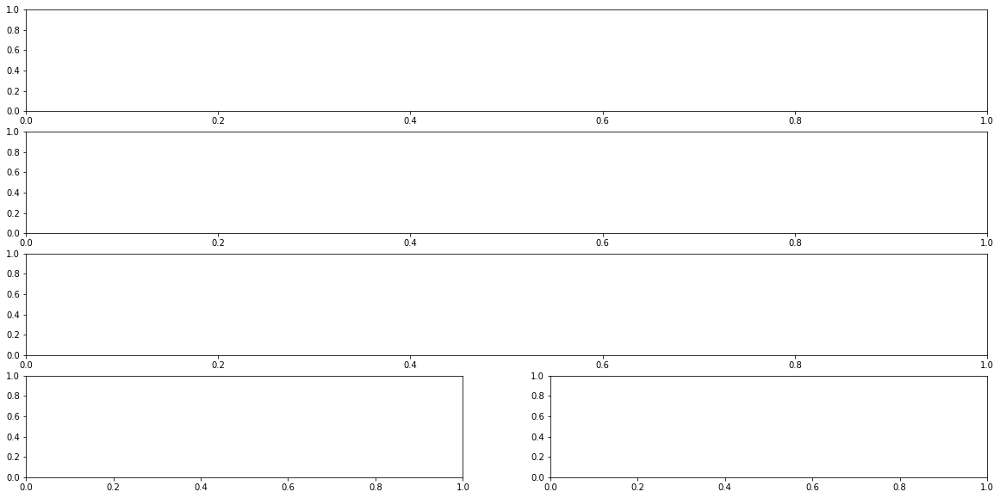

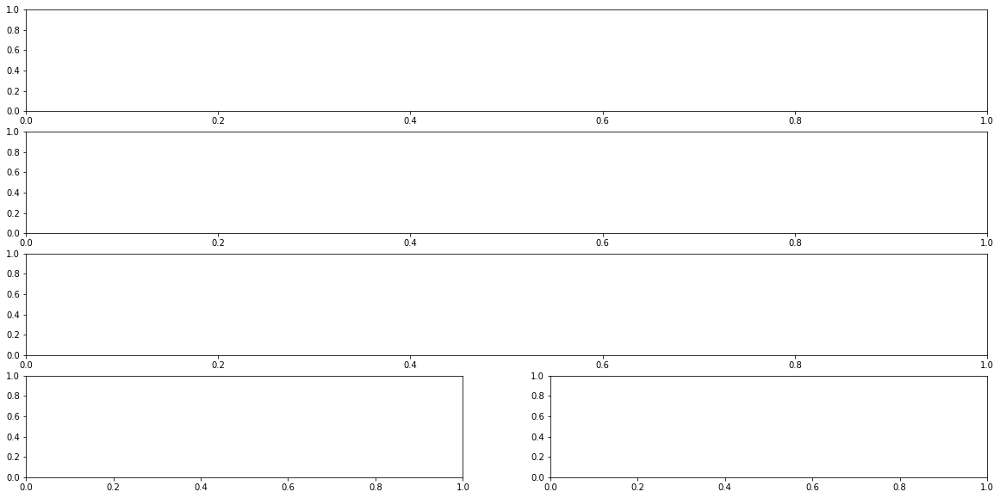

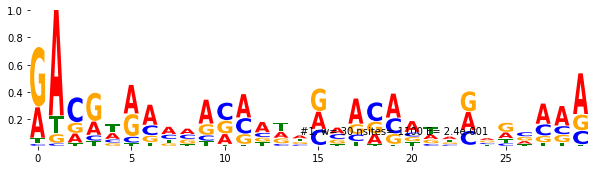

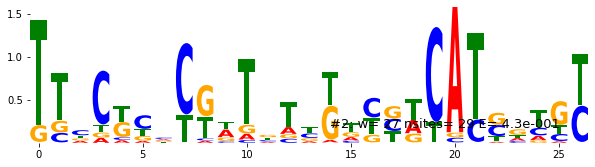

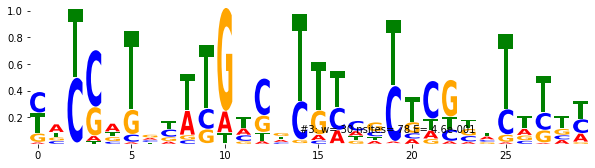

...

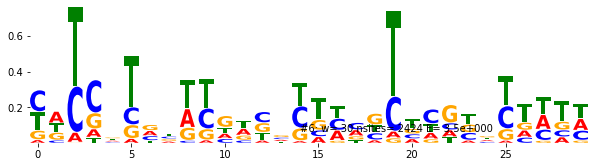

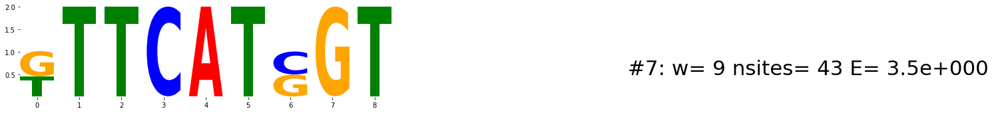

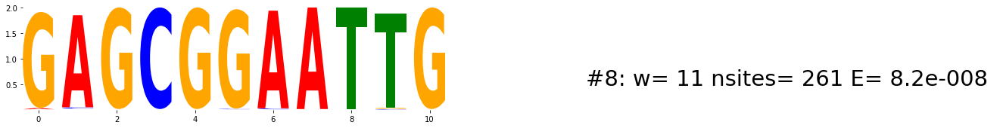

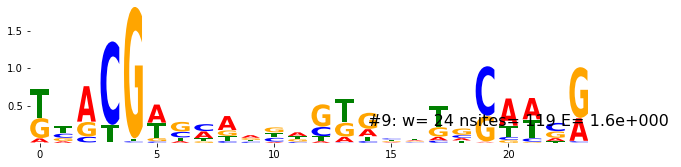

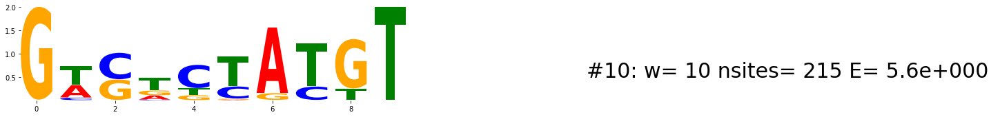

Thanks! Running co-occurance statistics on motifs 1 and 2
.A............................
T..................CA......
{10: 16, 9: 19, 8: 49, 7: 59, -13: 87, 6: 99, 5: 157, -12: 166, 4: 188, -11: 224, 3: 226, -10: 285, -9: 314, -8: 328, 2: 351, -7: 378, -6: 390, -5: 411, -3: 421, -4: 422, 1: 427, -2: 476, 0: 563}
29087
Spacing Distribution Counts  
10               16      
9                19      
8                49      
7                59      
-13              87      
6                99      
5                157     
-12              166     
4                188     
-11              224     
3                226     
-10              285     
-9               314     
-8               328     
2                351     
-7               378     
-6               390     
-5               411     
-3               421     
-4               422     
1                427     
-2               476     
0                563     
--- 4.183822870254517 seconds ---
----------  ZNF8_TC

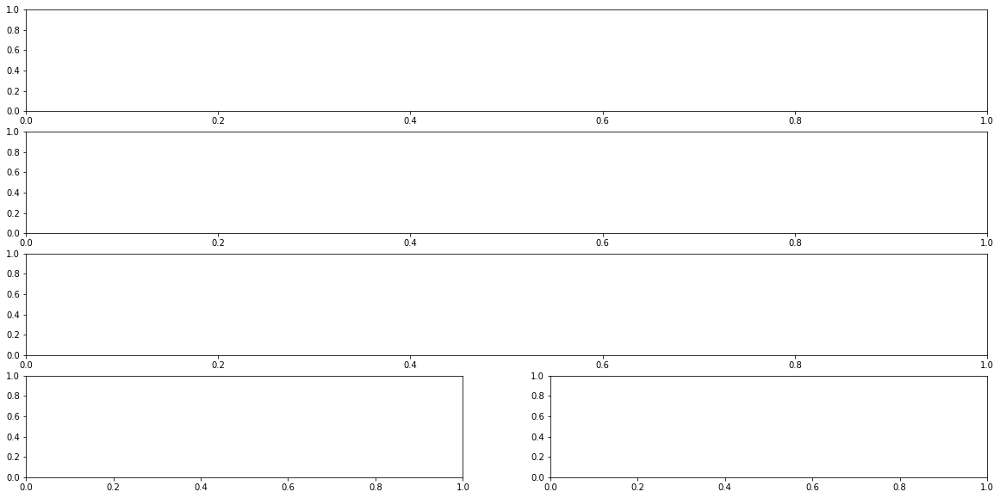

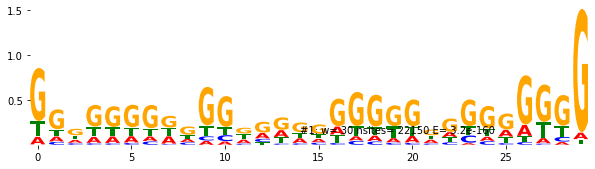

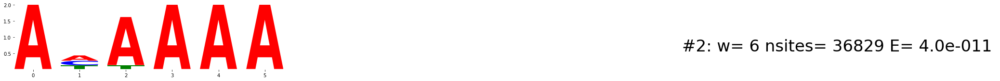

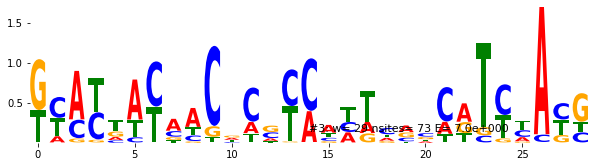

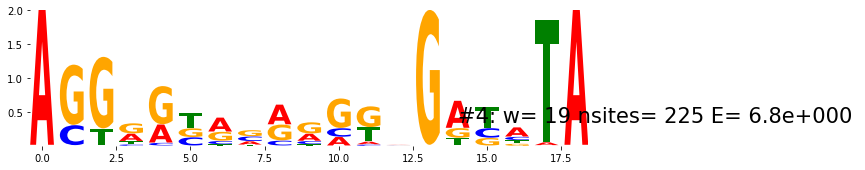

...

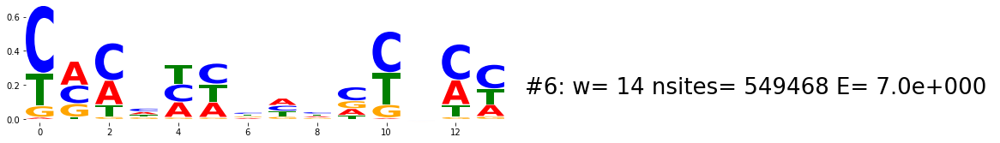

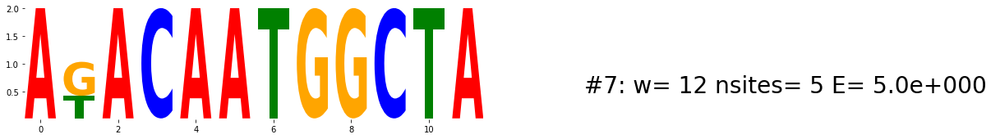

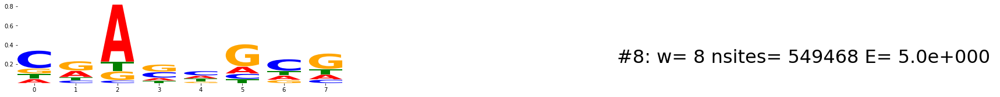

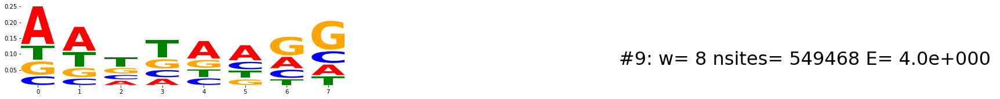

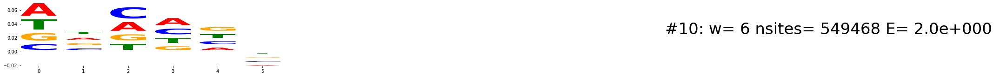

Thanks! Running co-occurance statistics on motifs 1 and 2
.............................G
A.AAAA
{10: 2, 8: 9, 9: 10, 7: 19, 6: 40, 5: 56, 4: 67, -34: 69, 3: 112, -33: 116, -32: 161, 2: 199, -31: 202, -30: 209, 1: 242, -28: 296, -12: 309, -15: 316, -14: 316, -11: 317, -13: 318, -16: 326, -8: 328, -18: 330, -10: 339, -5: 340, -17: 340, -4: 349, -6: 351, -7: 360, -9: 362, -3: 367, -1: 386, -19: 397, -2: 401, 0: 402, -20: 437, -21: 488, -22: 557, -23: 669}
549468
Spacing Distribution Counts  
10               2       
8                9       
9                10      
7                19      
6                40      
5                56      
4                67      
-34              69      
3                112     
-33              116     
-32              161     
2                199     
-31              202     
-30              209     
1                242     
-28              296     
-12              309     
-15              316     
-14              316     
-11         

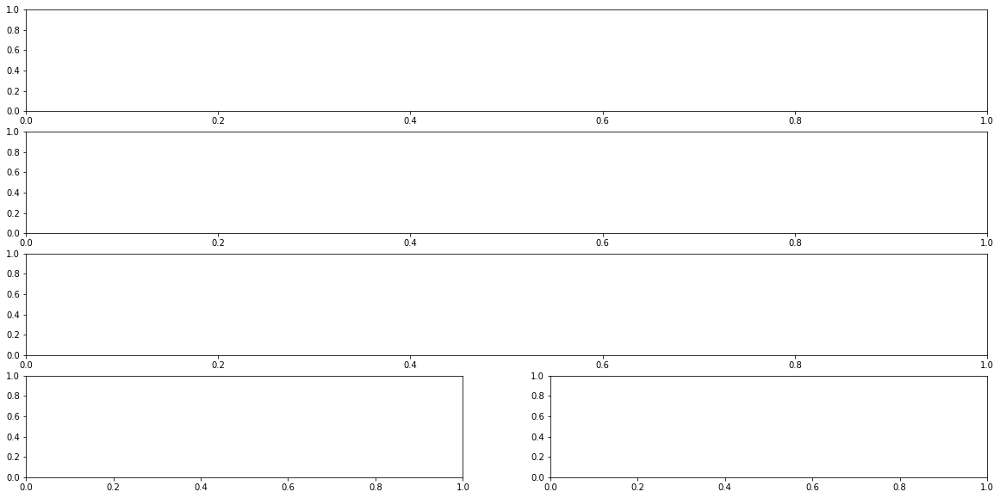

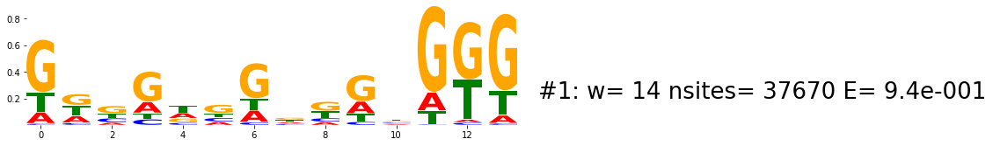

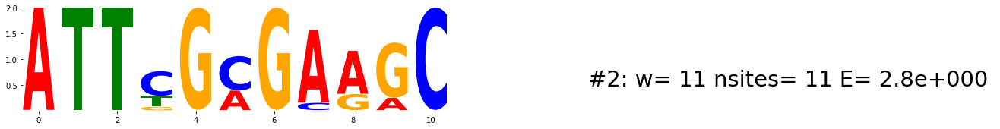

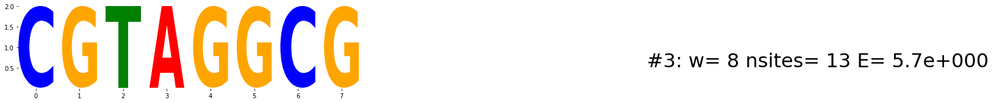

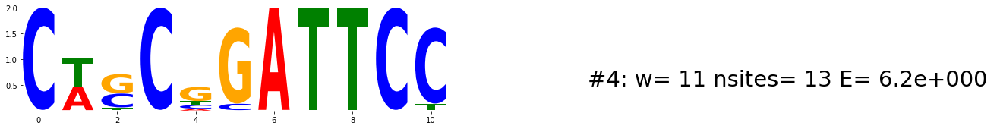

...

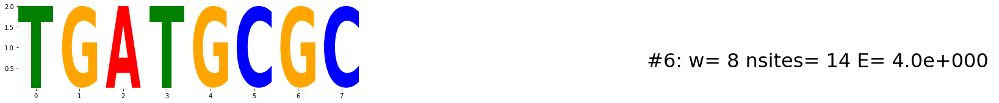

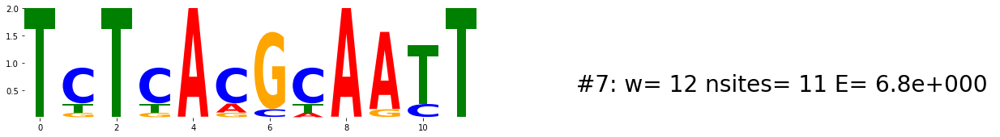

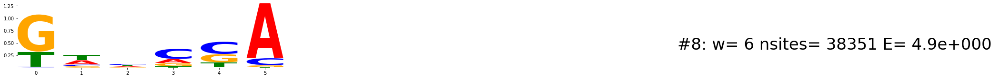

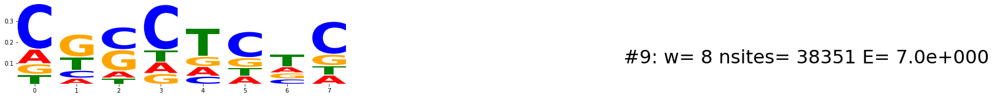

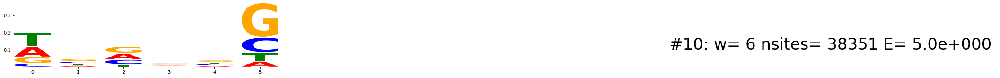

Thanks! Running co-occurance statistics on motifs 1 and 2
..............
ATT.G.GA.GC
{-20: 1, -24: 1, -13: 1, -26: 1, -29: 1, -16: 1, -8: 1, 0: 1, -3: 2, -7: 2, -4: 2, -5: 2, -9: 2, -6: 2, -18: 2, -14: 2, -23: 3, -10: 3, -19: 3, -25: 3}
38351
Spacing Distribution Counts  
-20              1       
-24              1       
-13              1       
-26              1       
-29              1       
-16              1       
-8               1       
0                1       
-3               2       
-7               2       
-4               2       
-5               2       
-9               2       
-6               2       
-18              2       
-14              2       
-23              3       
-10              3       
-19              3       
-25              3       
--- 2.915649652481079 seconds ---
----------  ZNF22_GC40NATTTGC_Lysate_BatchAATA_Cycle3_R1  ---------


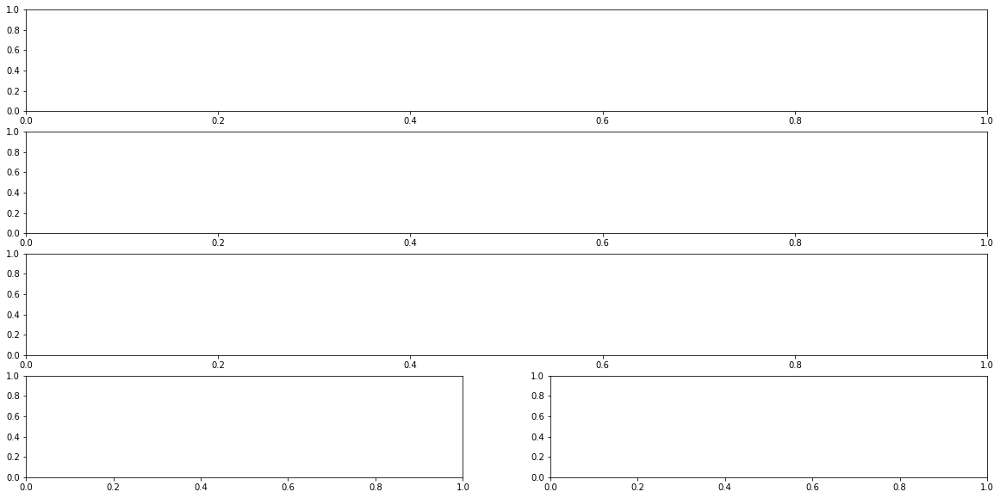

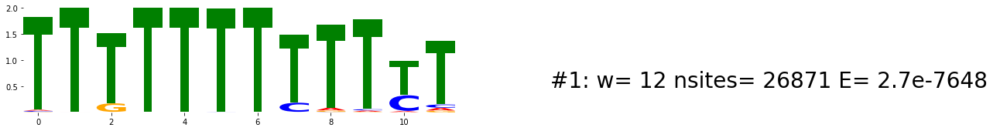

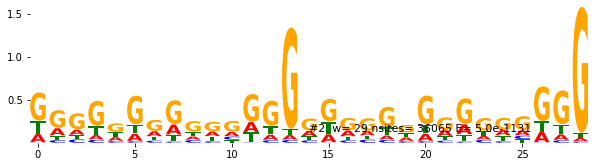

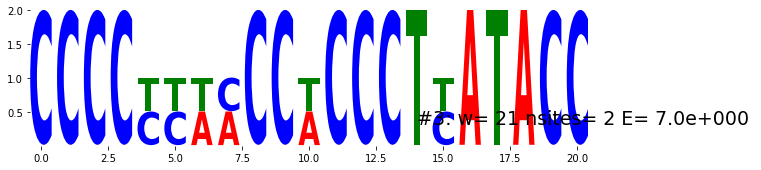

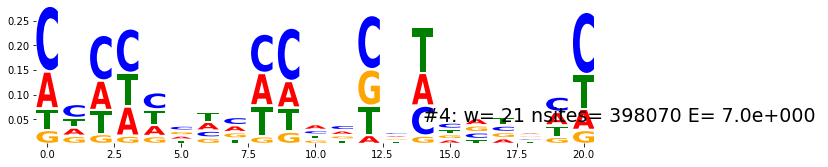

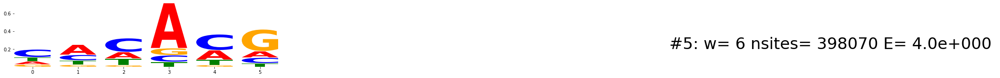

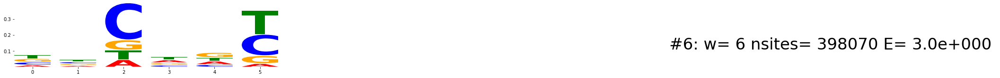

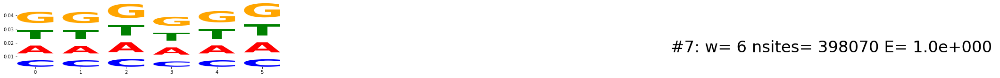

Thanks! Running co-occurance statistics on motifs 1 and 2
TTTTTTTTTT.T
.............G..............G
{-11: 17, 3: 25, 18: 30, -10: 39, 16: 66, -9: 76, -8: 113, 15: 115, -7: 134, 1: 136, -6: 169, -4: 177, 0: 205, -2: 207, -5: 211, -1: 214, -3: 219, 14: 352}
398070
Spacing Distribution Counts  
-11              17      
3                25      
18               30      
-10              39      
16               66      
-9               76      
-8               113     
15               115     
-7               134     
1                136     
-6               169     
-4               177     
0                205     
-2               207     
-5               211     
-1               214     
-3               219     
14               352     
--- 5.2058587074279785 seconds ---
----------  ZNF770_GG40NGTGAGA_Lysate_BatchAATA_Cycle3_R1  ---------


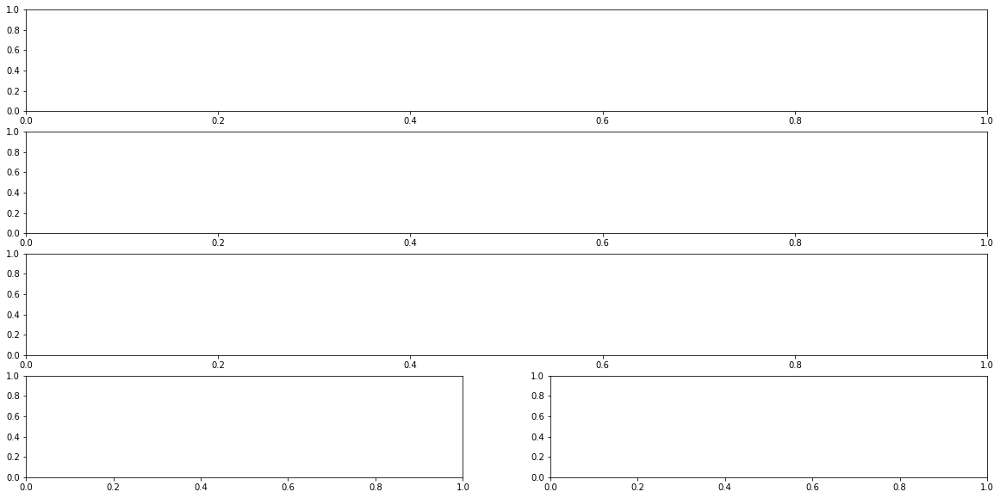

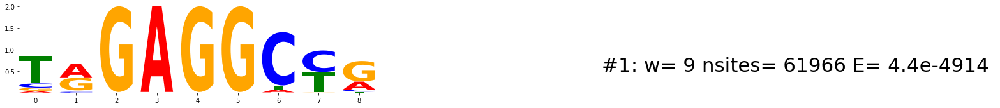

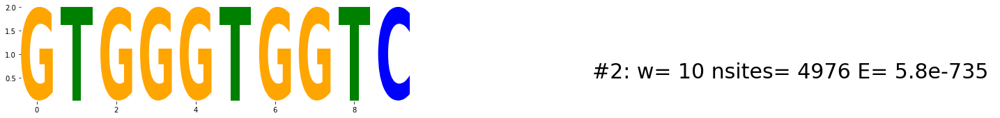

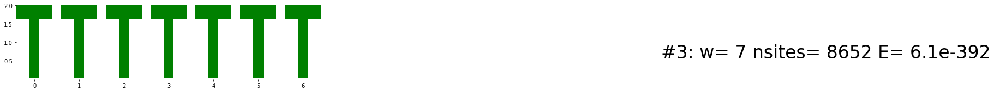

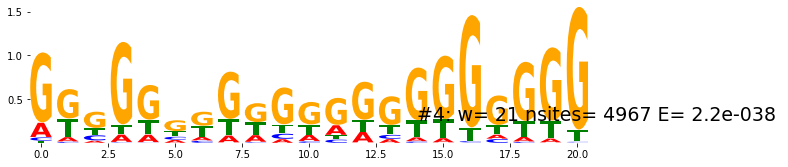

...

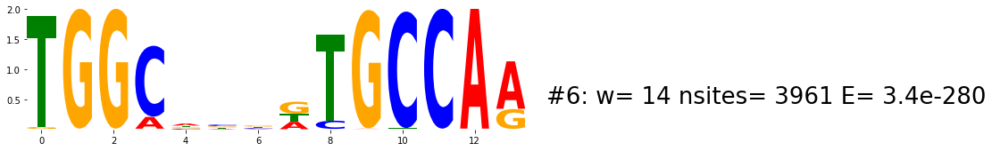

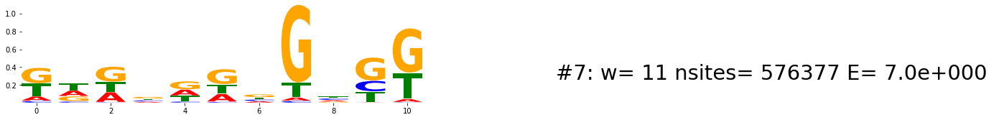

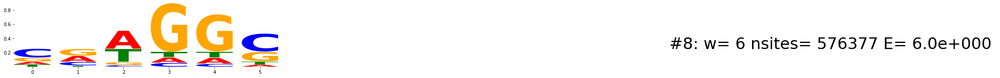

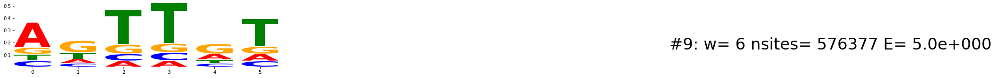

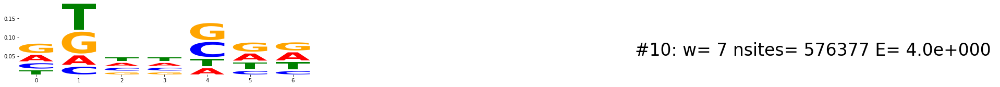

Thanks! Running co-occurance statistics on motifs 1 and 2
T.GAGGC..
GTGGGTGGTC
{16: 1, -21: 1, -10: 1, 17: 1, 24: 2, -27: 2, -12: 3, 12: 3, 10: 3, 23: 3}
576377
Spacing Distribution Counts  
16               1       
-21              1       
-10              1       
17               1       
24               2       
-27              2       
-12              3       
12               3       
10               3       
23               3       
--- 6.5862720012664795 seconds ---
----------  ZNF322_AC40NGATGTT_Lysate_BatchAATA_Cycle3_R1  ---------


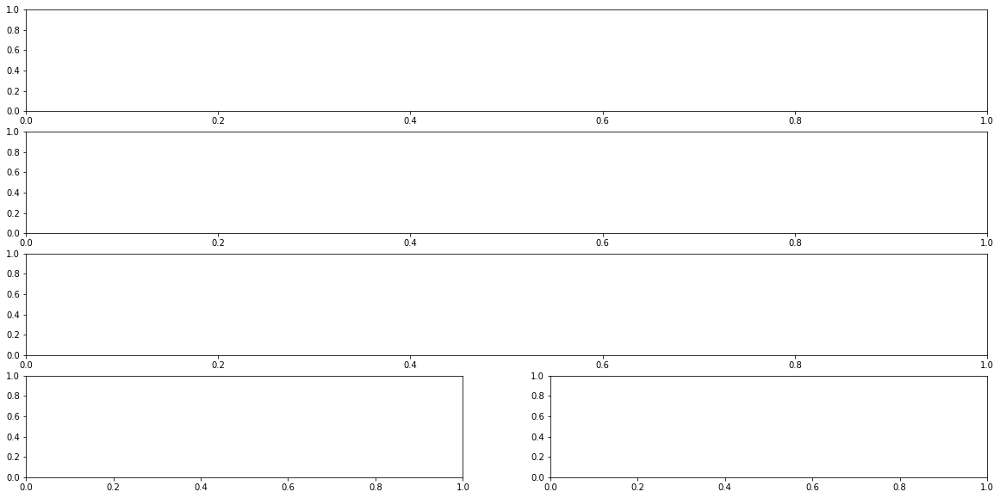

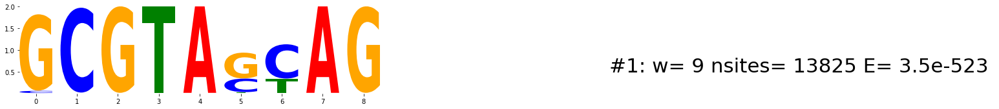

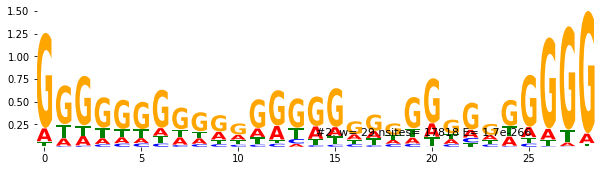

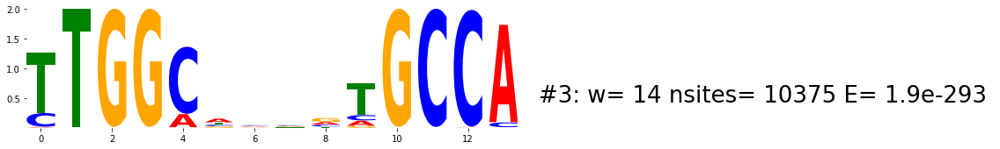

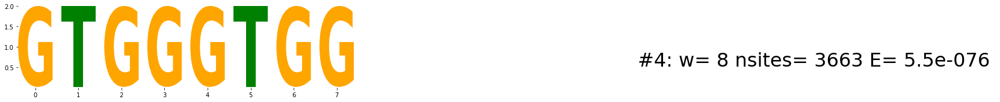

...

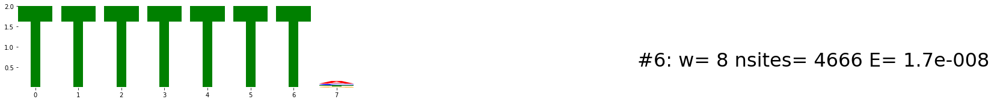

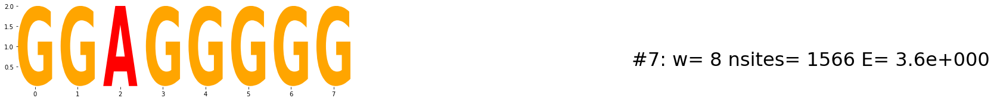

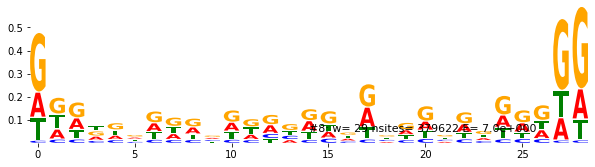

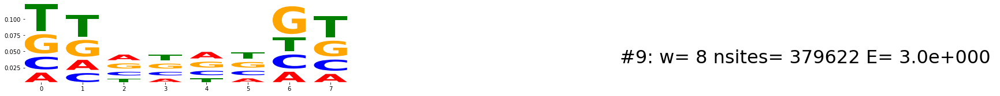

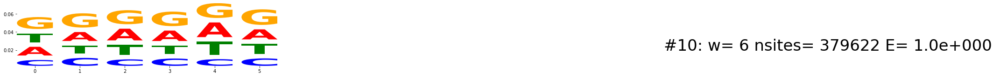

Thanks! Running co-occurance statistics on motifs 1 and 2
GCGTA..AG
G.........................GGG
{29: 1, -11: 1, -6: 3, 30: 4, 16: 7, 28: 8, -10: 9, 1: 10, 2: 10, 15: 22, 31: 22, -9: 25, 6: 38, 17: 39, 14: 41, 5: 42, 11: 44, 8: 45, 4: 45, 12: 46, 13: 47, 10: 47, 7: 52, 9: 52, -8: 62, -5: 108, 3: 121, 18: 129, -2: 165, 0: 175}
379622
Spacing Distribution Counts  
29               1       
-11              1       
-6               3       
30               4       
16               7       
28               8       
-10              9       
1                10      
2                10      
15               22      
31               22      
-9               25      
6                38      
17               39      
14               41      
5                42      
11               44      
8                45      
4                45      
12               46      
13               47      
10               47      
7                52      
9                52      
-8        

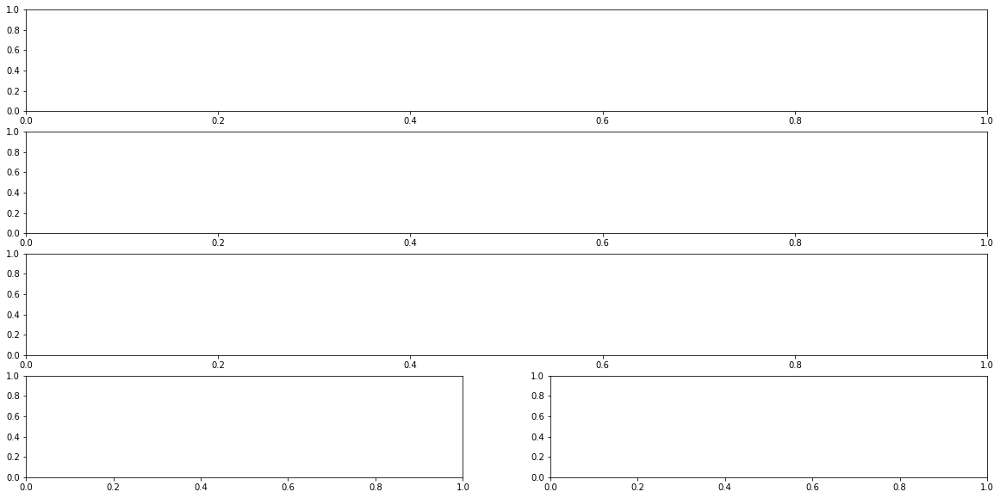

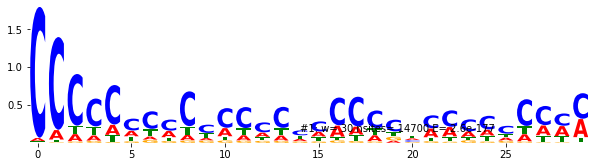

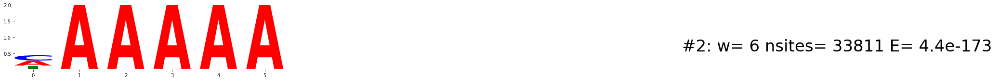

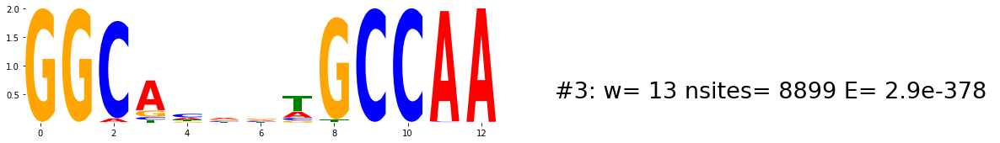

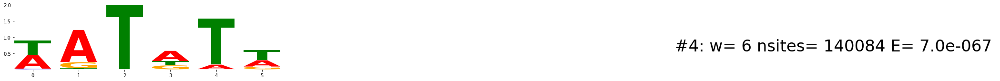

...

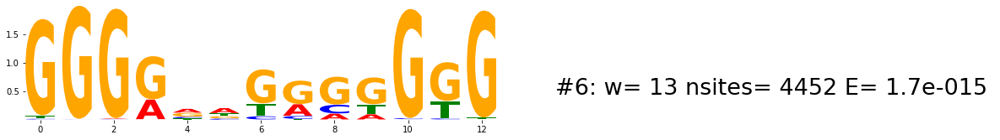

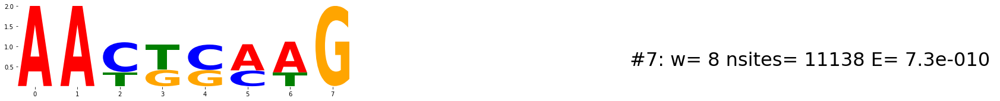

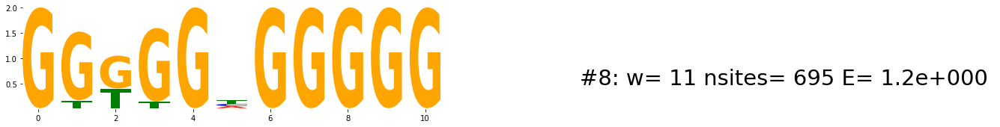

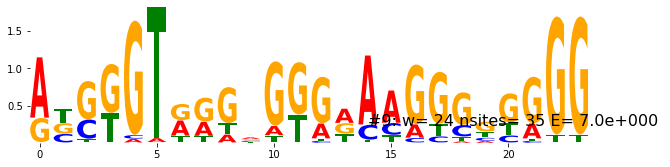

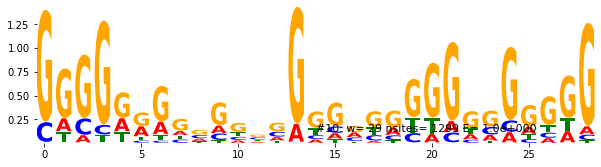

Thanks! Running co-occurance statistics on motifs 1 and 2
CCC...........................
.AAAAA
{-34: 1, -33: 3, 10: 3, -31: 4, -30: 6, 6: 6, -9: 9, -32: 9, 9: 10, -27: 10, 8: 10, -29: 11, -7: 11, -4: 12, 7: 12, -6: 14, -26: 14, -18: 17, -24: 17, -25: 17, -8: 17, -19: 17, -28: 18, -16: 18, -23: 18, -3: 20, -11: 22, -17: 22, -21: 23, -13: 23, -5: 24, -20: 24, -2: 25, -15: 26, -12: 27, -22: 27, -10: 28, -14: 30}
503412
Spacing Distribution Counts  
-34              1       
-33              3       
10               3       
-31              4       
-30              6       
6                6       
-9               9       
-32              9       
9                10      
-27              10      
8                10      
-29              11      
-7               11      
-4               12      
7                12      
-6               14      
-26              14      
-18              17      
-24              17      
-25              17      
-8               17      
-19

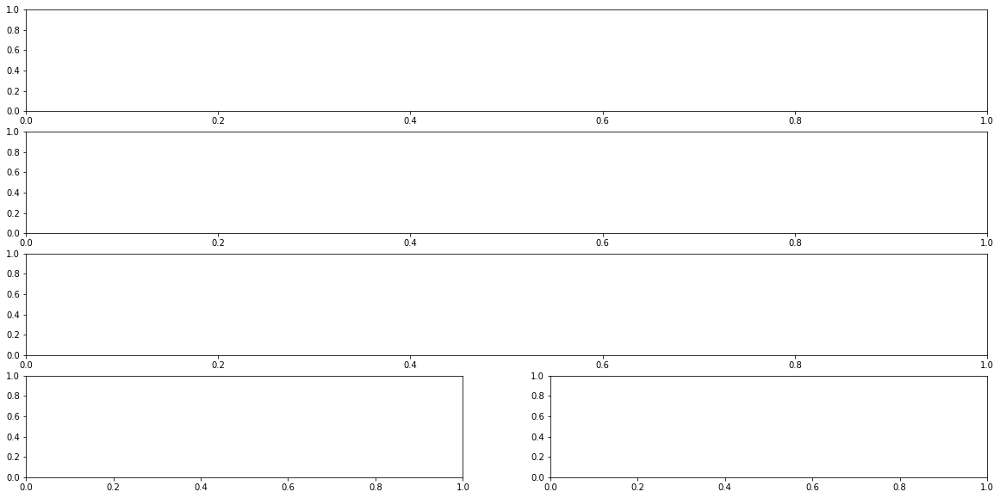

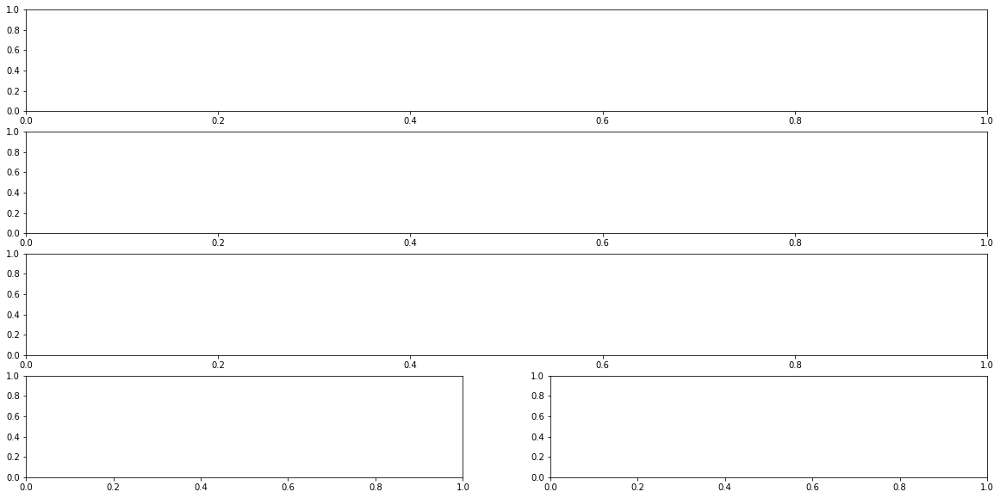

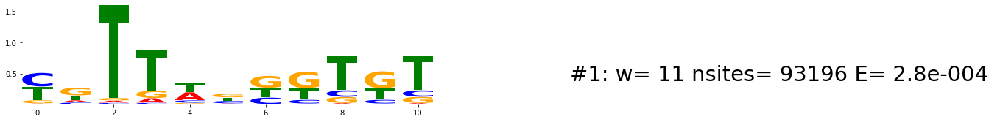

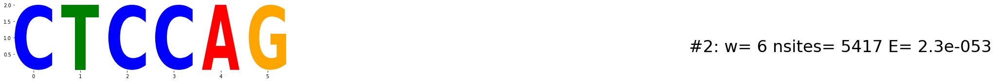

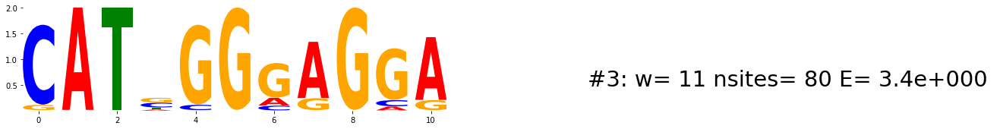

...

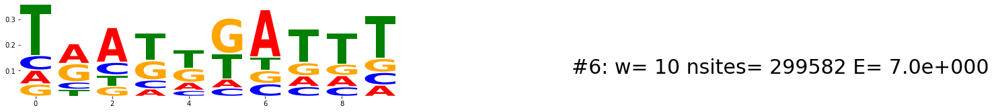

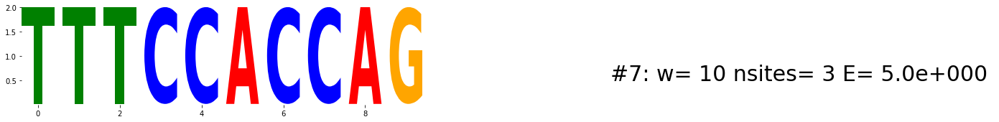

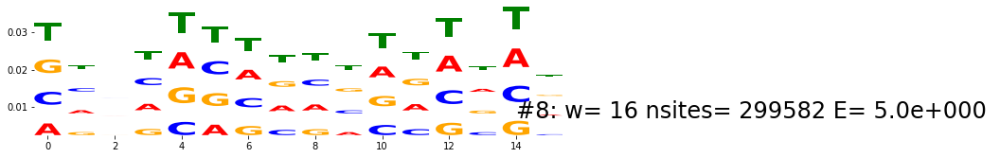

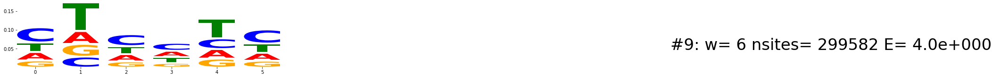

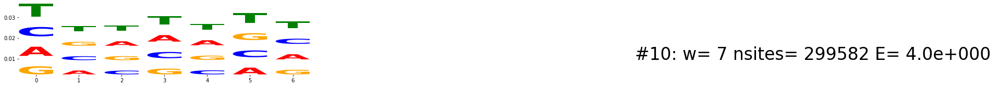

Thanks! Running co-occurance statistics on motifs 1 and 2
..TT.......
CTCCAG
{26: 1, 29: 1, 25: 2, 27: 2, 24: 3, 21: 4, -34: 5, -33: 5, 23: 8, 20: 9, 19: 9, 22: 9, 18: 12, -32: 13, 15: 13, 17: 17, 16: 17, -29: 18, -26: 19, -30: 19, 12: 22, 13: 23, -25: 24, 14: 25, 11: 25, -31: 27, -22: 28, -23: 29, -28: 31, 8: 31, -27: 32, -18: 34, 10: 35, -20: 36, -16: 37, 9: 40, -12: 40, -8: 40, -24: 40, -15: 42, -10: 43, -21: 43, -11: 43, -7: 45, -6: 46, -19: 47, -14: 48, -13: 48, -17: 49, 6: 49, 7: 50, -4: 51, -5: 53, -9: 54, 5: 55, 4: 80}
299582
Spacing Distribution Counts  
26               1       
29               1       
25               2       
27               2       
24               3       
21               4       
-34              5       
-33              5       
23               8       
20               9       
19               9       
22               9       
18               12      
-32              13      
15               13      
17               17      
16            

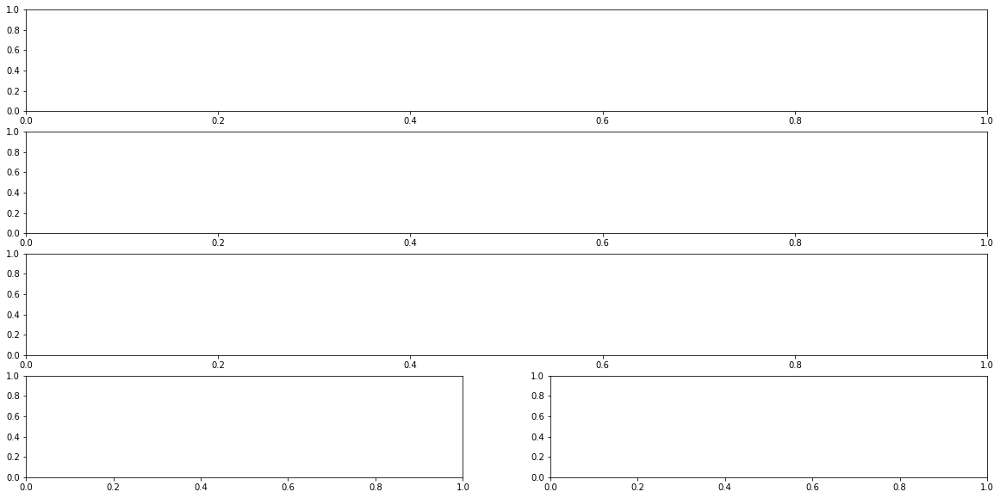

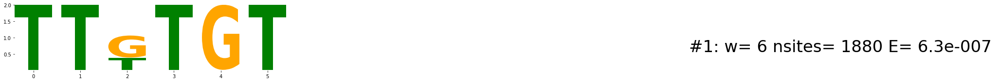

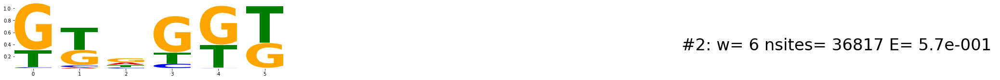

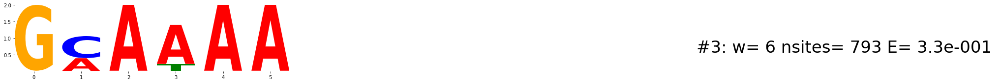

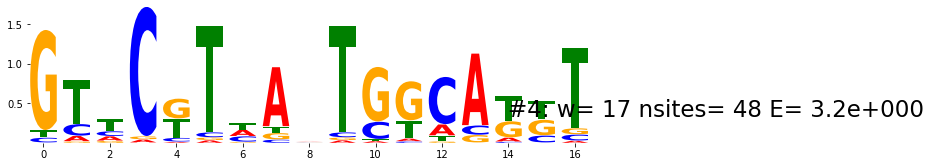

...

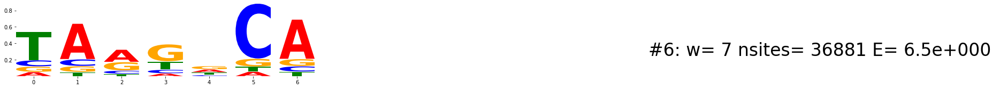

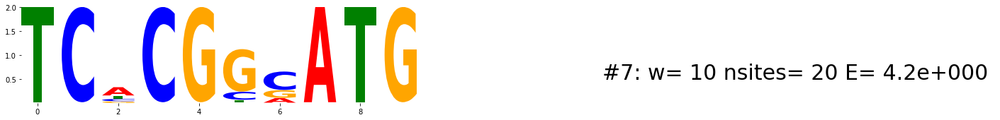

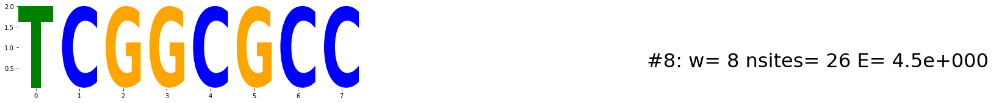

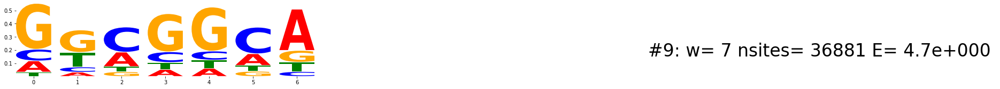

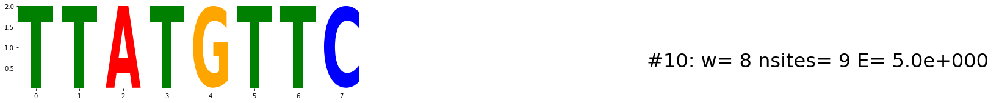

Thanks! Running co-occurance statistics on motifs 1 and 2
TT.TGT
......
{20: 32, 22: 32, 18: 44, 33: 53, 10: 58, 14: 59, 15: 61, 23: 62, 4: 63, 7: 64, 11: 69, 9: 71, 31: 74, 25: 74, 16: 76, 6: 76, 28: 77, 27: 78, 12: 79, 24: 79, 26: 82, 34: 82, 32: 85, 29: 86, 13: 88, 30: 90, 17: 94, 21: 96, 8: 98, 2: 112, 5: 113, 1: 118, 3: 120, 19: 121, 0: 140}
36881
Spacing Distribution Counts  
20               32      
22               32      
18               44      
33               53      
10               58      
14               59      
15               61      
23               62      
4                63      
7                64      
11               69      
9                71      
31               74      
25               74      
16               76      
6                76      
28               77      
27               78      
12               79      
24               79      
26               82      
34               82      
32               85      
29               

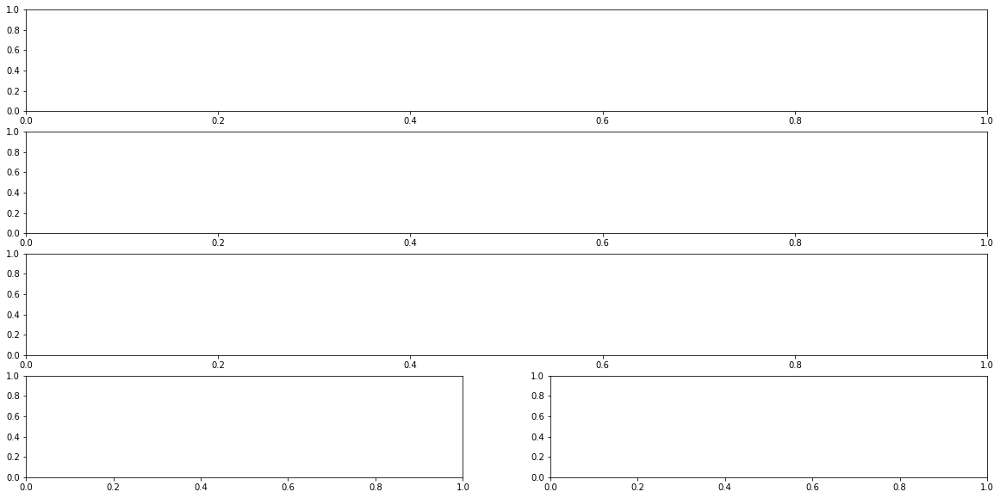

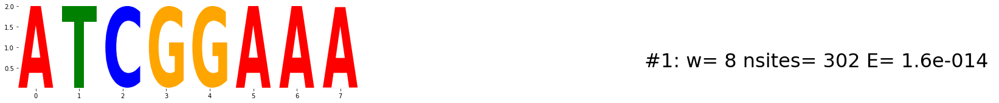

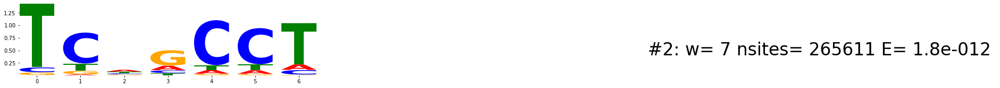

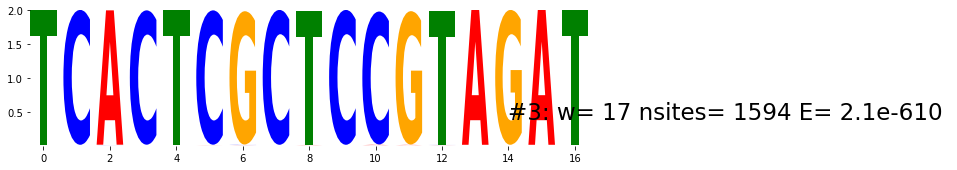

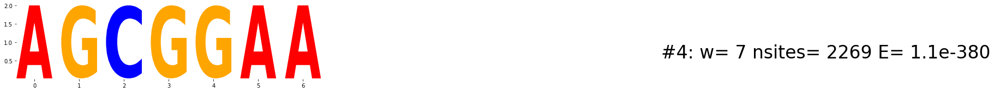

...

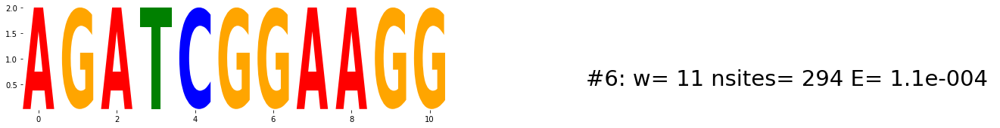

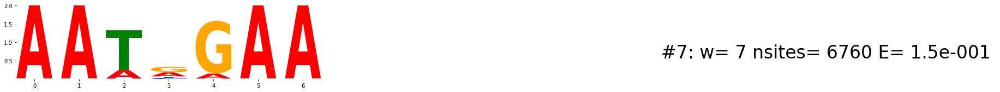

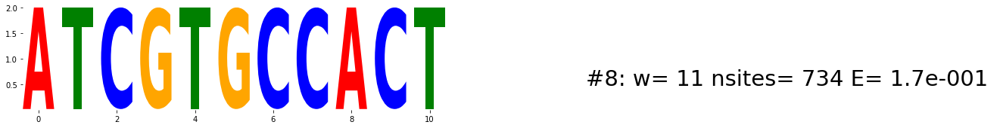

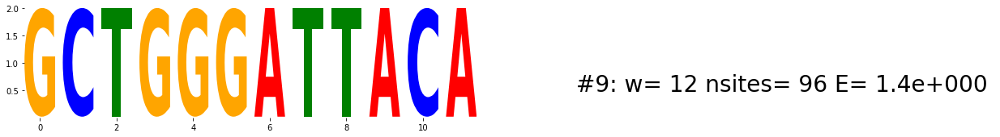

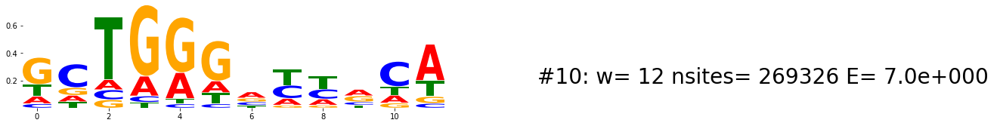

Thanks! Running co-occurance statistics on motifs 1 and 2
ATCGGAAA
T...C..
{-15: 1, 5: 1, -14: 1, -10: 1, -9: 1, 12: 1, 8: 1, -8: 1, 16: 2, 14: 2, 15: 3, 30: 3, 13: 3, 2: 3, 46: 3, 7: 3, 11: 3, 17: 3, 22: 4, 25: 4, 38: 4, 47: 4, 9: 4, 19: 4, 28: 4, 23: 4, 45: 4, 10: 4, 24: 4, 27: 4, 35: 5, 42: 5, 43: 6, 21: 6, 36: 6, 29: 6, 18: 8, 33: 8, 26: 8, 37: 9, 44: 9, 34: 10, 41: 10, 31: 11, 39: 11, 40: 12, 32: 12, 20: 14}
269326
Spacing Distribution Counts  
-15              1       
5                1       
-14              1       
-10              1       
-9               1       
12               1       
8                1       
-8               1       
16               2       
14               2       
15               3       
30               3       
13               3       
2                3       
46               3       
7                3       
11               3       
17               3       
22               4       
25               4       
38               4       


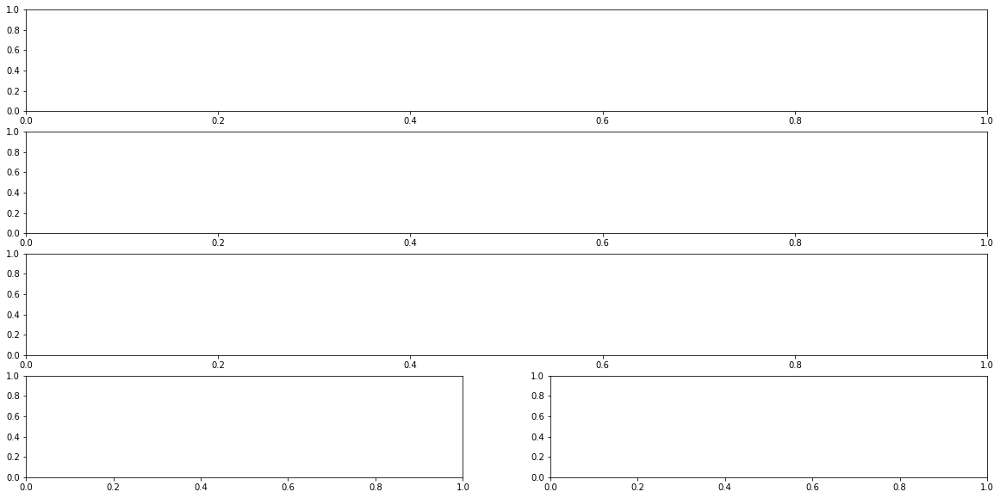

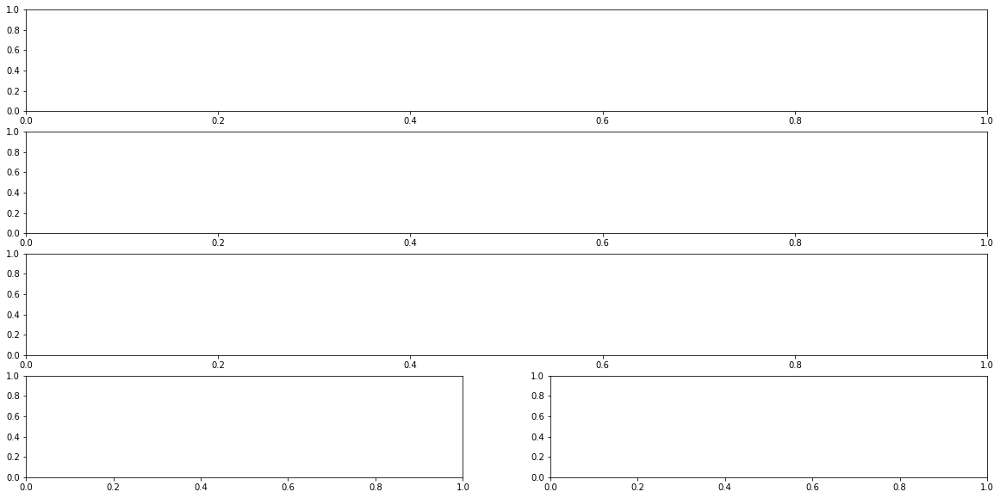

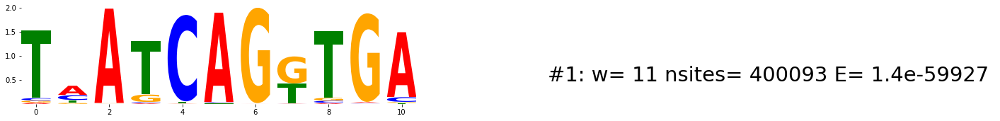

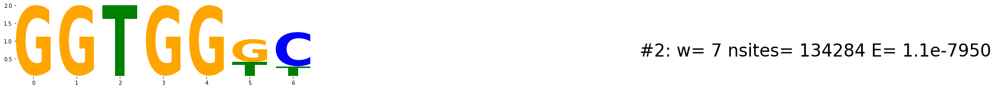

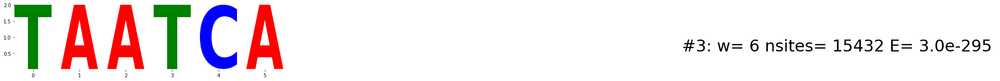

...

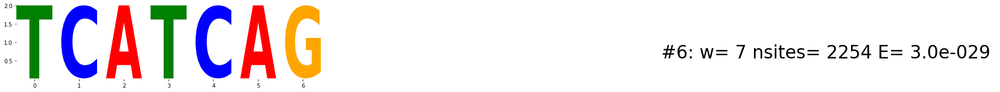

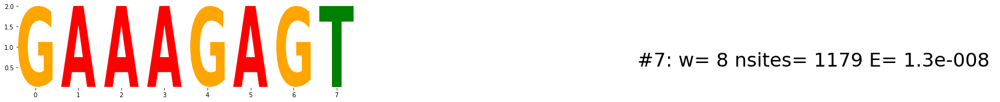

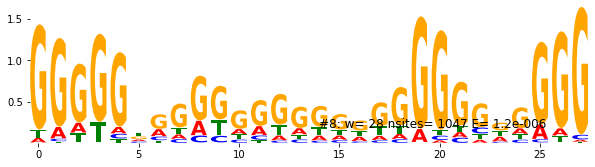

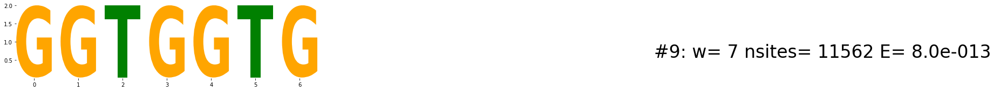

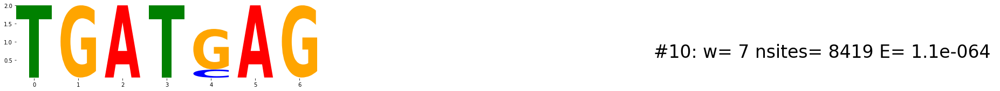

Thanks! Running co-occurance statistics on motifs 1 and 2
T.ATCAG.TGA
GGTGG..
{29: 30, -11: 44, 28: 62, -33: 64, 27: 86, -32: 118, -30: 134, 25: 150, -31: 160, -29: 182, 26: 193, -26: 242, -28: 244, -25: 244, -27: 259, -24: 287, 5: 313, -23: 315, -22: 320, -21: 325, -17: 328, -16: 370, -19: 382, -18: 383, -20: 398, 24: 416, 6: 449, -14: 449, 23: 464, -15: 592, 7: 601, -13: 787, 22: 817, 8: 943, 15: 1167, 14: 1202, 17: 1432, 16: 1459, 19: 1992, 18: 2026, 21: 2141, 9: 2189, 10: 2360, 20: 2376, 11: 2797, -12: 4699, 12: 5703, 13: 6127}
515895
Spacing Distribution Counts  
29               30      
-11              44      
28               62      
-33              64      
27               86      
-32              118     
-30              134     
25               150     
-31              160     
-29              182     
26               193     
-26              242     
-28              244     
-25              244     
-27              259     
-24              287     
5        

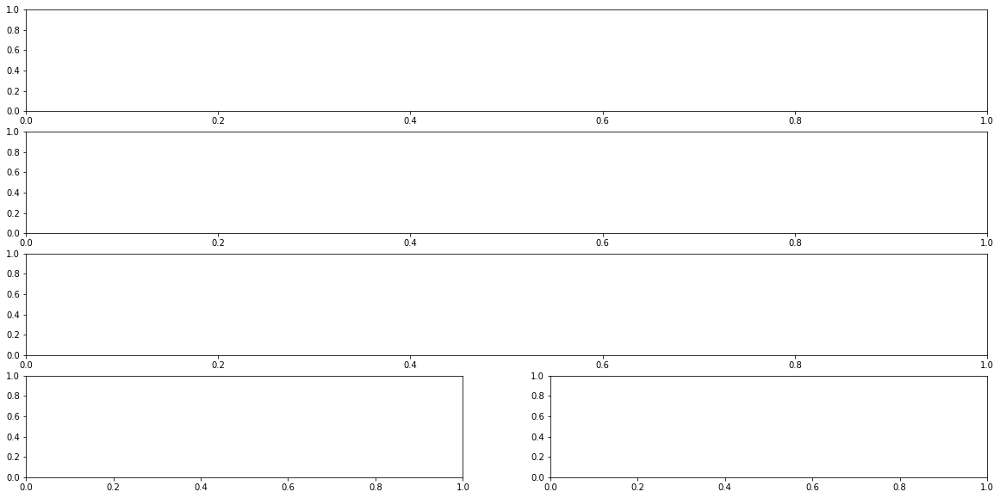

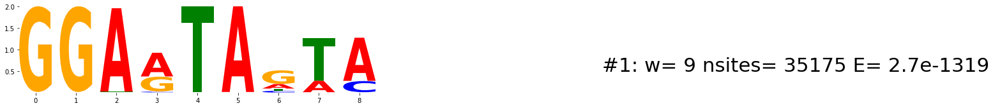

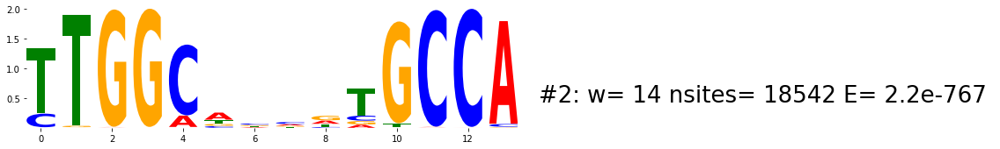

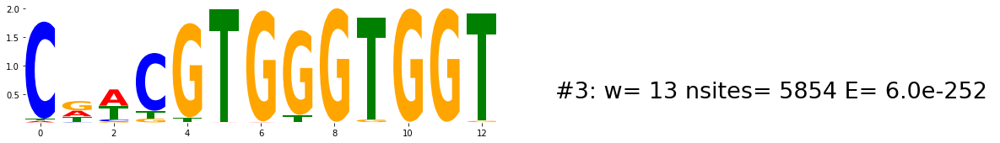

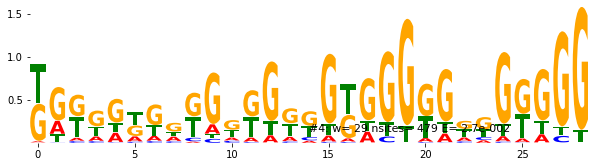

...

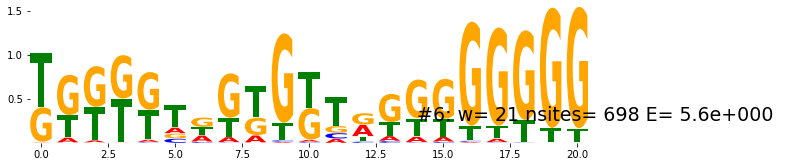

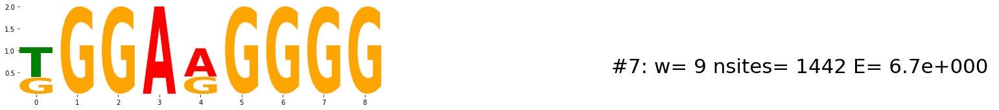

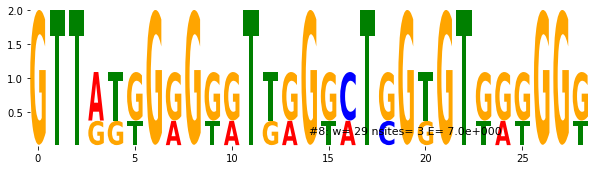

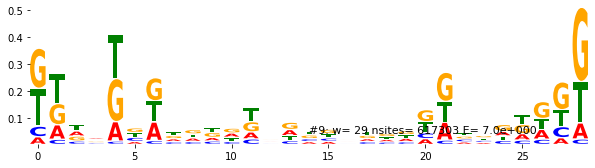

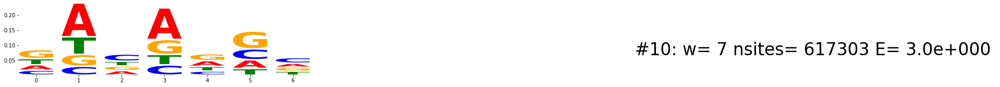

Thanks! Running co-occurance statistics on motifs 1 and 2
GGA.TA.TA
TTGGC.....GCCA
{-14: 1, 23: 1, -18: 1, -15: 1, 24: 1, 29: 1}
617303
Spacing Distribution Counts  
-14              1       
23               1       
-18              1       
-15              1       
24               1       
29               1       
--- 6.998107194900513 seconds ---
----------  ZNF280A_TC40NGTTTTG_IVT_BatchAATBA_Cycle3_R1  ---------
Thanks! Running co-occurance statistics on motifs 1 and 2
--- 0.044843435287475586 seconds ---
----------  ZNF582_CT40NCGGAGA_IVT_BatchAATBA_Cycle3_R1  ---------


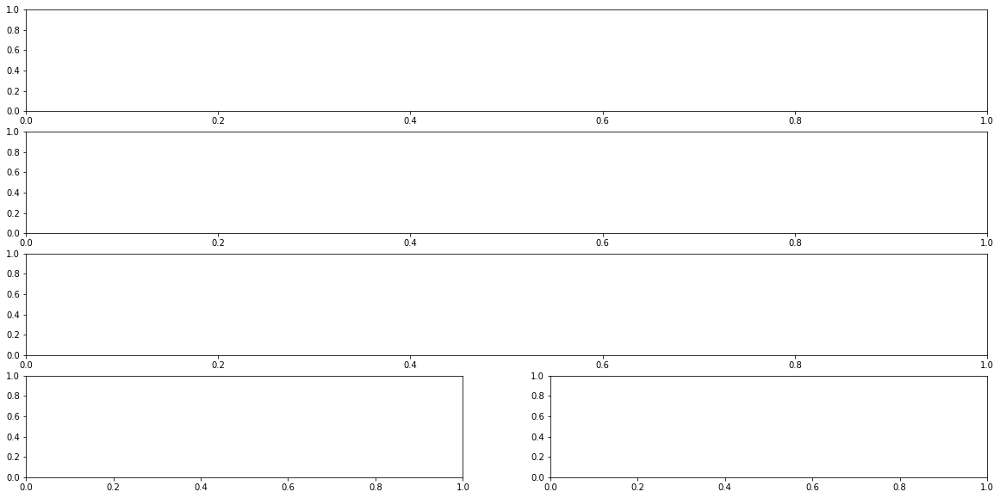

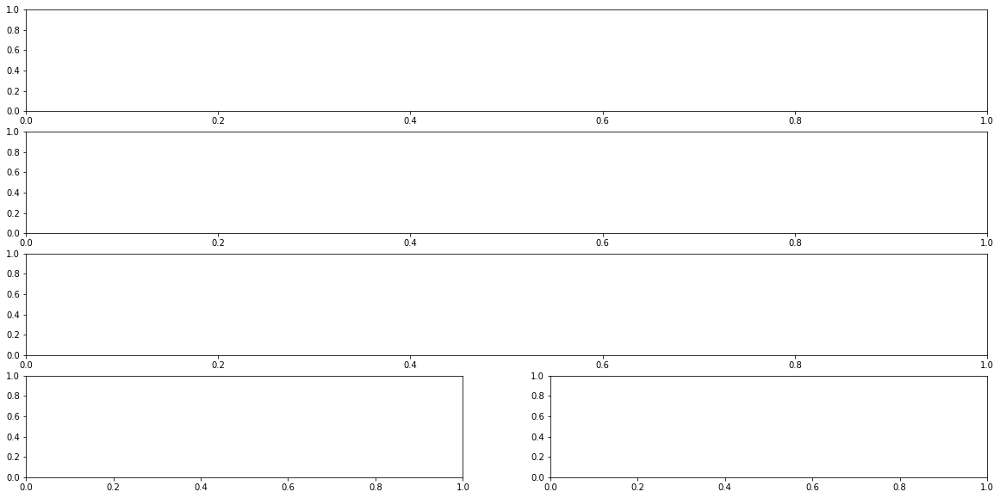

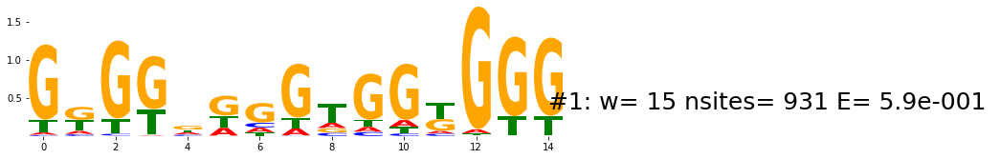

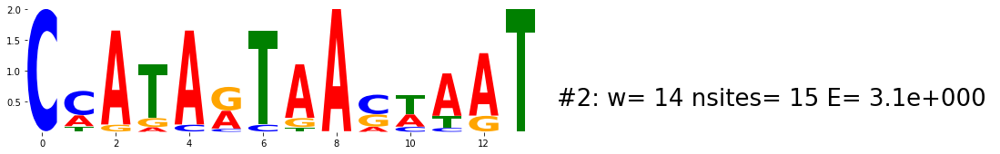

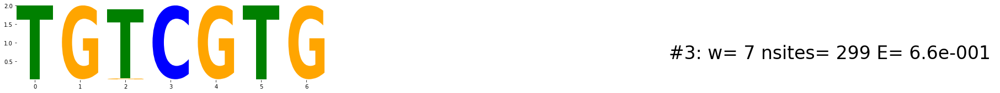

...

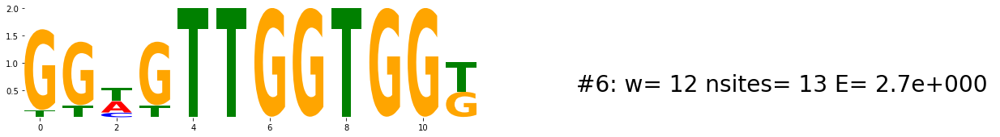

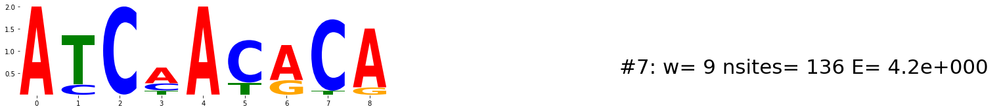

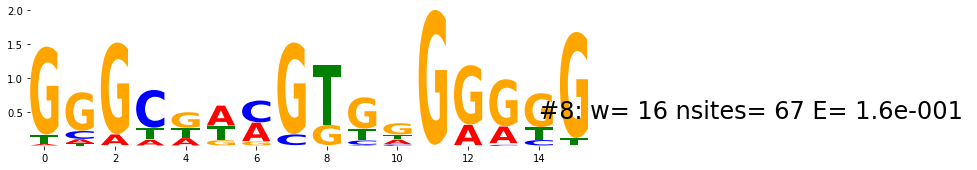

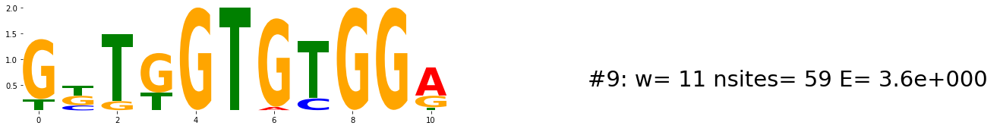

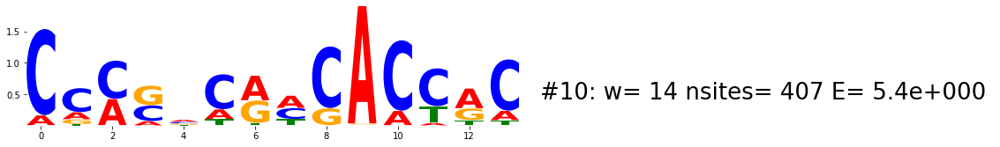

Thanks! Running co-occurance statistics on motifs 1 and 2
G.G....G.GG.GGG
C.A.A.T.A....T
{}
34556
Spacing Distribution Counts  
--- 3.485140800476074 seconds ---
----------  ZNF146_AA40NCCGCGT_IVT_BatchAATBA_Cycle3_R1  ---------


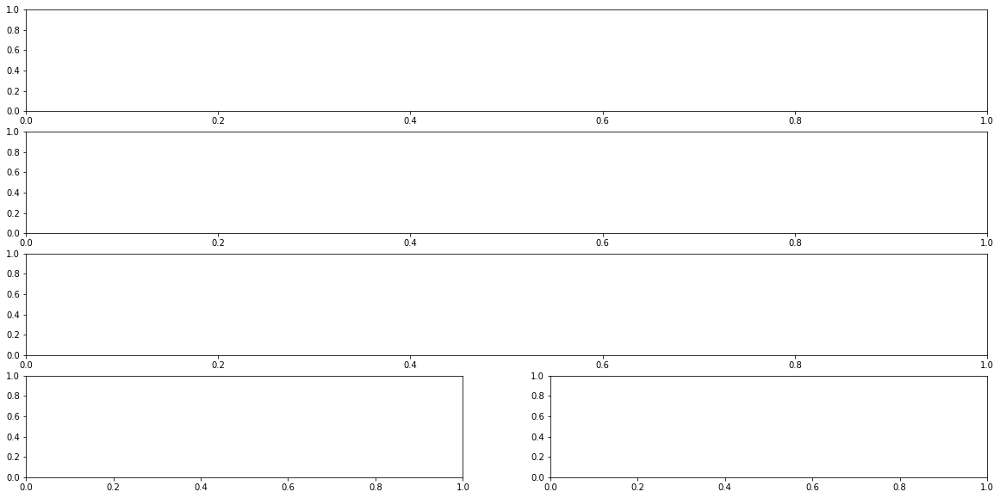

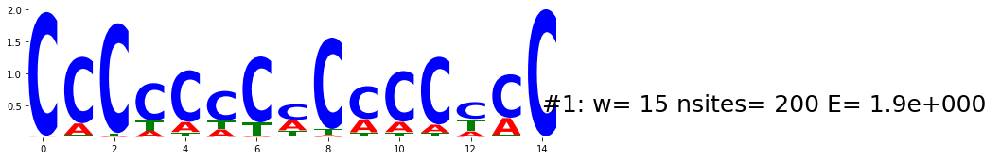

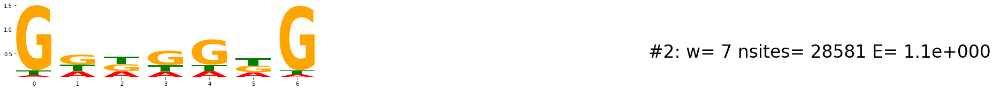

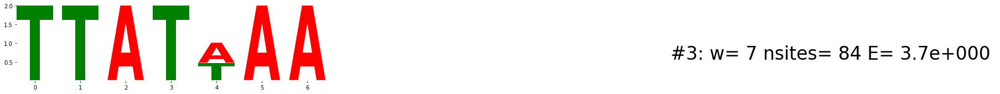

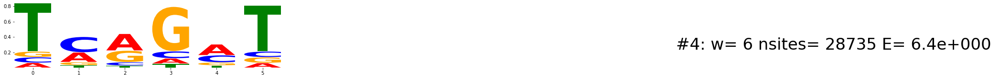

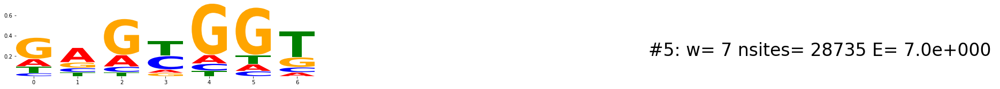

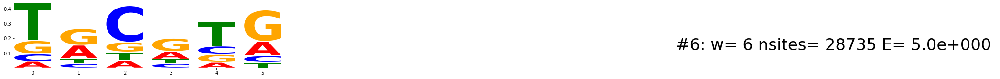

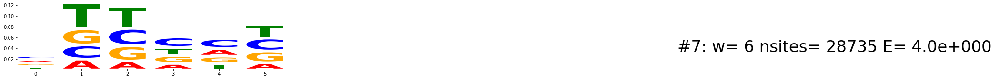

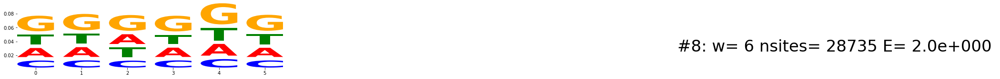

Thanks! Running co-occurance statistics on motifs 1 and 2
CCC.C.C.C.CC..C
G.....G
{}
28735
Spacing Distribution Counts  
--- 2.4067165851593018 seconds ---
----------  ZNF384_GG40NTAGTTT_IVT_BatchAATBA_Cycle3_R1  ---------


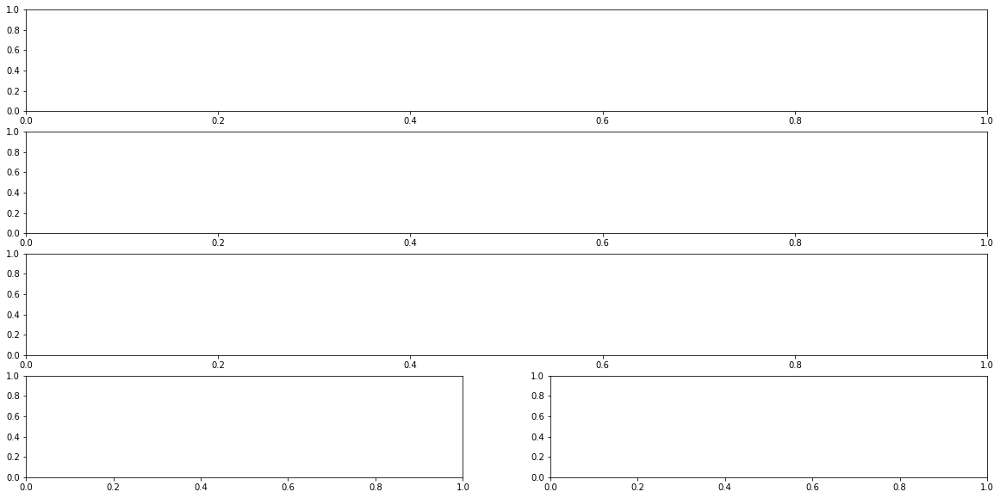

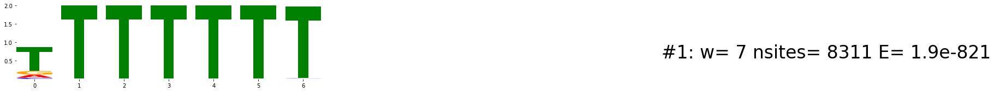

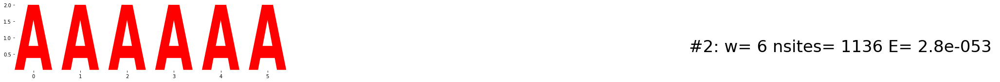

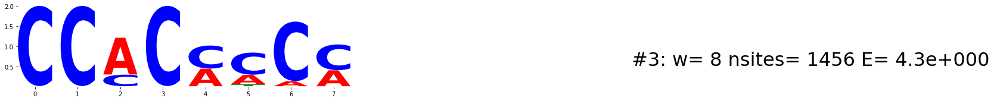

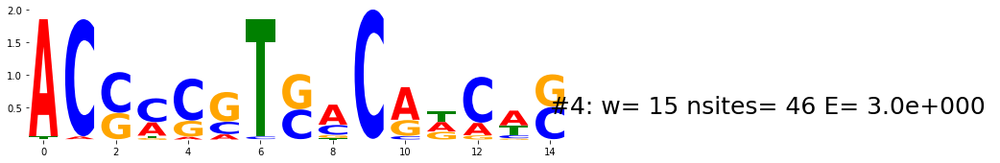

...

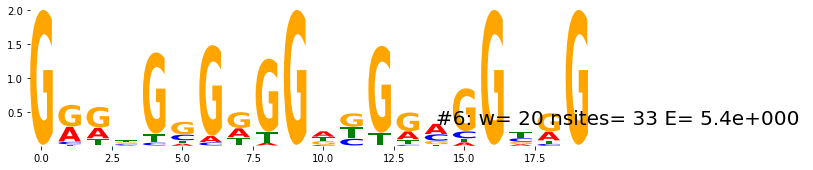

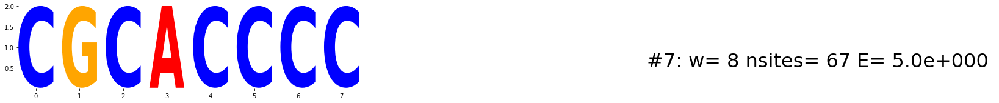

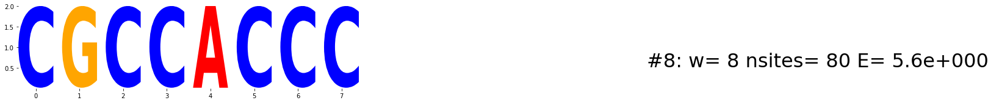

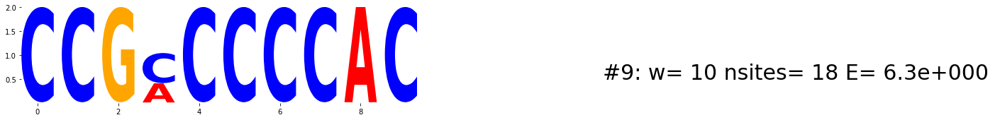

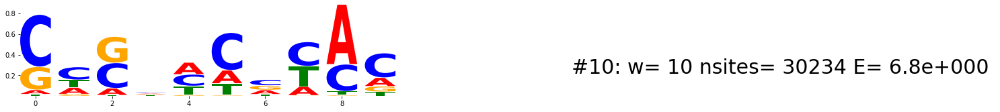

Thanks! Running co-occurance statistics on motifs 1 and 2
TTTTTTT
AAAAAA
{14: 1, 27: 1, -33: 1, 15: 1, -9: 1, 10: 1, -23: 1, 16: 1, -11: 1, -31: 1, -20: 1, -8: 1, 13: 1, 28: 1, 26: 1, -32: 1, -22: 2, 32: 2, 30: 2, -7: 2, -29: 2, -30: 3, 22: 3, 33: 3, -27: 3, -14: 3, 11: 3, 25: 3, 29: 3, -17: 3, 23: 4, -19: 4, -24: 4, 12: 4, 18: 4, 19: 4, 17: 4, -28: 5, 24: 5, -26: 5, 21: 6, -18: 6, 20: 6, -21: 6, -25: 7, -13: 7, -16: 9, -15: 10}
30234
Spacing Distribution Counts  
14               1       
27               1       
-33              1       
15               1       
-9               1       
10               1       
-23              1       
16               1       
-11              1       
-31              1       
-20              1       
-8               1       
13               1       
28               1       
26               1       
-32              1       
-22              2       
32               2       
30               2       
-7               2       
-29        

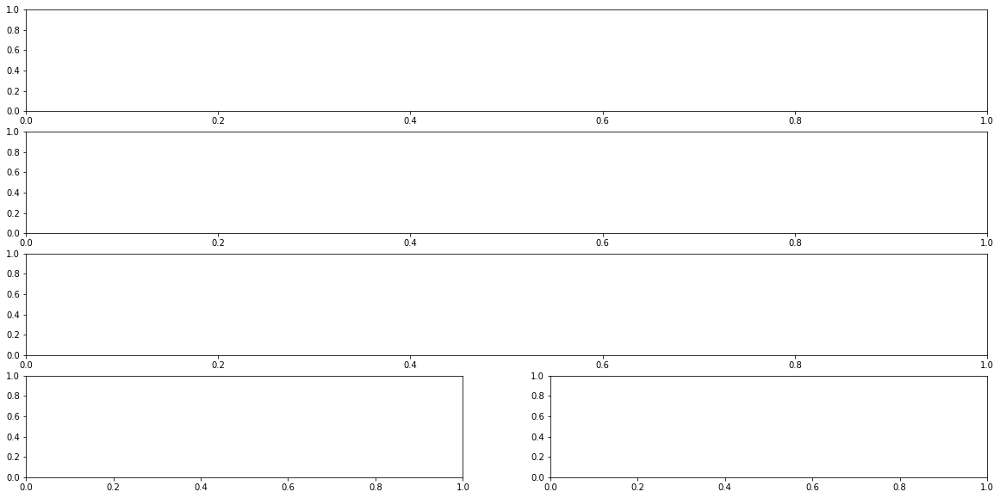

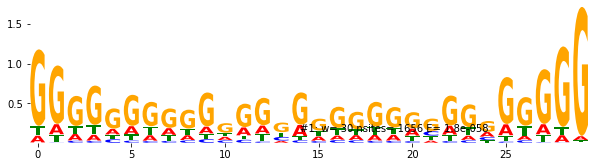

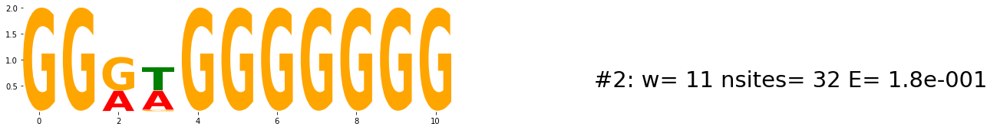

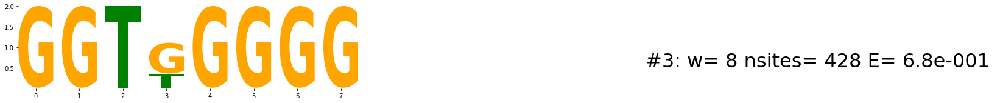

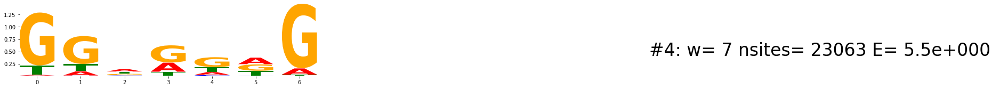

...

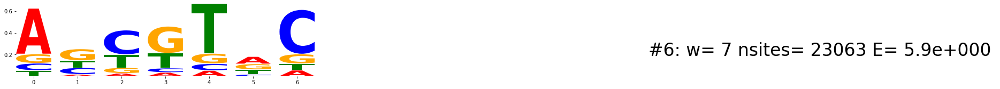

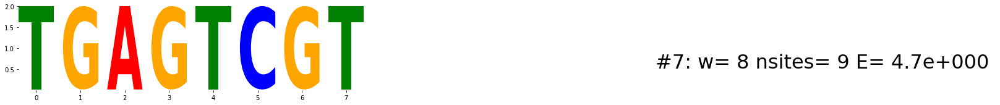

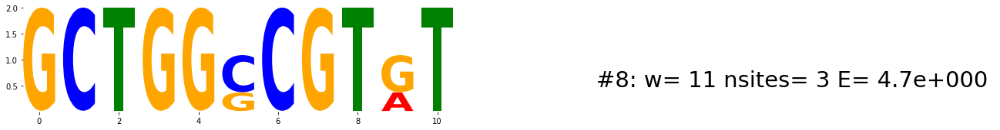

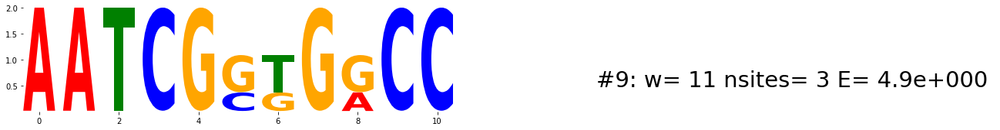

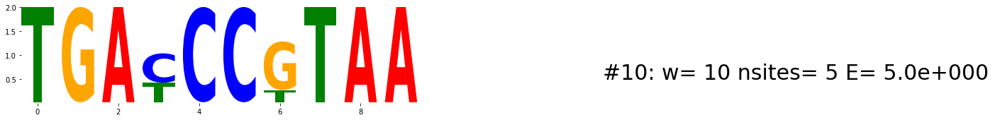

Thanks! Running co-occurance statistics on motifs 1 and 2
GG.........................GGG
GG..GGGGGGG
{7: 1, -1: 1, 9: 1, -29: 1, -9: 1, -2: 1, -17: 1, -8: 2, -12: 2, -10: 2, -5: 2, 8: 2, 6: 2, -6: 2, -11: 2, 1: 3, -3: 3, -24: 4, -20: 5, -19: 5, 4: 5, -22: 6, 5: 6, -21: 8, 0: 9, -23: 11}
23063
Spacing Distribution Counts  
7                1       
-1               1       
9                1       
-29              1       
-9               1       
-2               1       
-17              1       
-8               2       
-12              2       
-10              2       
-5               2       
8                2       
6                2       
-6               2       
-11              2       
1                3       
-3               3       
-24              4       
-20              5       
-19              5       
4                5       
-22              6       
5                6       
-21              8       
0                9       
-23              11      


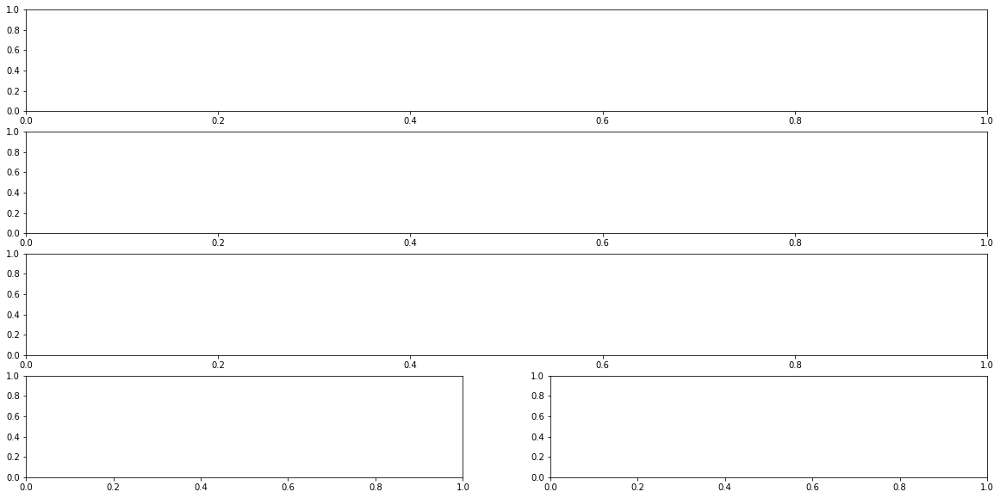

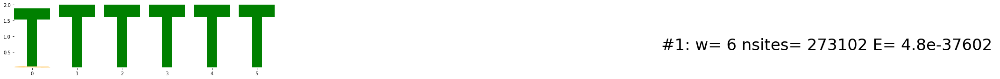

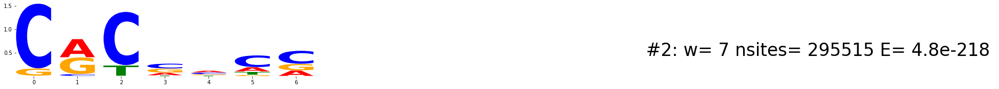

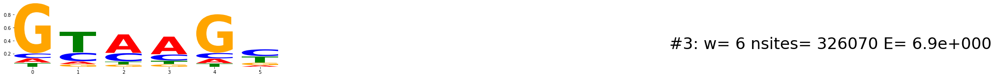

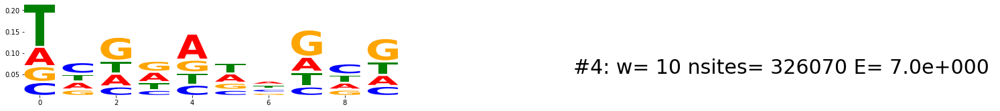

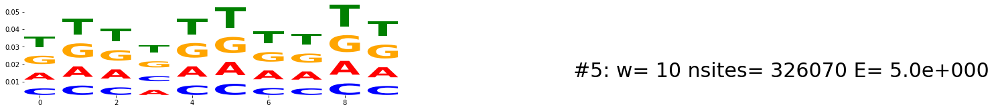

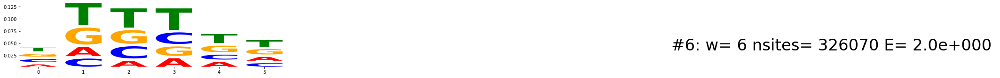

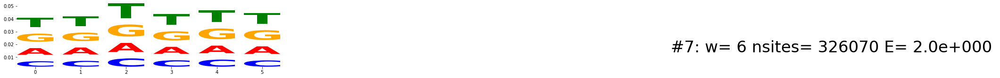

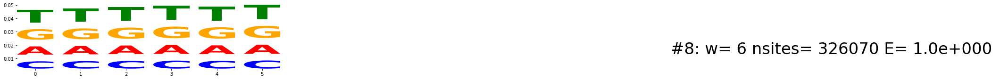

Thanks! Running co-occurance statistics on motifs 1 and 2
TTTTTT
C.C....
{-33: 203, -32: 347, -31: 468, -30: 651, 34: 728, -29: 781, -28: 1020, -27: 1128, -26: 1247, 33: 1335, -25: 1369, 32: 1459, 31: 1469, -24: 1523, 30: 1533, -23: 1598, 29: 1649, -22: 1711, 28: 1794, 27: 1822, 26: 1841, -21: 1945, 25: 1969, 24: 2045, 23: 2080, -20: 2143, 22: 2259, 21: 2341, -19: 2341, 20: 2416, -18: 2531, 19: 2592, 12: 2593, 18: 2609, 14: 2651, 15: 2670, 16: 2672, 17: 2678, 13: 2716, 6: 2723, 11: 2724, 7: 2730, -17: 2804, 10: 2826, -16: 2923, 8: 2964, -6: 2976, 9: 3068, -15: 3092, -14: 3368, -10: 3586, -13: 3612, -11: 3643, 5: 3693, -9: 3745, -12: 3766, -8: 3817, 3: 4923, -7: 5549, 4: 6666}
326070
Spacing Distribution Counts  
-33              203     
-32              347     
-31              468     
-30              651     
34               728     
-29              781     
-28              1020    
-27              1128    
-26              1247    
33               1335    
-25              1

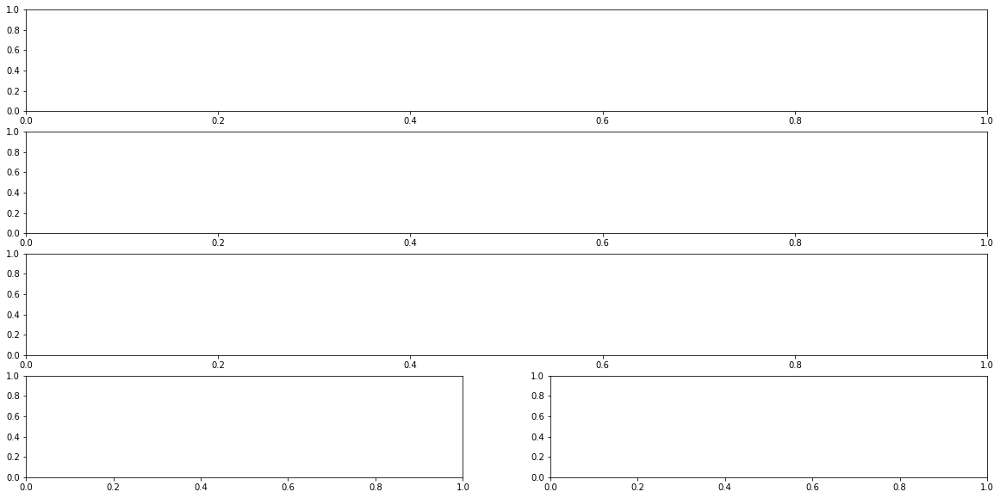

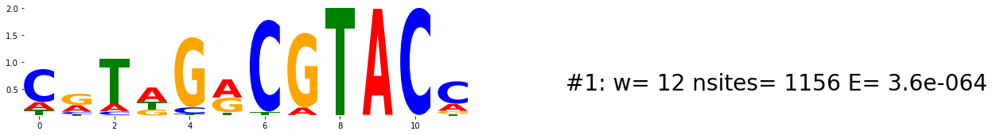

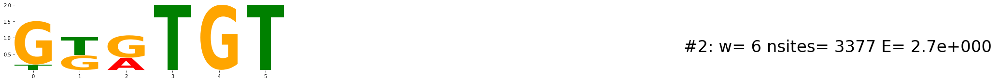

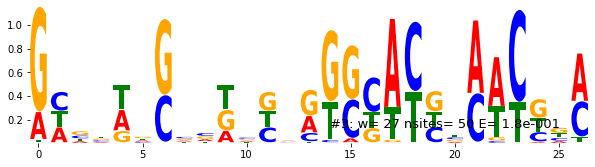

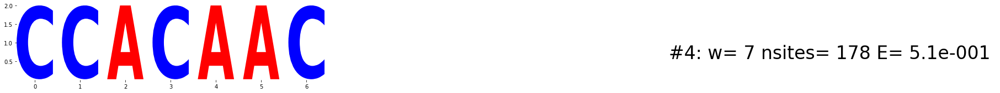

...

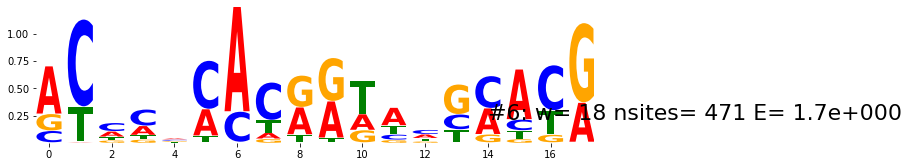

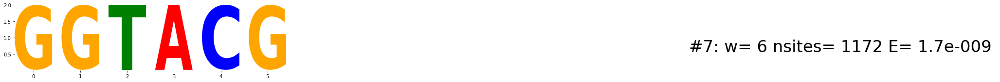

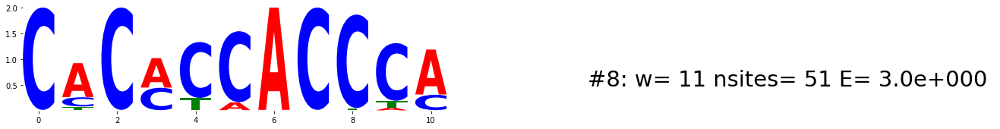

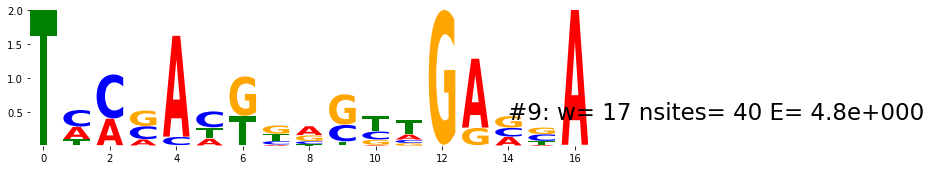

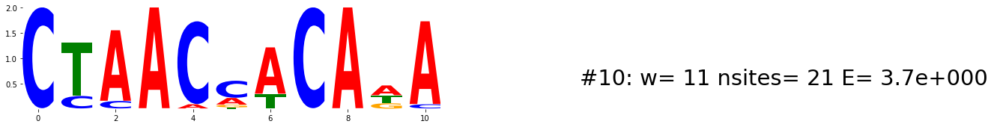

Thanks! Running co-occurance statistics on motifs 1 and 2
..T.G.CGTAC.
G..TGT
{-24: 1, 15: 1, 18: 1, -29: 1, -12: 1, 13: 1, -25: 1, 17: 1, 24: 1, 11: 1, -30: 1, -31: 1, 12: 2, -23: 2, -22: 2, -14: 2, -13: 2, 10: 2, 7: 2, -17: 2, 14: 2, 8: 2, 9: 2, 0: 3, -15: 3, 5: 4, -16: 4, 6: 11, 3: 23}
28563
Spacing Distribution Counts  
-24              1       
15               1       
18               1       
-29              1       
-12              1       
13               1       
-25              1       
17               1       
24               1       
11               1       
-30              1       
-31              1       
12               2       
-23              2       
-22              2       
-14              2       
-13              2       
10               2       
7                2       
-17              2       
14               2       
8                2       
9                2       
0                3       
-15              3       
5                4      

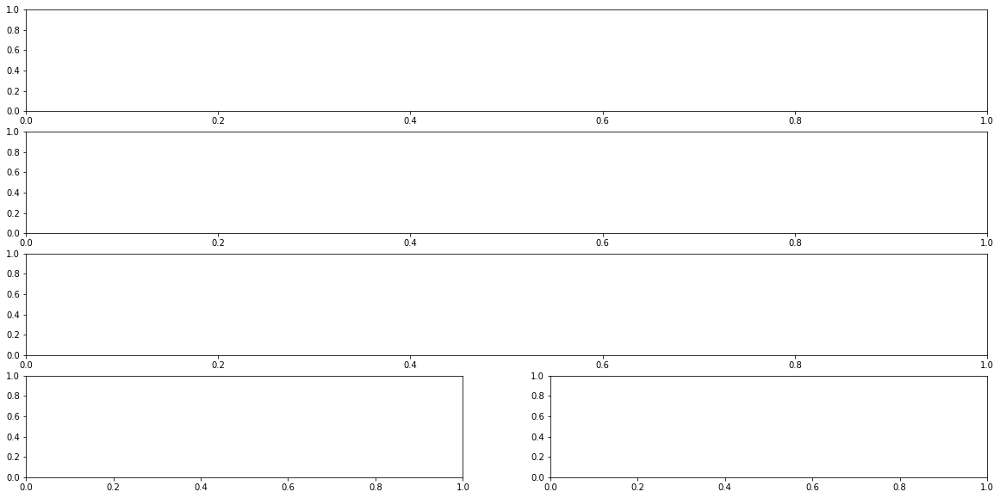

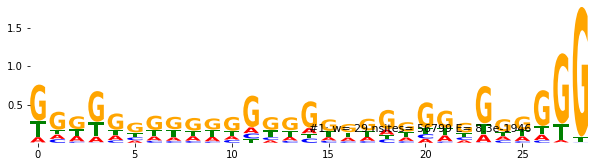

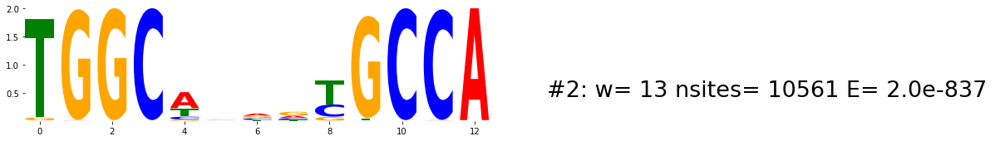

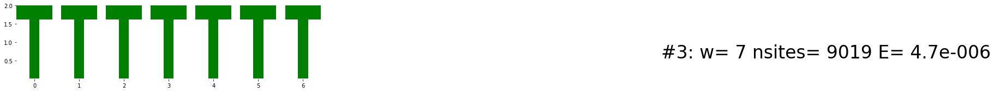

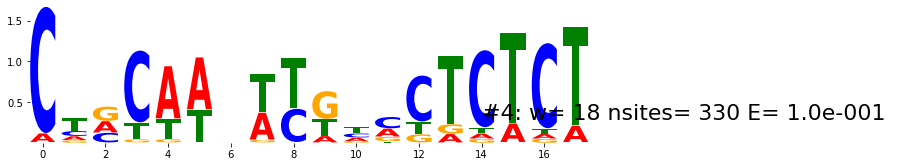

...

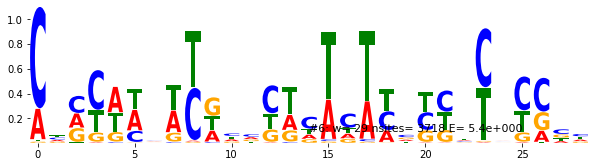

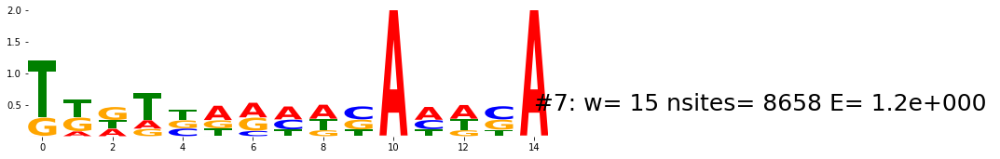

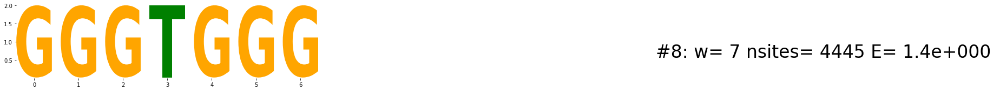

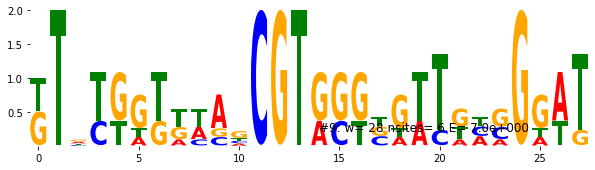

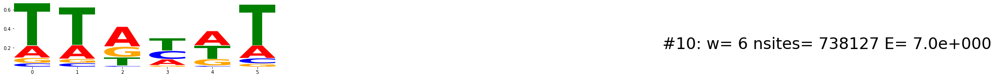

Thanks! Running co-occurance statistics on motifs 1 and 2
...........................GG
TGGC.....GCCA
{11: 3, 10: 7, 9: 22, 8: 23, 7: 37, 6: 67, -23: 71, 5: 73, -20: 95, 3: 97, 4: 98, -22: 113, 2: 138, 1: 160, 0: 168, -12: 198, -19: 200, -3: 215, -7: 223, -13: 230, -1: 234, -2: 235, -6: 235, -21: 237, -11: 239, -10: 242, -5: 251, -9: 260, -4: 261, -8: 271, -14: 554, -26: 1585}
738127
Spacing Distribution Counts  
11               3       
10               7       
9                22      
8                23      
7                37      
6                67      
-23              71      
5                73      
-20              95      
3                97      
4                98      
-22              113     
2                138     
1                160     
0                168     
-12              198     
-19              200     
-3               215     
-7               223     
-13              230     
-1               234     
-2               235     
-6         

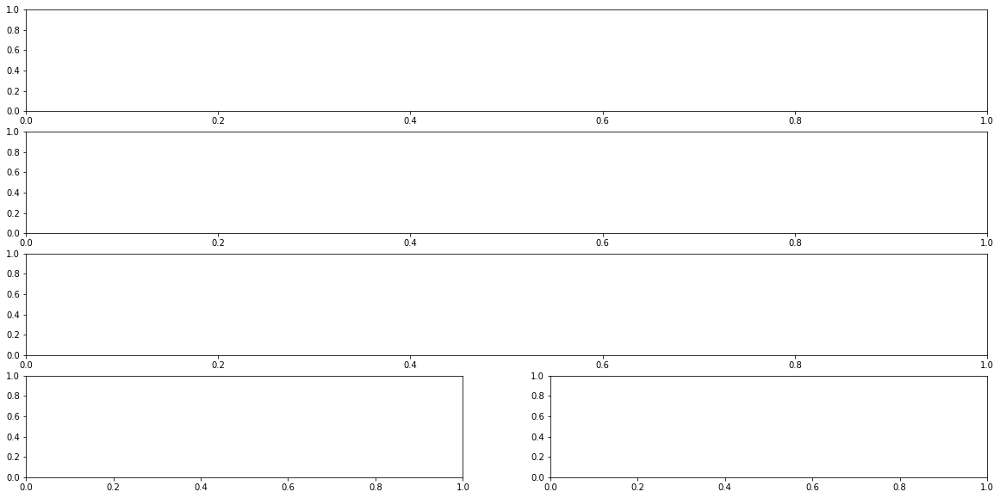

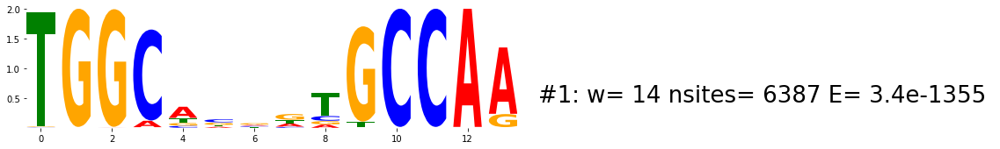

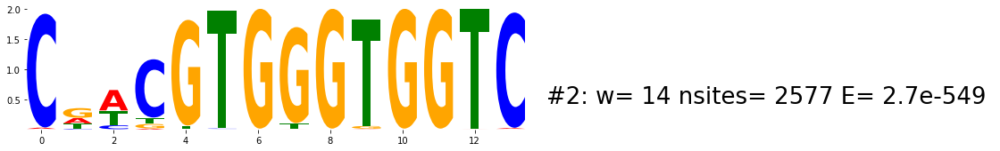

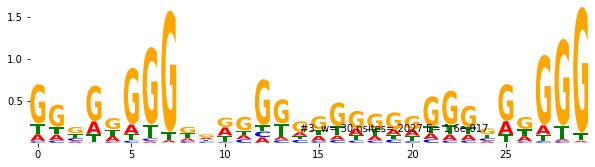

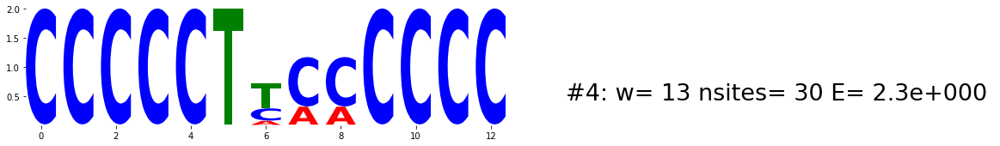

...

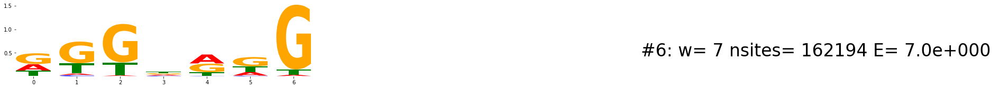

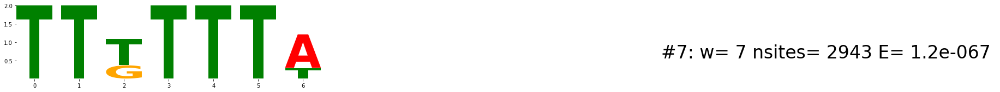

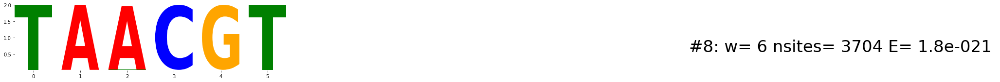

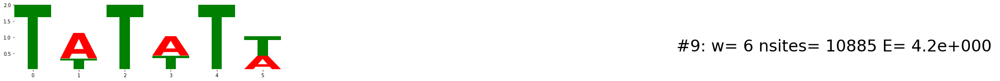

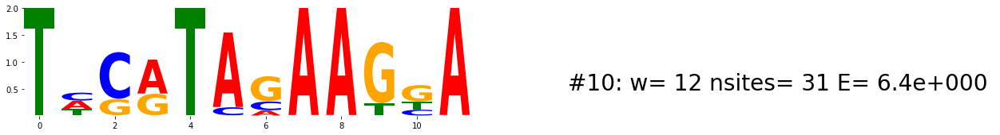

Thanks! Running co-occurance statistics on motifs 1 and 2
TGGC.....GCCAA
C..CGTGGGTGGTC
{}
162194
Spacing Distribution Counts  
--- 3.8513131141662598 seconds ---
----------  ZNF134_TA40NCGTCGG_IVT_BatchAATBA_Cycle3_R1  ---------


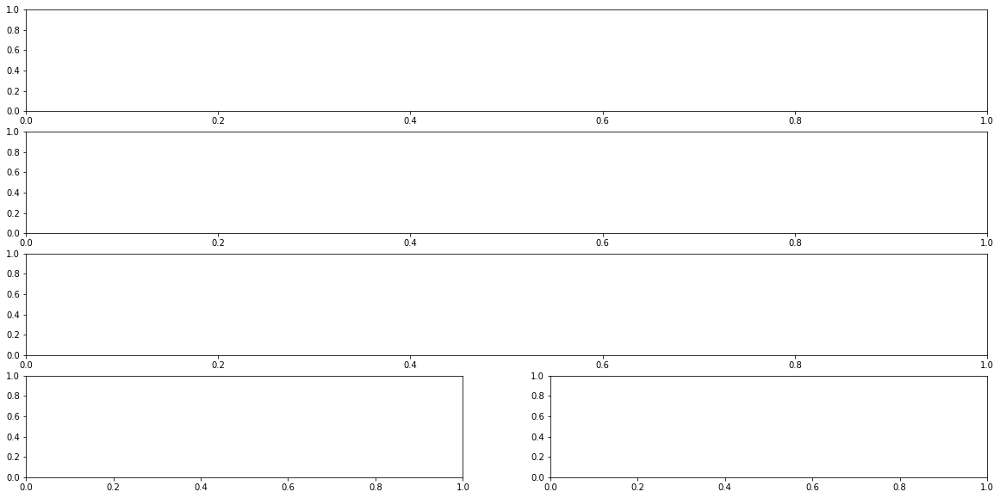

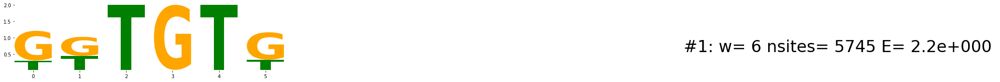

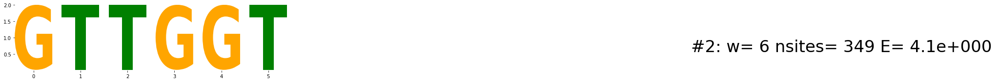

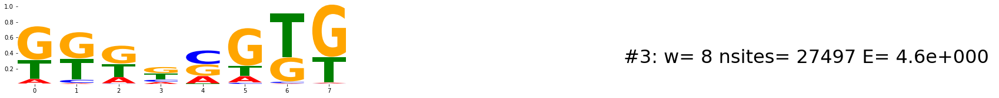

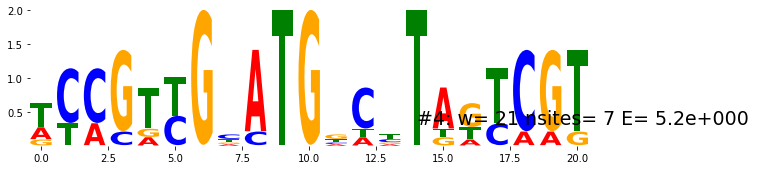

...

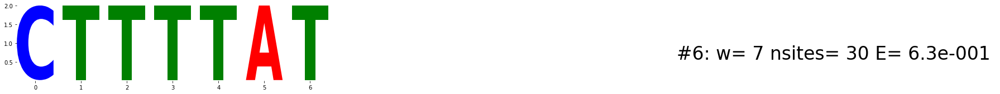

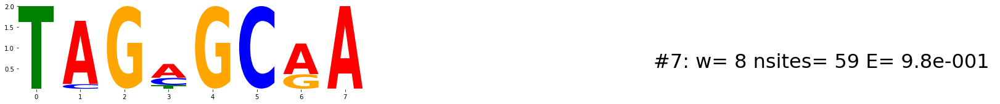

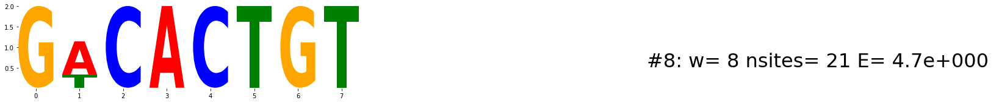

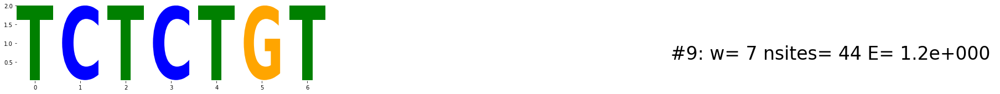

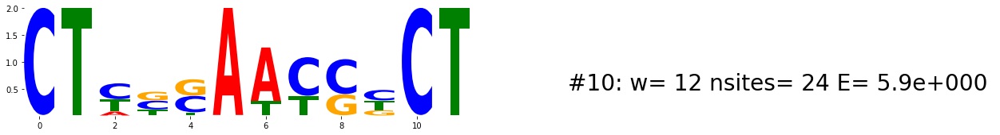

Thanks! Running co-occurance statistics on motifs 1 and 2
G.TGT.
GTTGGT
{24: 1, -33: 1, -32: 1, 30: 1, 32: 1, 21: 1, -27: 1, -31: 2, -29: 2, 29: 2, 31: 2, -22: 2, -21: 2, 22: 2, -13: 3, 25: 3, 19: 3, 23: 3, -26: 3, 26: 4, 20: 4, 18: 4, -20: 4, -28: 4, 6: 4, -11: 4, 14: 4, -14: 4, -16: 4, 7: 5, -25: 5, -5: 5, 16: 5, 10: 6, -15: 6, -24: 6, 12: 6, -18: 6, 11: 6, -23: 7, 15: 7, -9: 7, 17: 7, 8: 8, -17: 8, -12: 8, 27: 8, -19: 8, 9: 10, -10: 10, 13: 12, -7: 12, -8: 12, -6: 16, 4: 29, -3: 91, 3: 98}
27503
Spacing Distribution Counts  
24               1       
-33              1       
-32              1       
30               1       
32               1       
21               1       
-27              1       
-31              2       
-29              2       
29               2       
31               2       
-22              2       
-21              2       
22               2       
-13              3       
25               3       
19               3       
23               3      

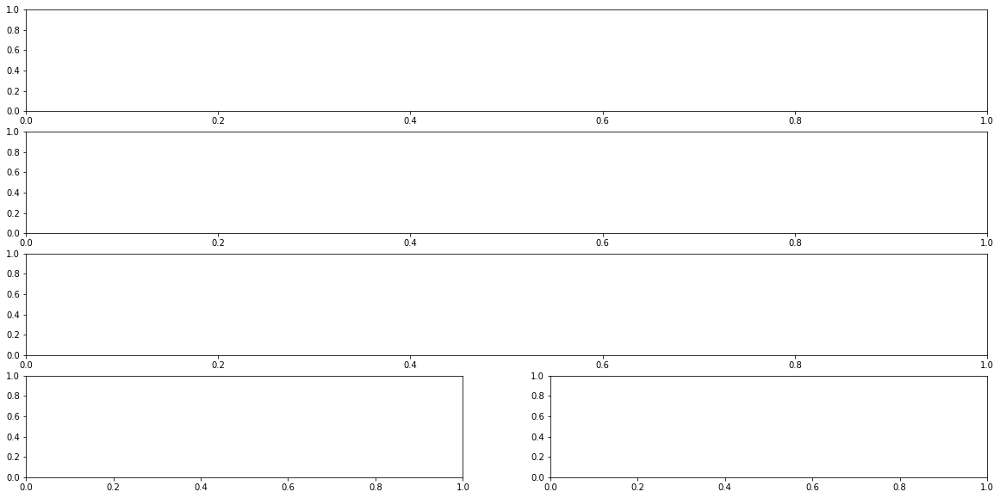

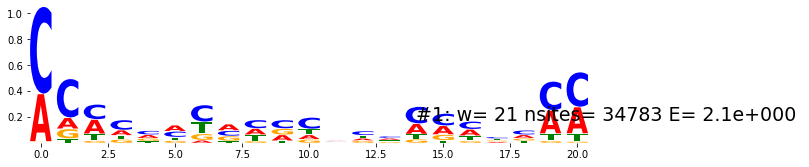

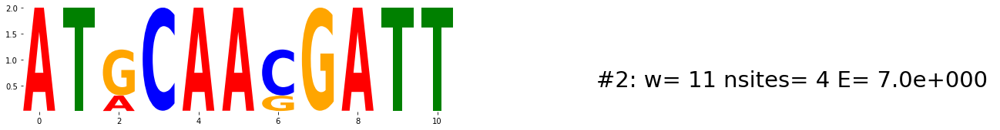

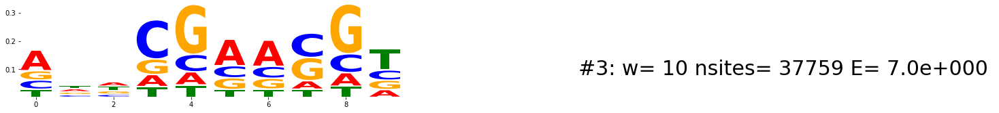

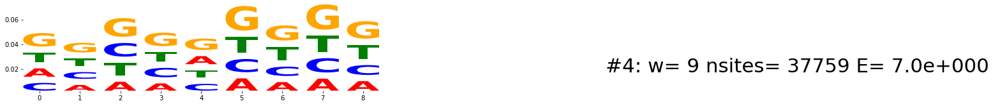

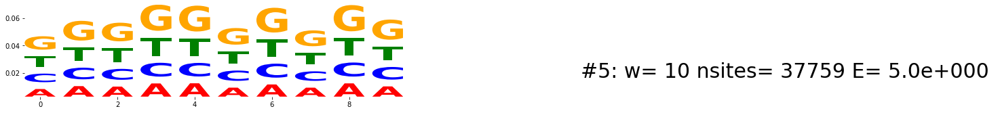

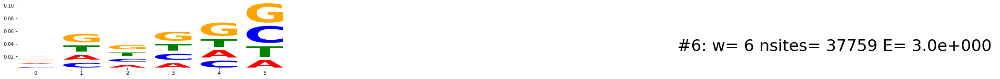

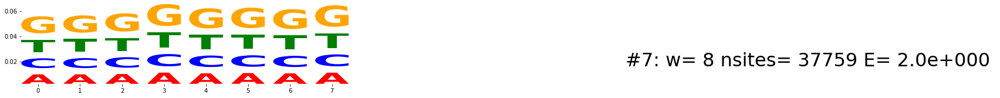

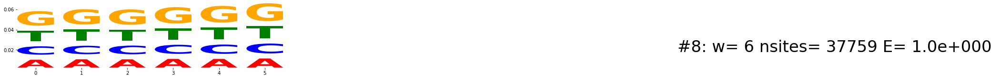

Thanks! Running co-occurance statistics on motifs 1 and 2
.....................
AT.CAA.GATT
{-16: 1, -24: 1, -4: 1, -2: 2}
37759
Spacing Distribution Counts  
-16              1       
-24              1       
-4               1       
-2               2       
--- 2.6605162620544434 seconds ---
----------  ZNF596_GA40NTGTATC_Lysate_BatchAATA_Cycle3_R1  ---------


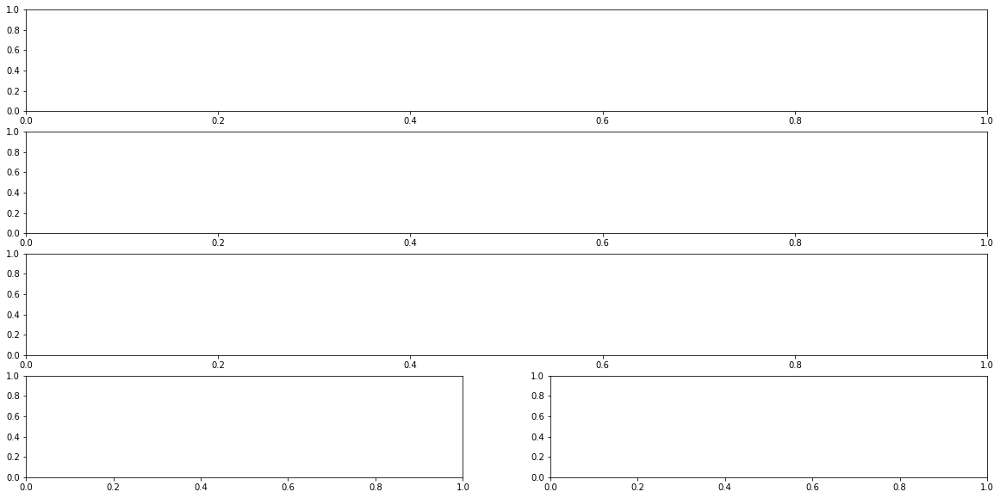

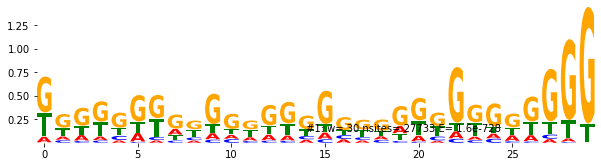

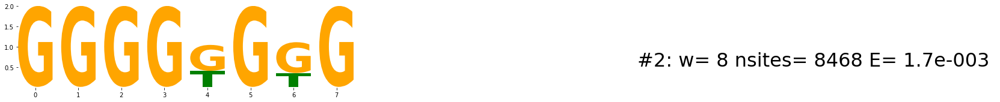

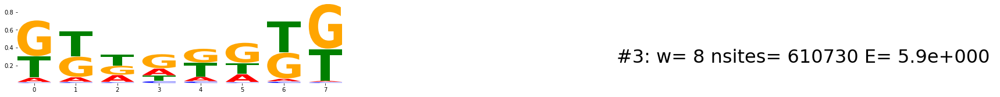

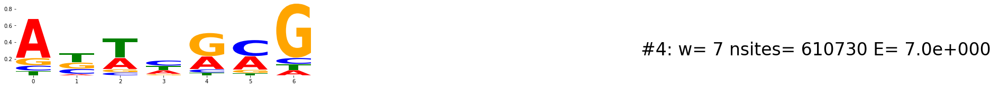

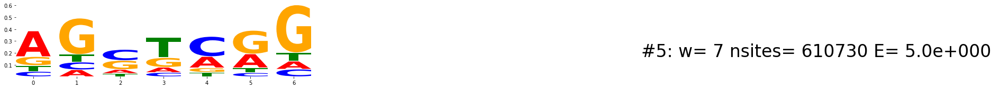

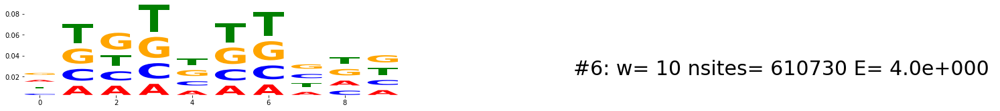

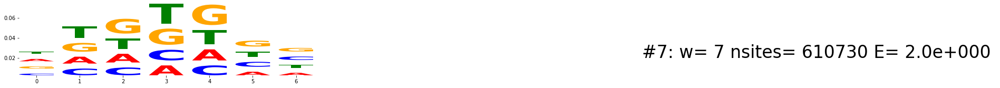

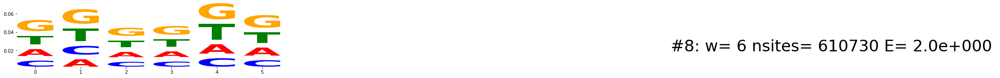

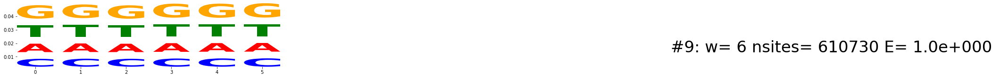

Thanks! Running co-occurance statistics on motifs 1 and 2
............................GG
GGGG.G.G
{10: 28, 9: 65, 8: 93, 7: 158, 6: 189, -32: 199, -20: 201, 5: 263, -31: 271, 4: 279, 3: 359, -25: 417, -24: 430, -22: 469, 2: 472, 1: 553, -18: 649, -19: 686, -2: 706, -1: 721, -17: 728, 0: 761, -16: 768, -15: 771, -4: 796, -5: 801, -3: 803, -7: 806, -6: 828, -14: 834, -8: 842, -13: 843, -9: 853, -12: 863, -10: 867, -11: 923, -26: 1191, -23: 1313, -27: 1325, -29: 1354, -21: 1491, -28: 4994}
610730
Spacing Distribution Counts  
10               28      
9                65      
8                93      
7                158     
6                189     
-32              199     
-20              201     
5                263     
-31              271     
4                279     
3                359     
-25              417     
-24              430     
-22              469     
2                472     
1                553     
-18              649     
-19              686     
-2 

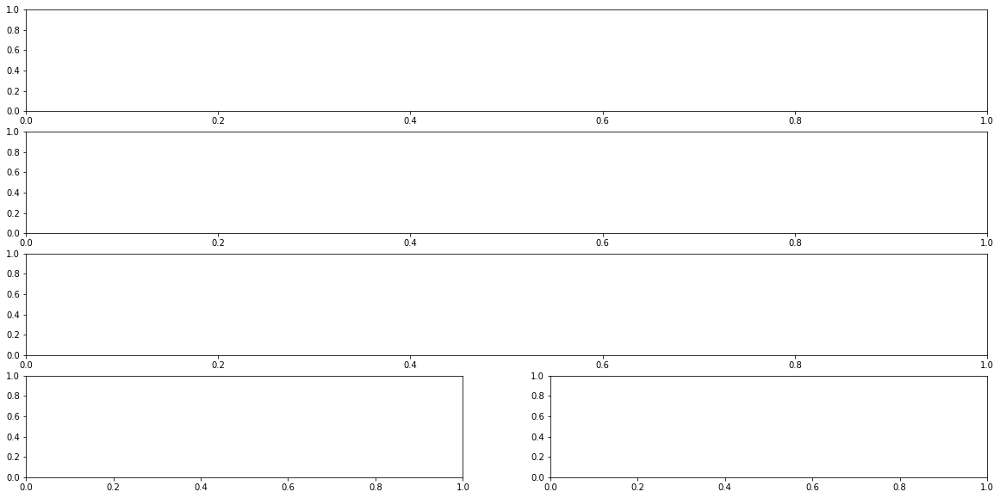

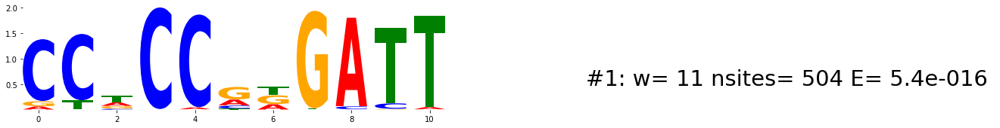

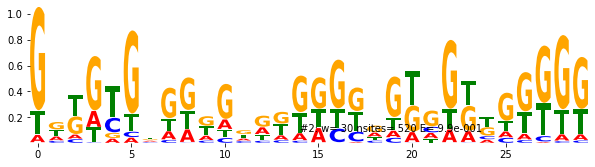

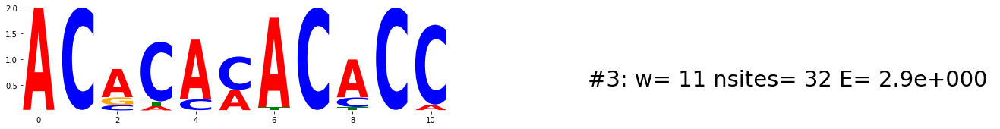

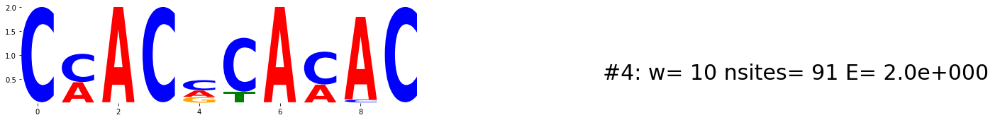

...

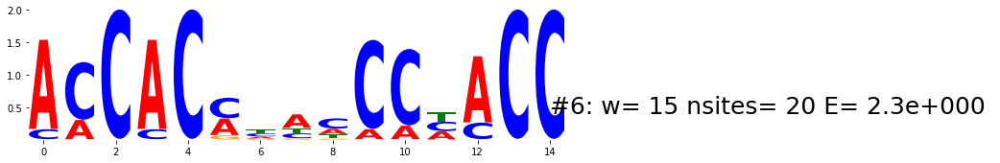

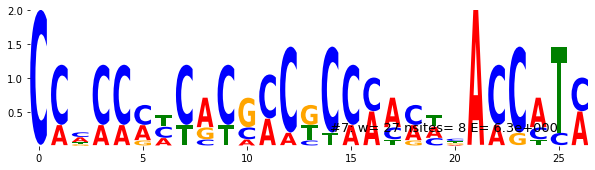

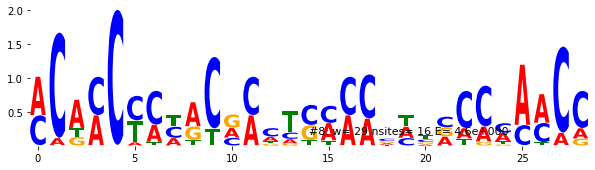

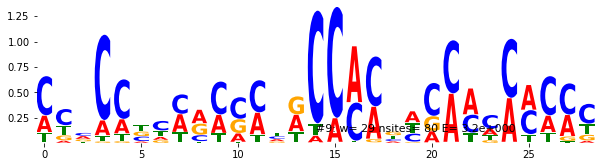

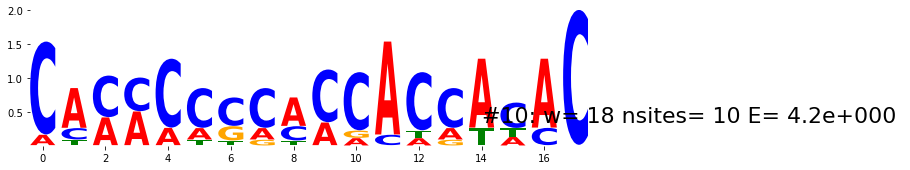

Thanks! Running co-occurance statistics on motifs 1 and 2
CC.CC..GATT
..............................
{15: 1, 5: 1, 14: 1, 21: 1, 27: 1, 7: 1, 8: 2, 11: 2, 25: 3, 19: 3, 18: 4, 17: 4, 10: 4, 22: 8}
26434
Spacing Distribution Counts  
15               1       
5                1       
14               1       
21               1       
27               1       
7                1       
8                2       
11               2       
25               3       
19               3       
18               4       
17               4       
10               4       
22               8       
--- 3.332899570465088 seconds ---
----------  ZNF16_CT40NGTTGGG_Lysate_BatchAATA_Cycle3_R1  ---------


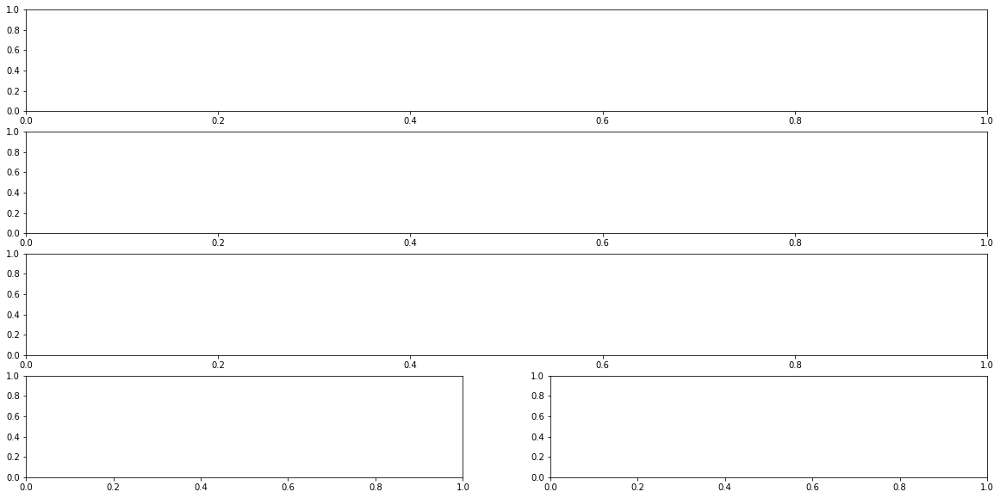

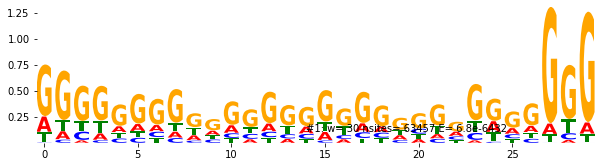

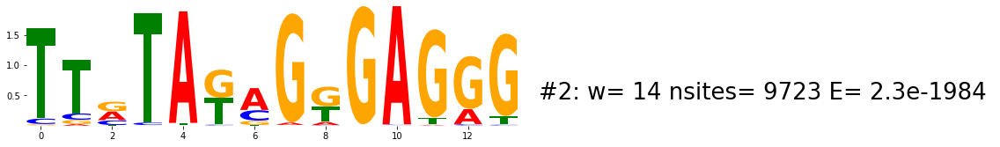

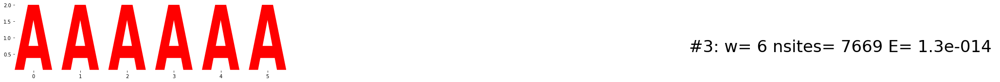

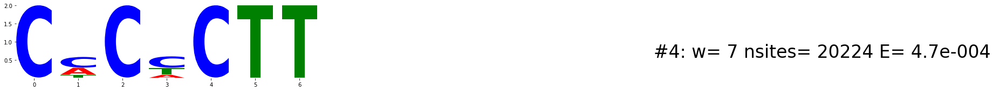

...

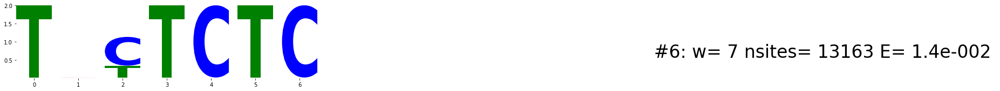

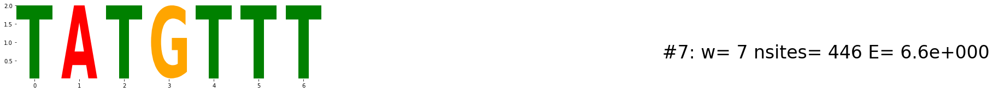

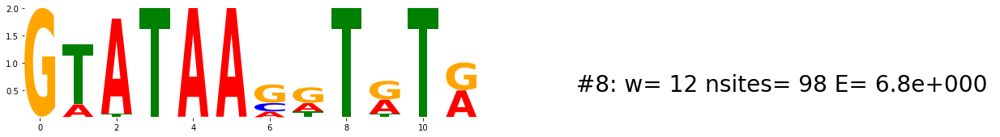

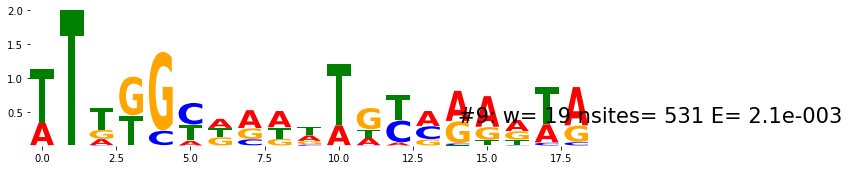

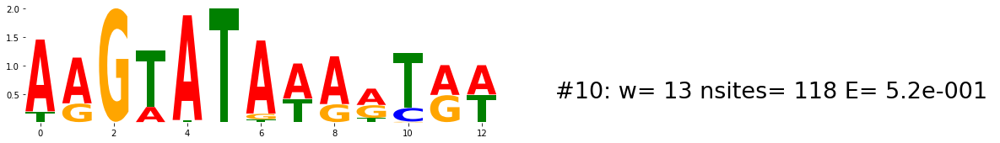

Thanks! Running co-occurance statistics on motifs 1 and 2
...........................G.G
TT.TA..G.GAG.G
{9: 1, 10: 1, 8: 5, 7: 13, -15: 23, -13: 24, 6: 27, -21: 27, 5: 36, 4: 43, 3: 46, -10: 55, 2: 70, 0: 84, 1: 90, -12: 91, -9: 94, -1: 99, -8: 99, -5: 116, -7: 130, -6: 141, -3: 157, -2: 159, -4: 172, -11: 231, -14: 296, -22: 383, -16: 545, -18: 569, -20: 855}
575171
Spacing Distribution Counts  
9                1       
10               1       
8                5       
7                13      
-15              23      
-13              24      
6                27      
-21              27      
5                36      
4                43      
3                46      
-10              55      
2                70      
0                84      
1                90      
-12              91      
-9               94      
-1               99      
-8               99      
-5               116     
-7               130     
-6               141     
-3               157     
-2

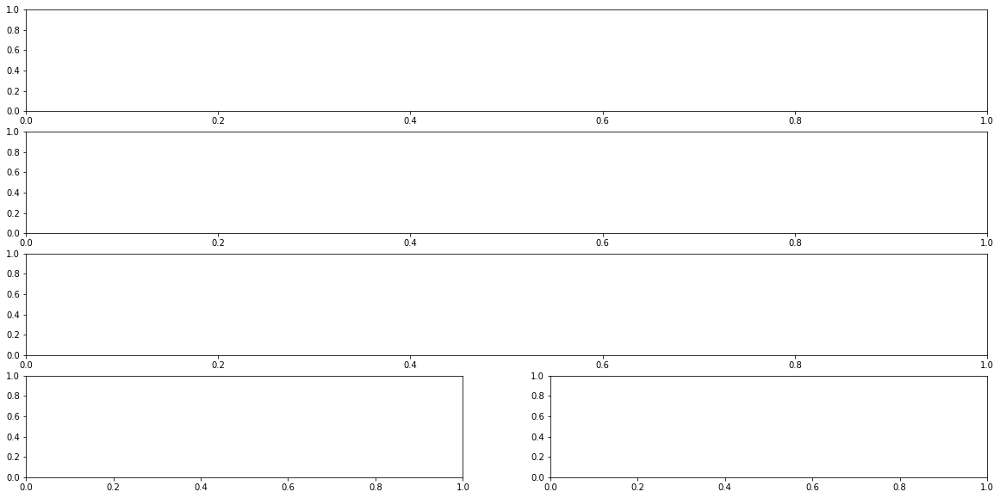

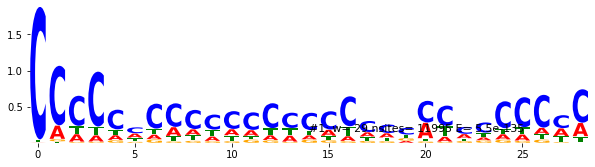

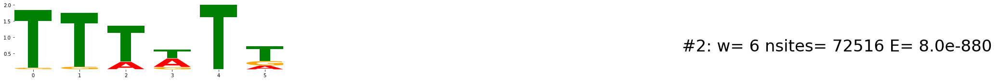

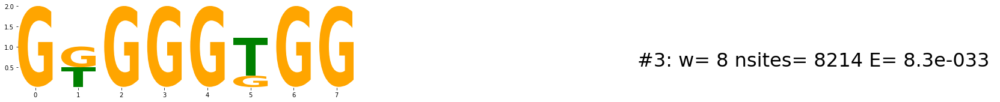

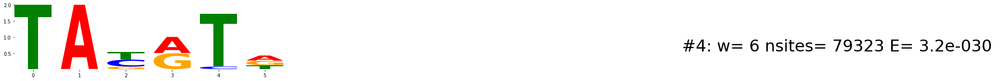

...

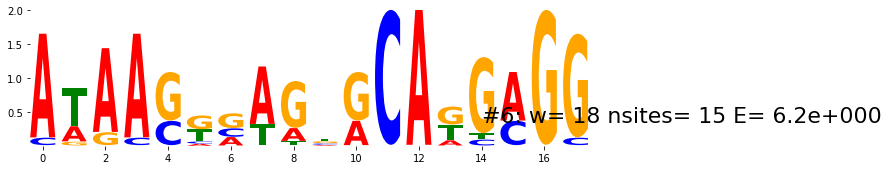

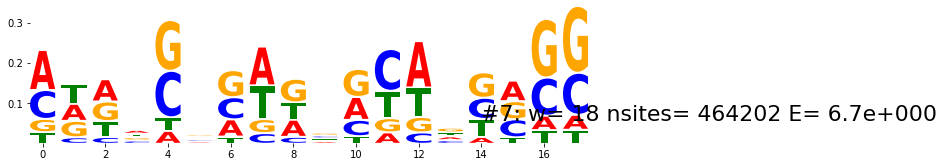

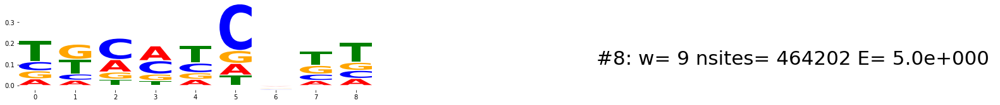

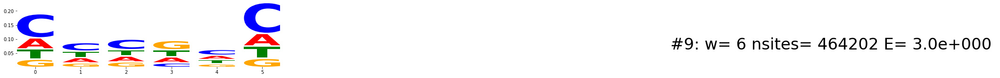

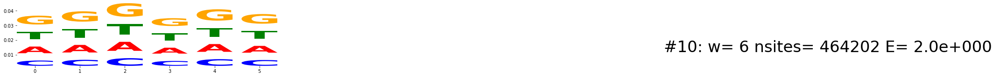

Thanks! Running co-occurance statistics on motifs 1 and 2
CC.C.........................
TTT.T.
{-34: 13, 11: 23, -33: 28, -32: 41, 10: 46, -31: 56, -30: 69, 8: 79, 9: 80, -29: 84, -28: 88, 6: 108, -27: 110, 7: 112, -26: 127, -24: 128, -25: 138, 5: 144, -18: 156, -22: 156, -16: 161, -15: 162, -20: 165, -23: 168, -21: 169, -17: 171, -14: 175, -12: 176, -11: 179, -19: 183, -13: 192, -10: 203, -9: 209, -8: 216, -5: 223, -7: 233, -6: 242, -4: 262}
464202
Spacing Distribution Counts  
-34              13      
11               23      
-33              28      
-32              41      
10               46      
-31              56      
-30              69      
8                79      
9                80      
-29              84      
-28              88      
6                108     
-27              110     
7                112     
-26              127     
-24              128     
-25              138     
5                144     
-18              156     
-22              156  

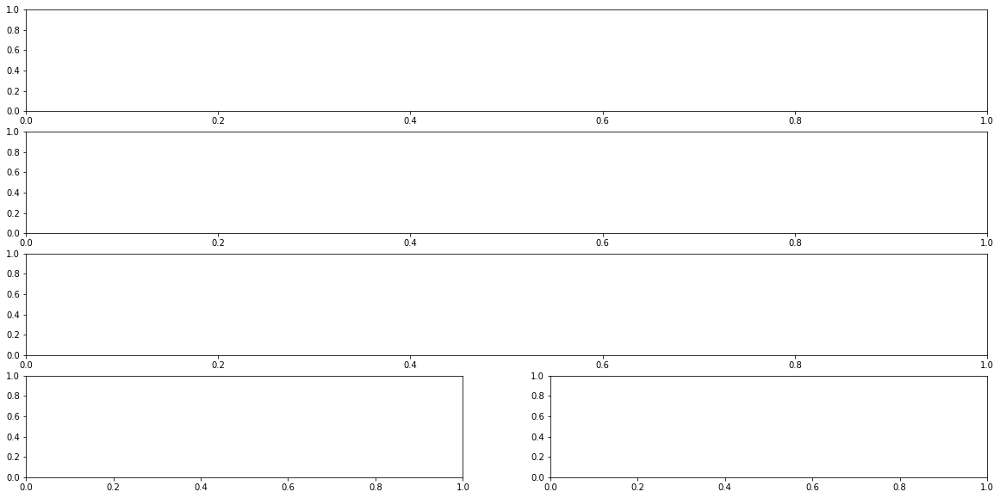

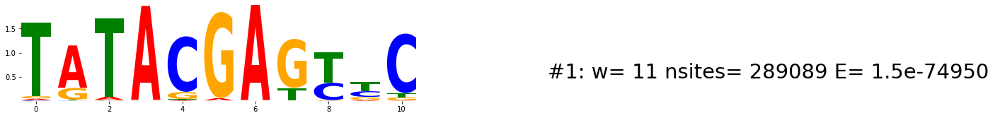

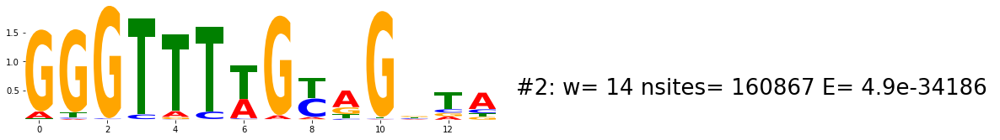

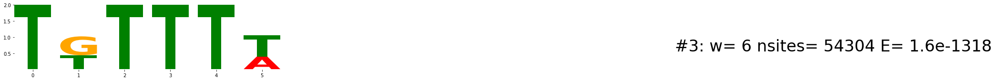

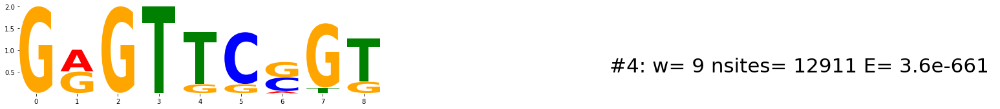

...

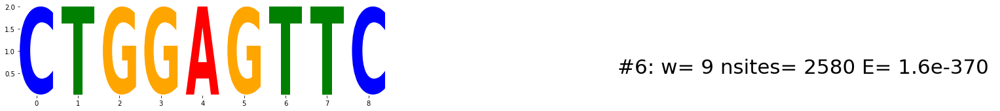

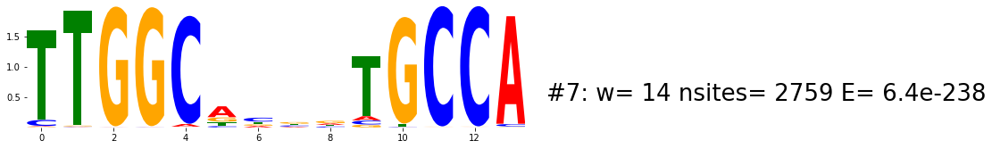

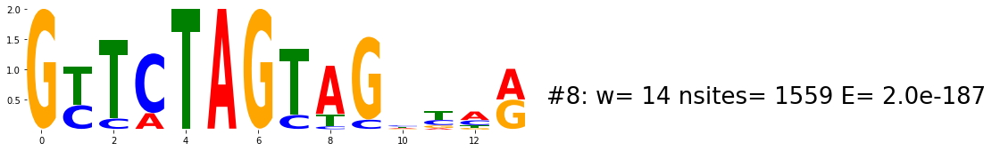

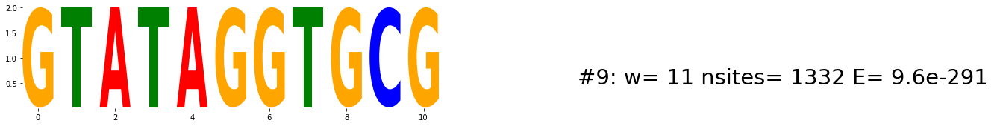

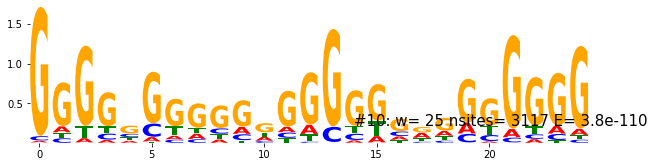

Thanks! Running co-occurance statistics on motifs 1 and 2
TATACGAG..C
GGGTTT.G..G...
{20: 1, -18: 3, 23: 3, 16: 4, -22: 6, 21: 7, -16: 8, -14: 10, -15: 10, -13: 10, -17: 12, -20: 16, -19: 17, 22: 82, -12: 161, 14: 1008, 15: 5790}
552270
Spacing Distribution Counts  
20               1       
-18              3       
23               3       
16               4       
-22              6       
21               7       
-16              8       
-14              10      
-15              10      
-13              10      
-17              12      
-20              16      
-19              17      
22               82      
-12              161     
14               1008    
15               5790    
--- 6.603828191757202 seconds ---
----------  ZNF264_TA40NTCACTC_IVT_BatchAATBA_Cycle3_R1  ---------


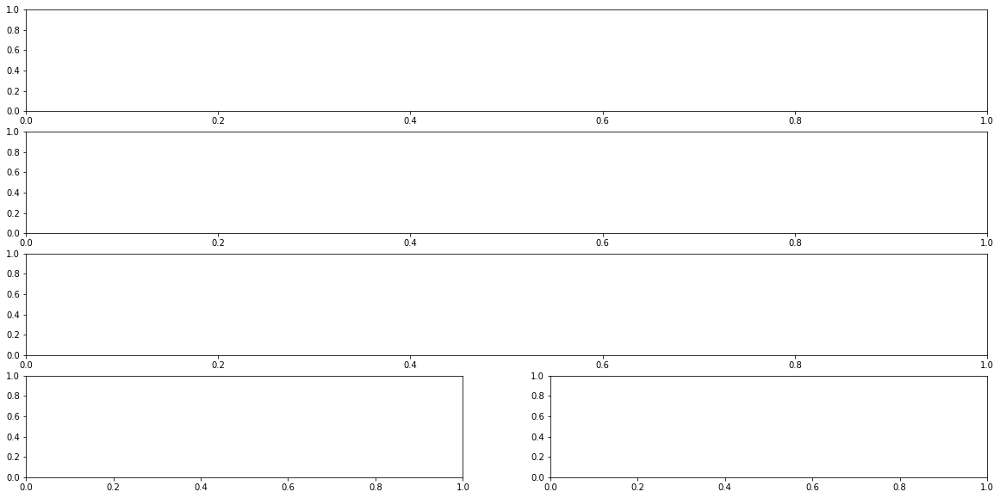

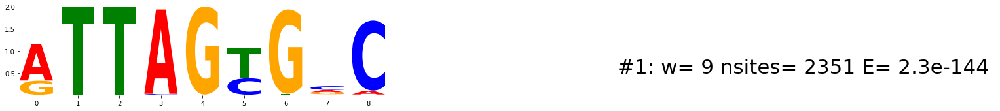

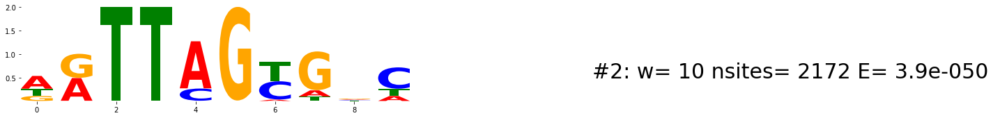

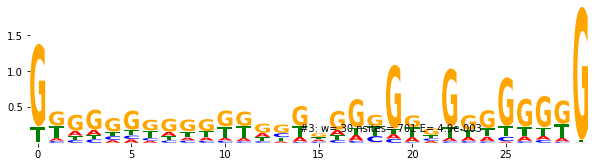

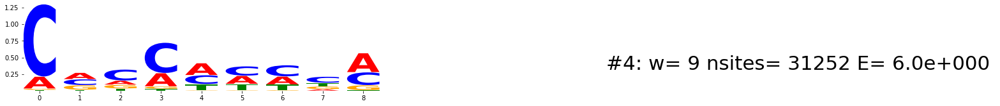

...

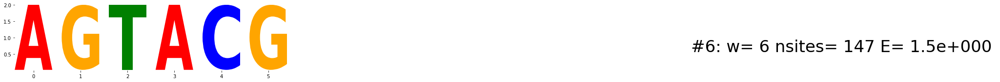

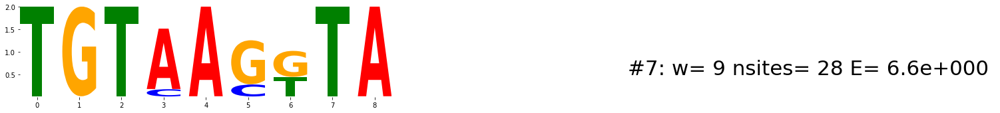

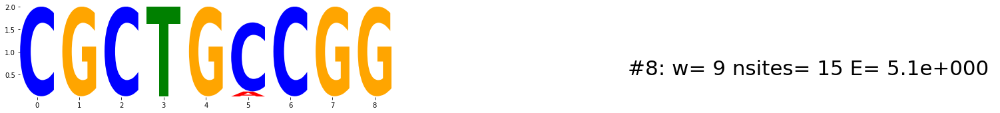

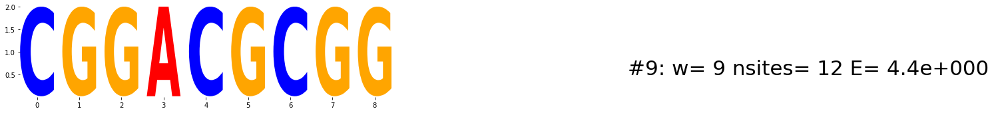

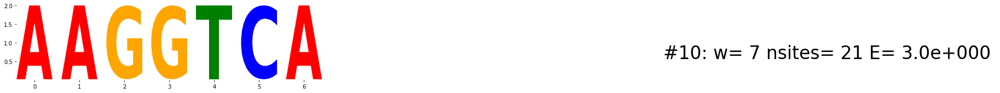

Thanks! Running co-occurance statistics on motifs 1 and 2
.TTAG.G.C
..TT.G....
{-7: 1, -30: 1, -29: 1, -19: 1, -8: 1, -10: 1, 29: 1, -17: 1, 30: 2, -27: 2, -26: 2, -15: 2, -9: 3, -28: 3, -20: 4, -11: 5, -23: 5, 27: 5, 6: 6, -18: 6, 23: 7, 9: 7, -16: 7, 11: 8, 8: 9, -13: 9, 28: 9, 25: 9, -12: 10, 20: 11, 14: 12, 21: 13, 7: 13, 16: 13, -22: 14, 26: 15, 17: 15, 19: 16, 22: 16, 10: 17, 12: 20, 13: 23, 24: 25, 18: 31, 15: 35, 5: 63, 1: 1258}
31252
Spacing Distribution Counts  
-7               1       
-30              1       
-29              1       
-19              1       
-8               1       
-10              1       
29               1       
-17              1       
30               2       
-27              2       
-26              2       
-15              2       
-9               3       
-28              3       
-20              4       
-11              5       
-23              5       
27               5       
6                6       
-18              6       
23 

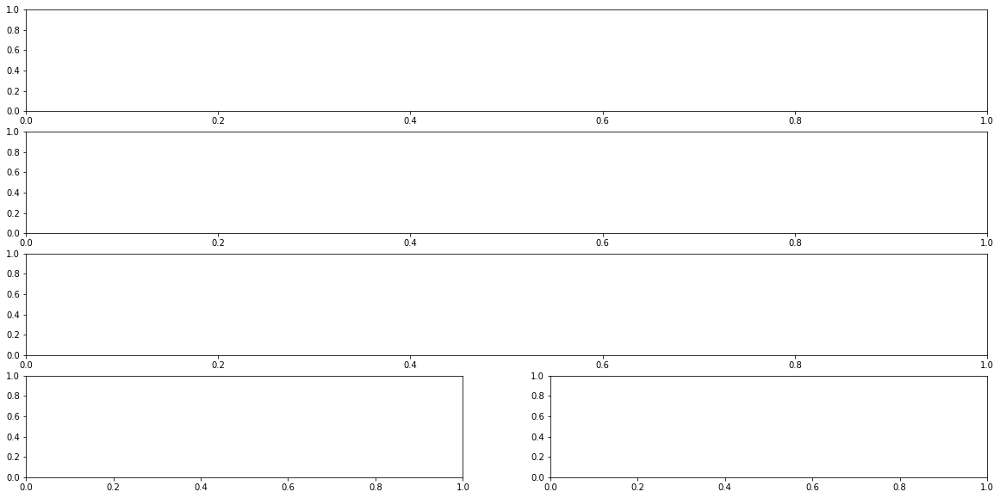

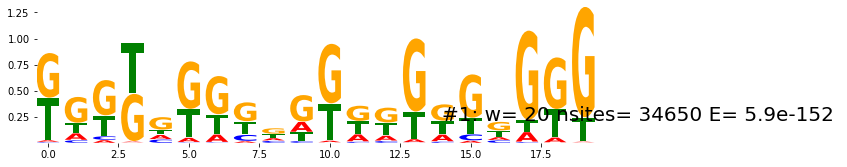

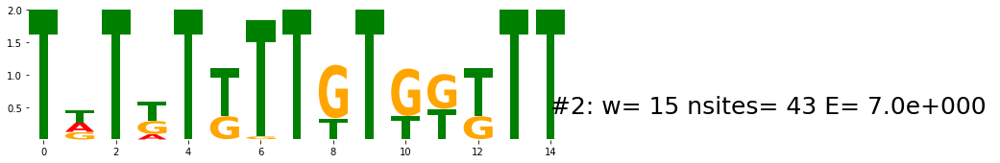

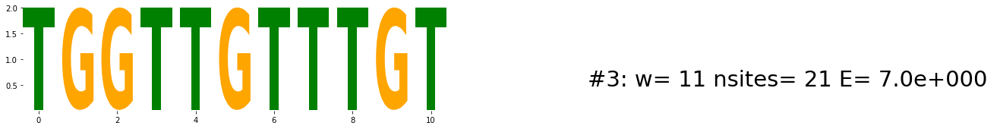

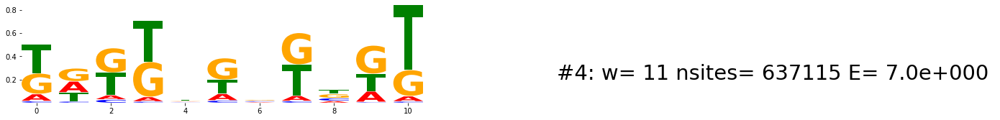

...

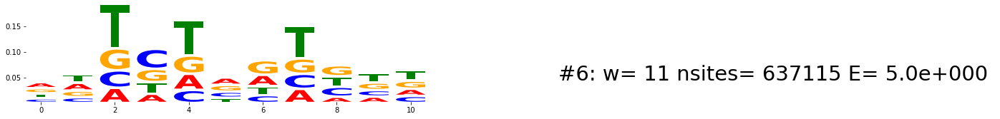

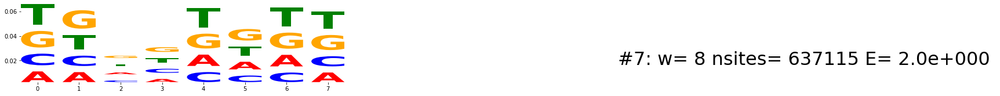

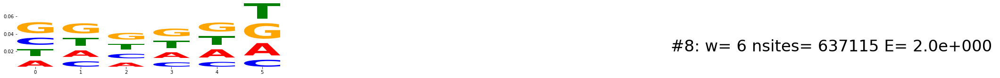

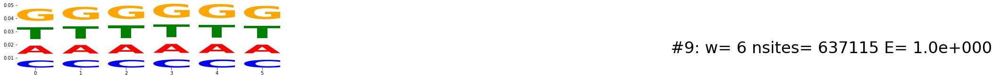

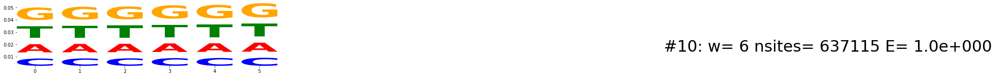

Thanks! Running co-occurance statistics on motifs 1 and 2
.................G.G
T.T.T.TT.T...TT
{18: 2, 19: 5, 16: 5, -25: 7, 17: 7, -24: 7, -21: 9, 15: 9, -23: 11, -22: 12, 11: 16, 14: 17, 10: 17, 13: 21, -16: 21, -20: 21, 12: 21, -18: 22, 8: 22, 7: 27, 9: 30, 6: 36, 5: 38, -14: 41, 4: 48, 3: 49, 2: 50, -7: 54, -9: 56, 0: 59, 1: 61, -2: 83, -1: 85}
637115
Spacing Distribution Counts  
18               2       
19               5       
16               5       
-25              7       
17               7       
-24              7       
-21              9       
15               9       
-23              11      
-22              12      
11               16      
14               17      
10               17      
13               21      
-16              21      
-20              21      
12               21      
-18              22      
8                22      
7                27      
9                30      
6                36      
5                38      
-14           

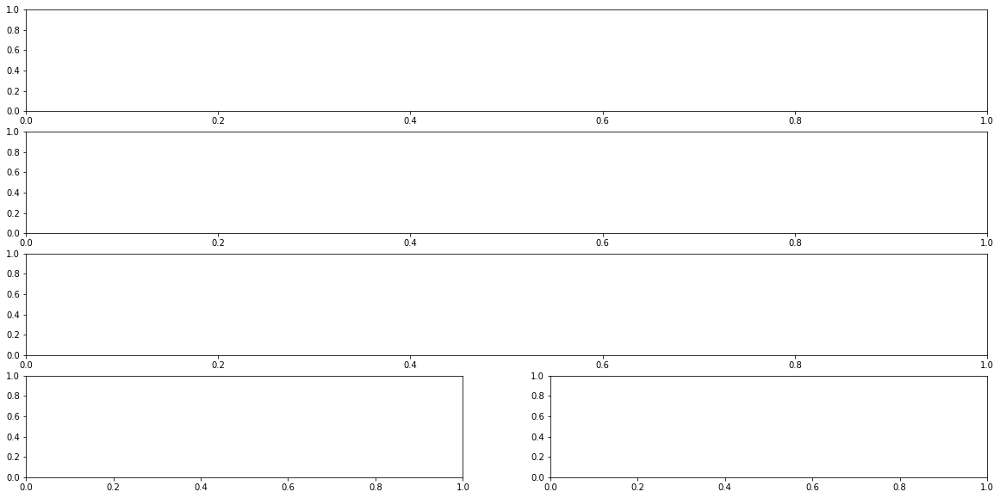

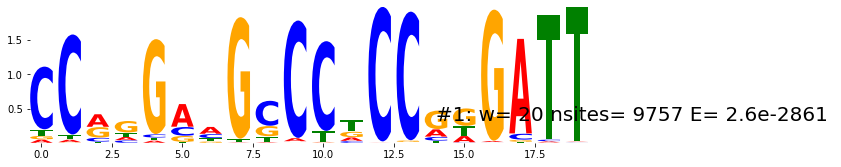

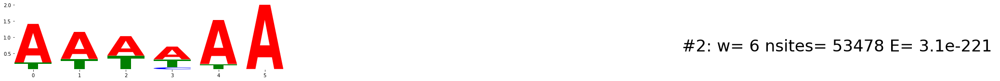

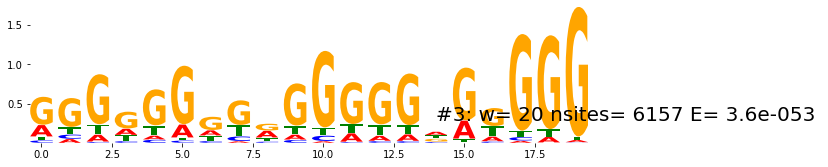

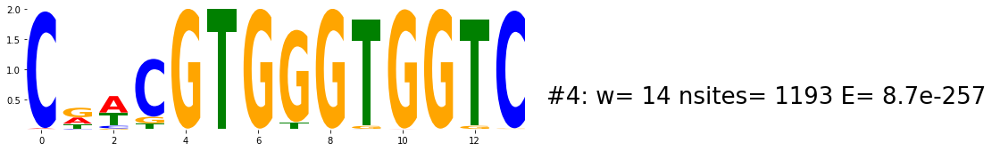

...

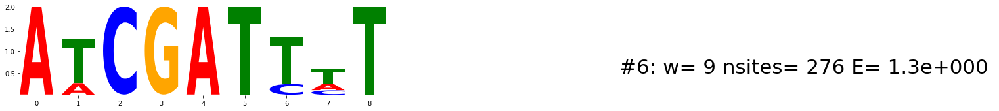

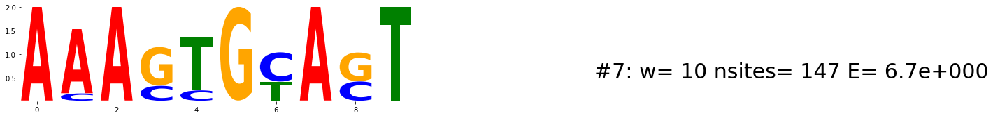

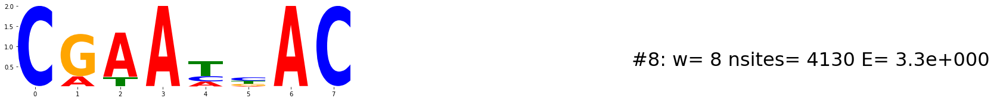

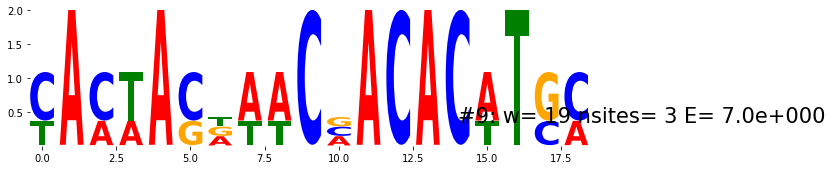

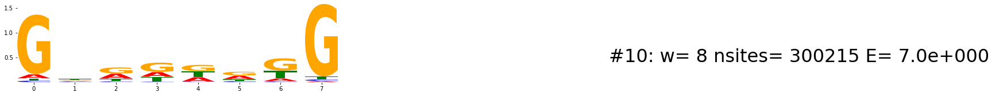

Thanks! Running co-occurance statistics on motifs 1 and 2
CC..G..G.CC.CC..GATT
A...AA
{19: 1, 12: 1, -23: 1, 13: 3, 9: 6, -20: 7, 17: 8, -27: 10, -17: 17, 14: 18, 16: 22, -25: 42, 6: 48, -26: 58}
300215
Spacing Distribution Counts  
19               1       
12               1       
-23              1       
13               3       
9                6       
-20              7       
17               8       
-27              10      
-17              17      
14               18      
16               22      
-25              42      
6                48      
-26              58      
--- 4.9219958782196045 seconds ---
----------  ZNF260_GG40NGGTTTA_IVT_BatchAATBA_Cycle3_R1  ---------


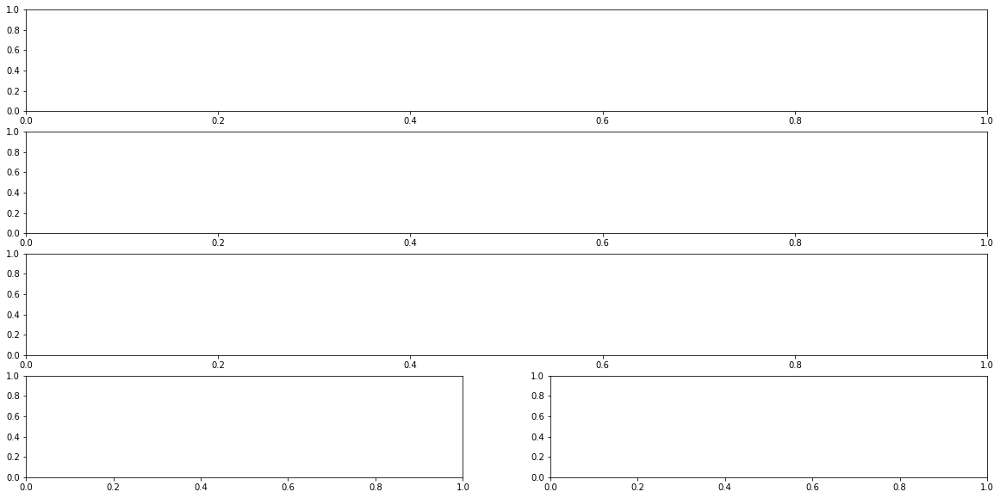

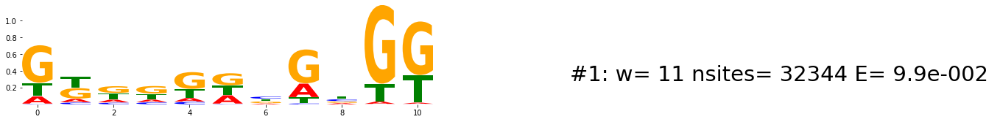

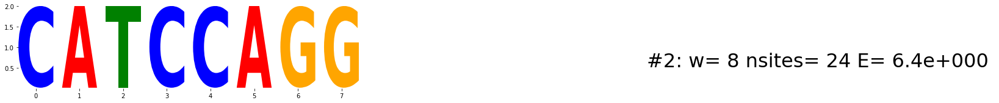

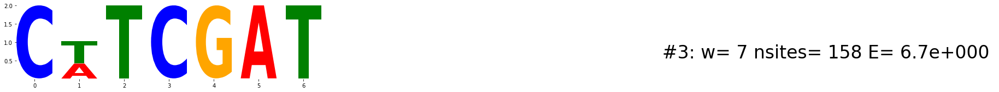

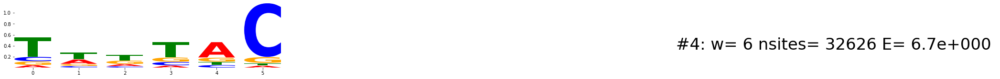

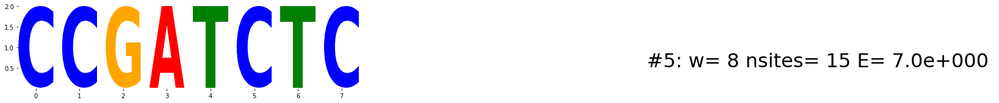

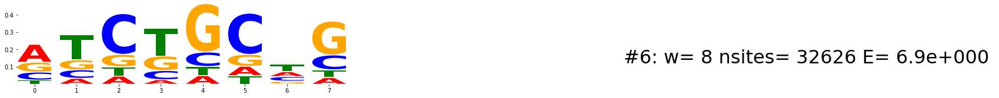

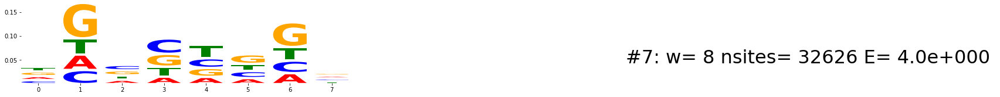

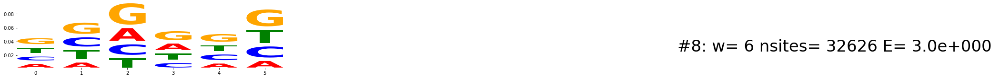

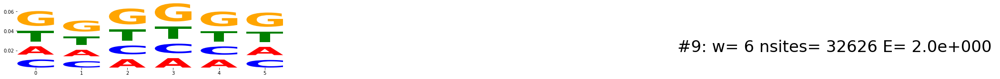

Thanks! Running co-occurance statistics on motifs 1 and 2
.........G.
CATCCAGG
{-26: 1, -13: 1, -17: 1, -18: 1, -15: 1, -28: 1, -3: 8}
32626
Spacing Distribution Counts  
-26              1       
-13              1       
-17              1       
-18              1       
-15              1       
-28              1       
-3               8       
--- 2.718714952468872 seconds ---
----------  ZFP28_CA40NTCGATG_IVT_BatchAATBA_Cycle3_R1  ---------


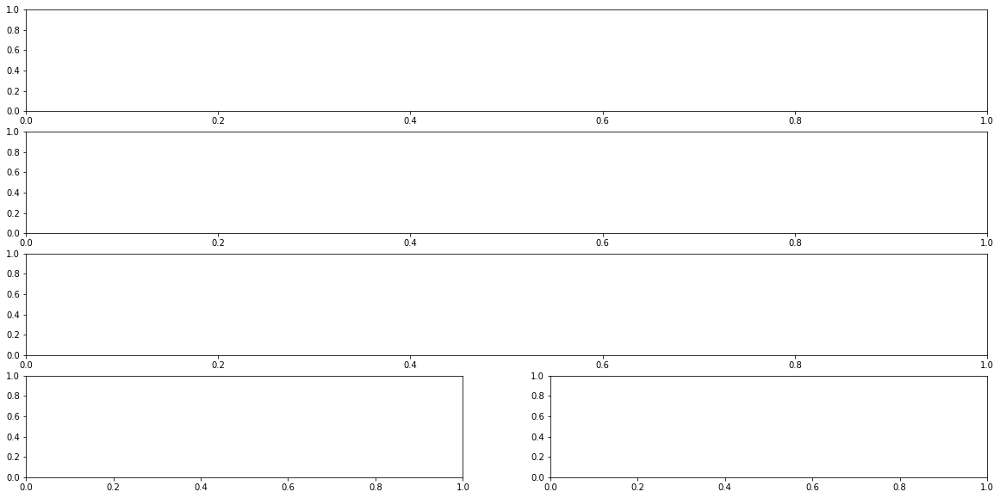

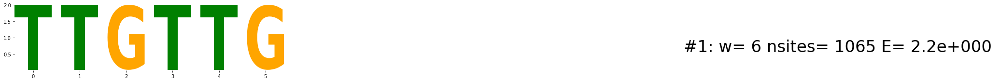

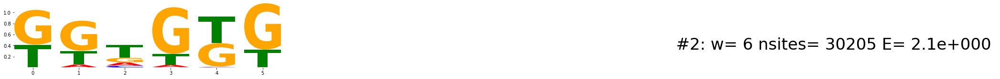

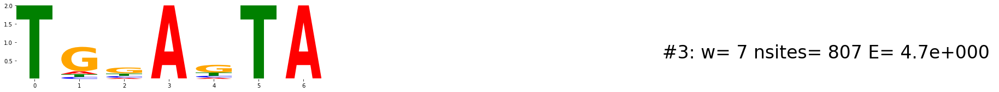

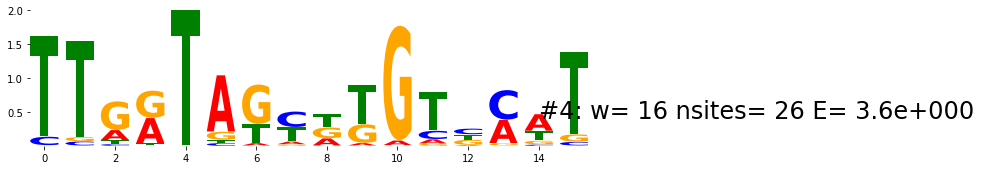

...

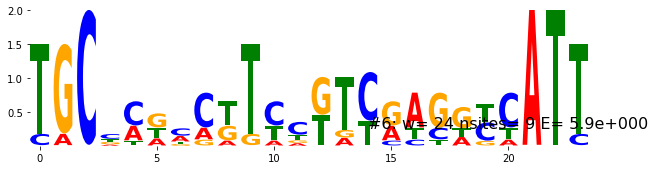

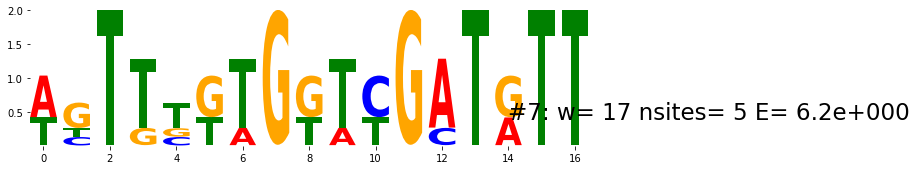

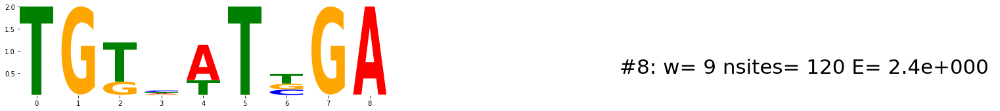

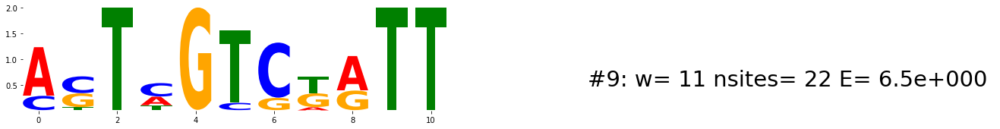

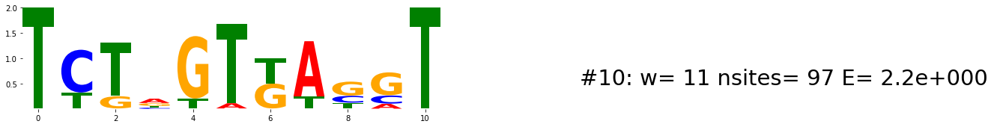

Thanks! Running co-occurance statistics on motifs 1 and 2
TTGTTG
......
{31: 12, 25: 16, 28: 18, 30: 20, 22: 20, 19: 21, 14: 22, 2: 23, 32: 24, 29: 25, 34: 26, 33: 26, 5: 27, 13: 27, 27: 28, 16: 28, 12: 31, 11: 31, 24: 31, 18: 31, 15: 31, 23: 31, 6: 32, 9: 33, 26: 35, 17: 35, 1: 35, 7: 35, 20: 36, 0: 37, 21: 38, 3: 39, 4: 39, 10: 43, 8: 43}
30218
Spacing Distribution Counts  
31               12      
25               16      
28               18      
30               20      
22               20      
19               21      
14               22      
2                23      
32               24      
29               25      
34               26      
33               26      
5                27      
13               27      
27               28      
16               28      
12               31      
11               31      
24               31      
18               31      
15               31      
23               31      
6                32      
9                33    

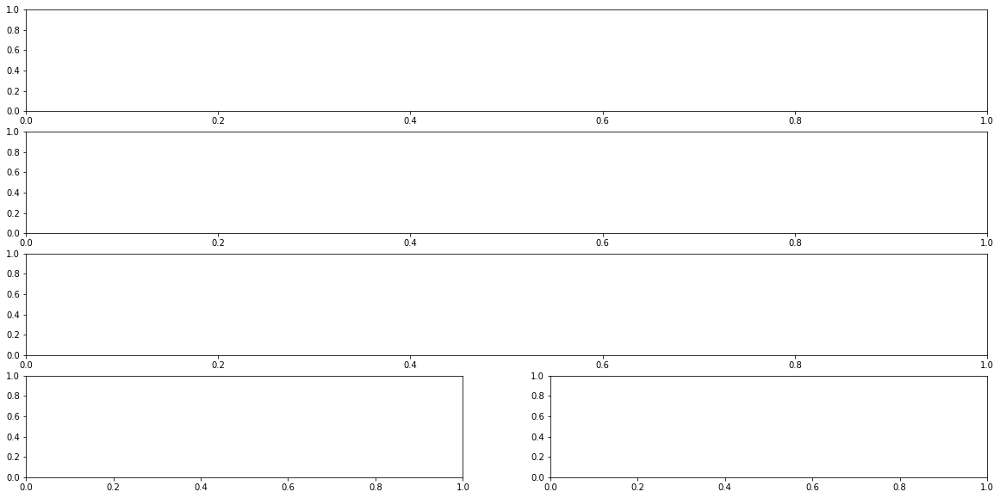

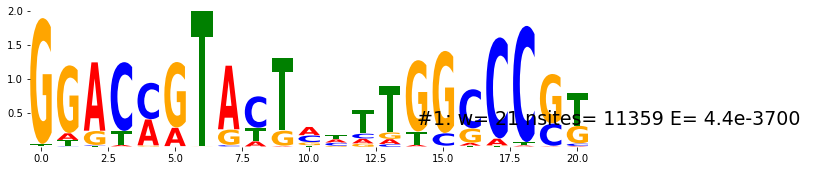

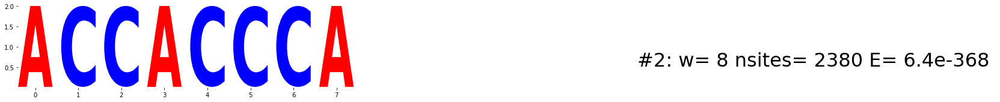

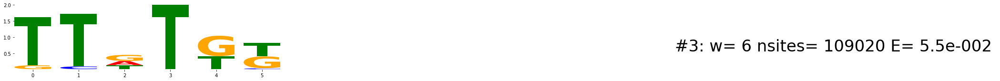

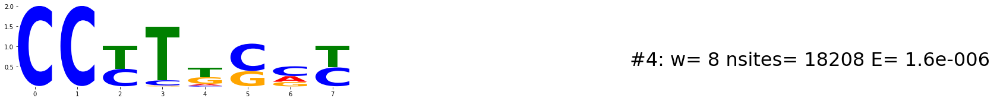

...

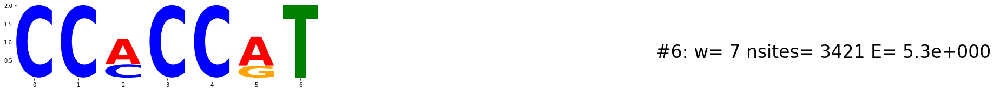

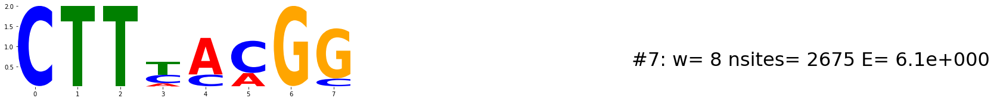

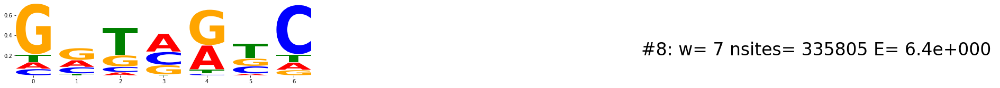

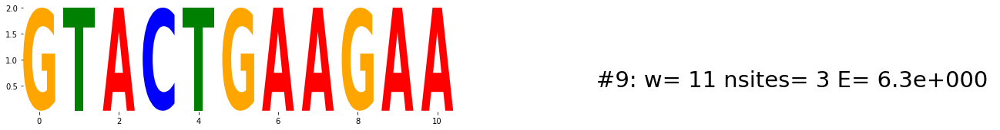

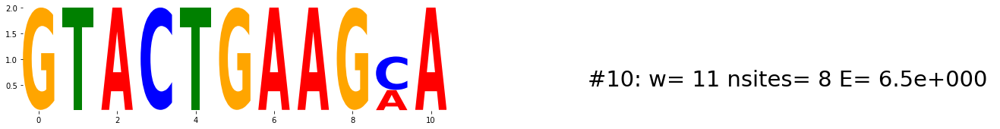

Thanks! Running co-occurance statistics on motifs 1 and 2
GGAC.GTA.T...TGG.CC..
ACCACCCA
{}
335805
Spacing Distribution Counts  
--- 4.877806186676025 seconds ---
----------  SNAI1_AG40NTCGACT_IVT_BatchAATBA_Cycle3_R1  ---------


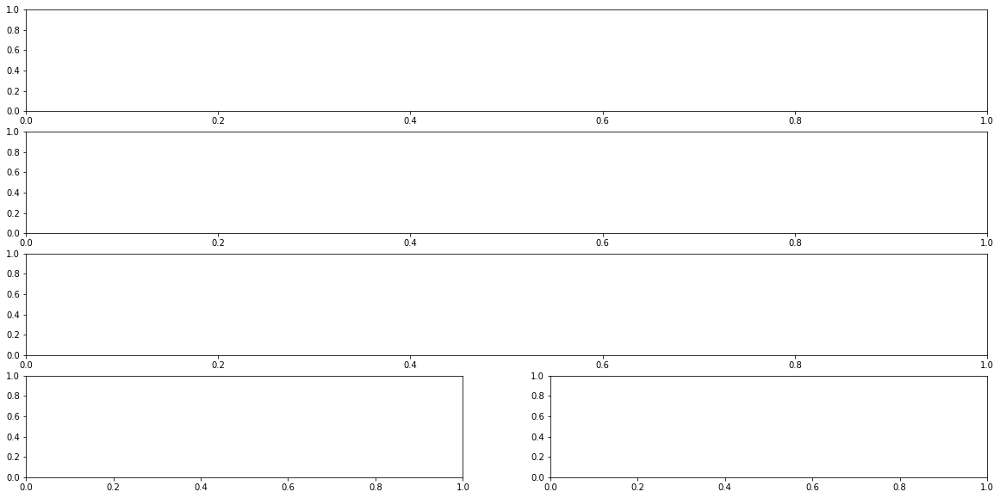

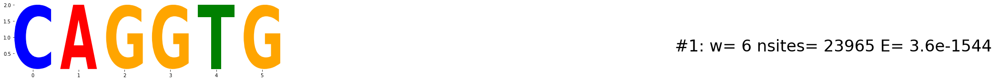

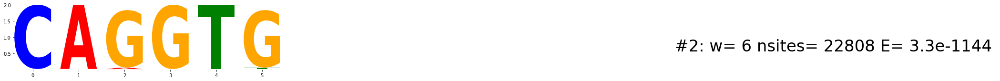

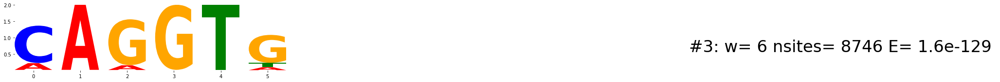

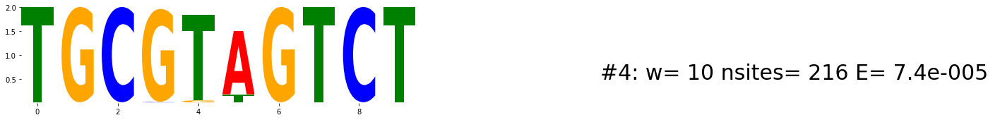

...

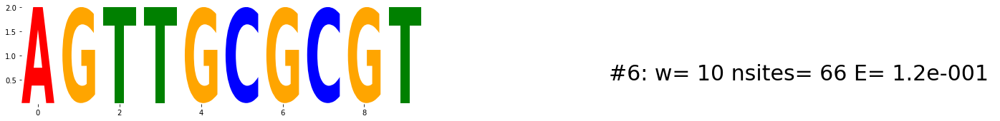

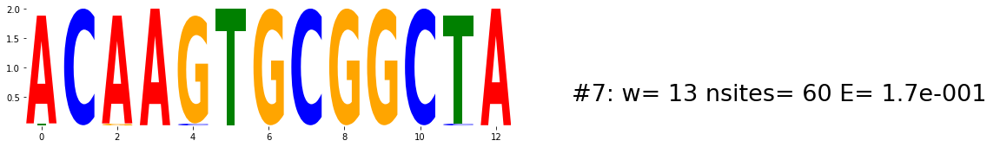

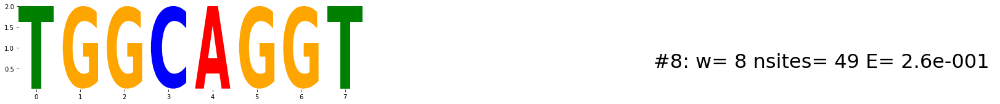

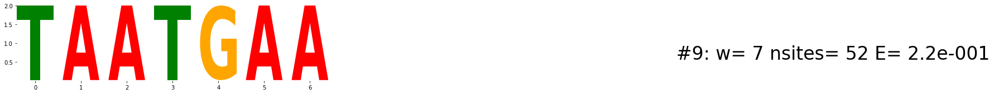

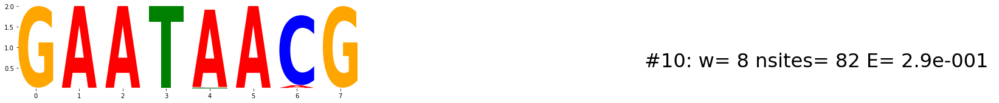

Thanks! Running co-occurance statistics on motifs 1 and 2
CAGGTG
CAGGTG
{0: 21721}
26400
Spacing Distribution Counts  
0                21721   
--- 2.6512131690979004 seconds ---
----------  ZNF35_TC40NAATCTC_Lysate_BatchAATA_Cycle3_R1  ---------


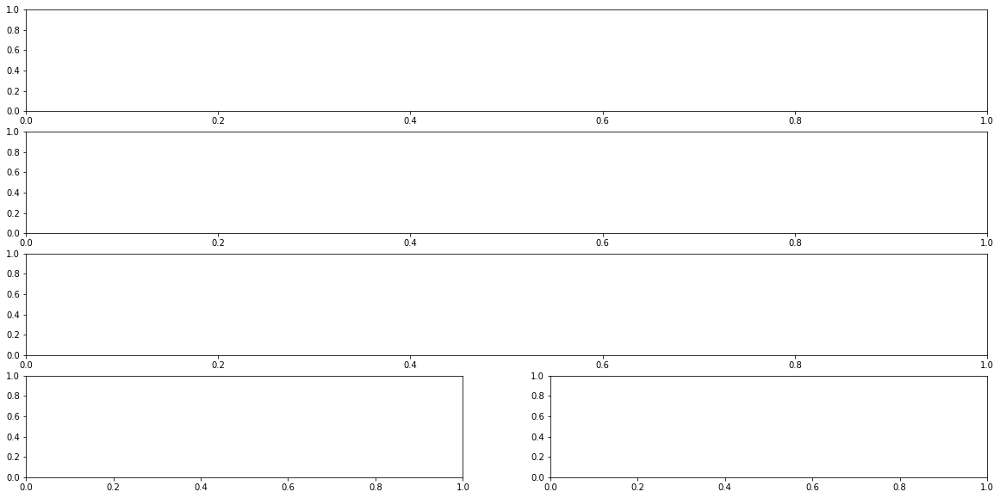

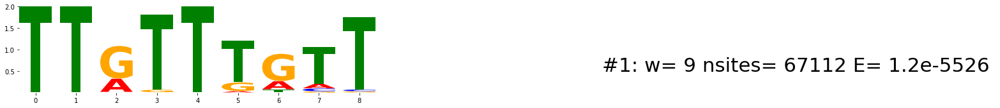

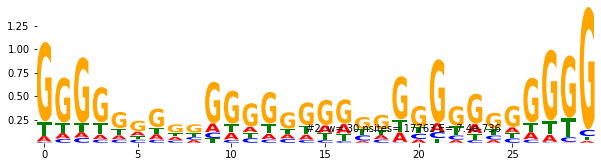

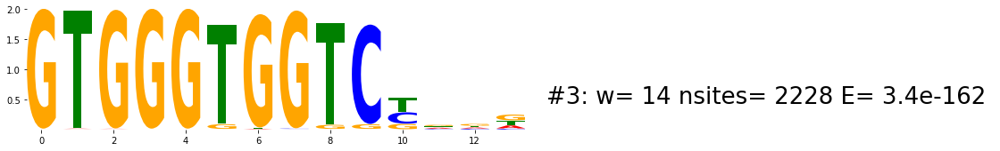

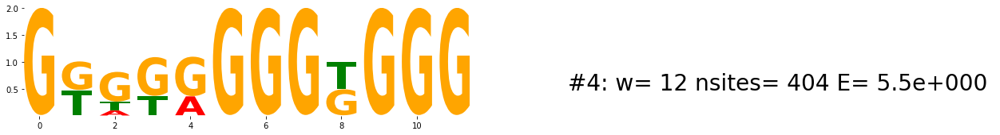

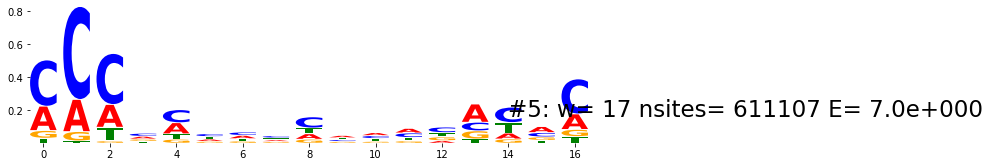

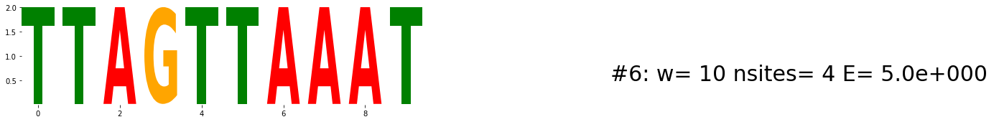

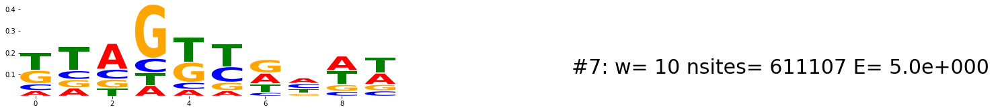

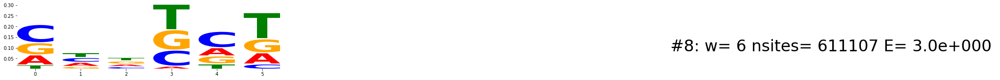

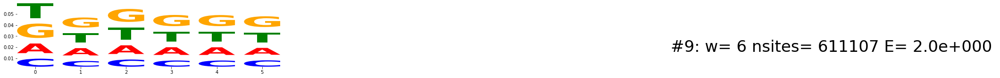

Thanks! Running co-occurance statistics on motifs 1 and 2
TT.TTT.TT
.............................G
{31: 44, -10: 59, -9: 99, -8: 162, -7: 294, 30: 305, -6: 388, -5: 517, 18: 628, 11: 678, 12: 748, -4: 839, 19: 847, 14: 890, 15: 901, 20: 904, 16: 914, 17: 929, 9: 935, 8: 938, 10: 979, -3: 1151, 7: 1221, 5: 1256, 13: 1284, 6: 1303, 1: 1341, 27: 1543, 4: 1561, -2: 1615, 2: 1654, 23: 2141, 3: 2189, -1: 2383, 0: 3479}
611107
Spacing Distribution Counts  
31               44      
-10              59      
-9               99      
-8               162     
-7               294     
30               305     
-6               388     
-5               517     
18               628     
11               678     
12               748     
-4               839     
19               847     
14               890     
15               901     
20               904     
16               914     
17               929     
9                935     
8                938     
10               979     


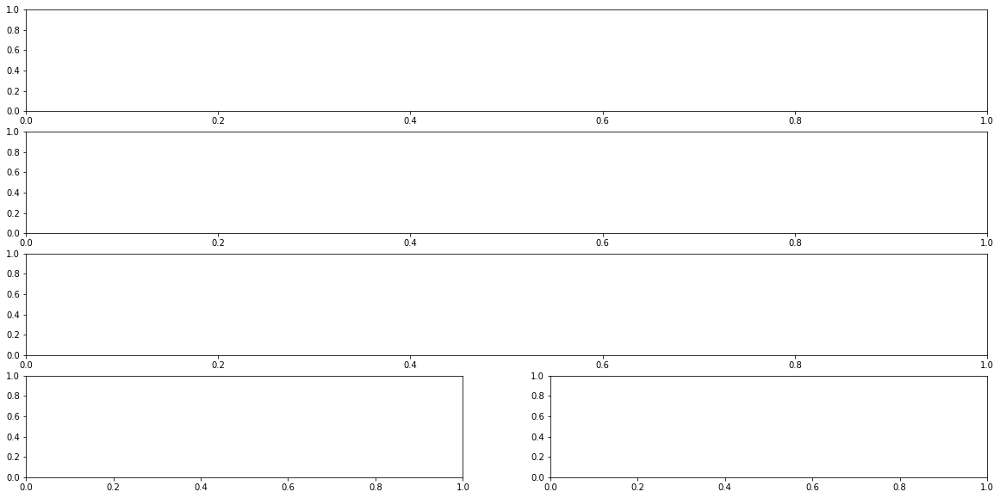

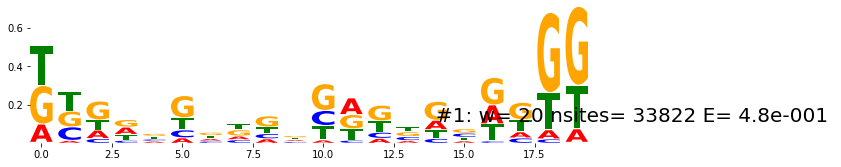

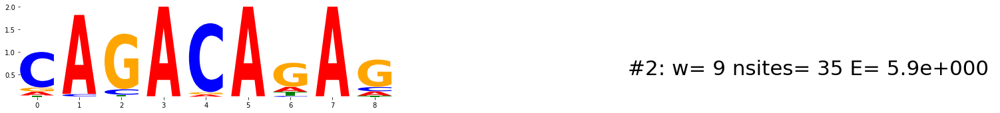

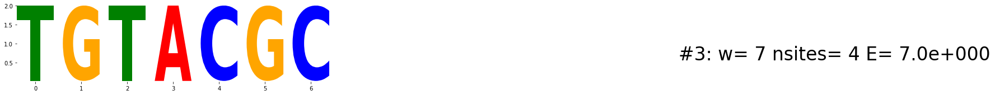

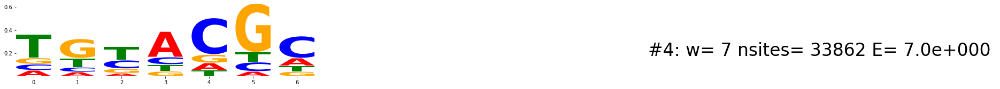

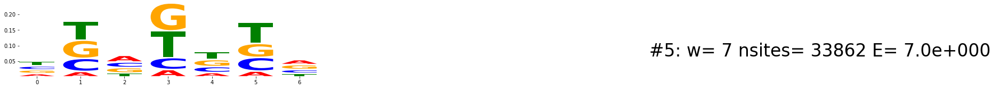

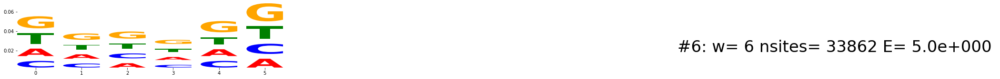

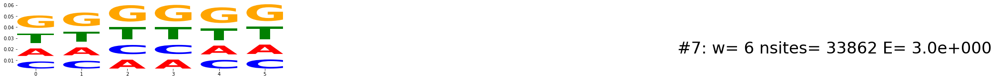

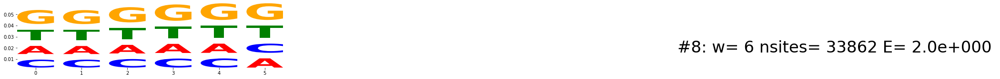

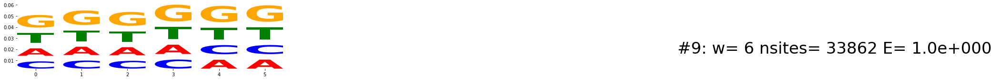

Thanks! Running co-occurance statistics on motifs 1 and 2
....................
.AGACA.A.
{-12: 1, -22: 1, -28: 1, -26: 1, -10: 1, -13: 2, -25: 2, -14: 2, -1: 2, -21: 2, -23: 2, -24: 2, -7: 2, -20: 2, -27: 3, -16: 3, -29: 3, -9: 3, -31: 3, -11: 3, -30: 3, -4: 3, -2: 3, -6: 4, -18: 4, -15: 4, -3: 4, -19: 5, -8: 6, 0: 6, -5: 11}
33862
Spacing Distribution Counts  
-12              1       
-22              1       
-28              1       
-26              1       
-10              1       
-13              2       
-25              2       
-14              2       
-1               2       
-21              2       
-23              2       
-24              2       
-7               2       
-20              2       
-27              3       
-16              3       
-29              3       
-9               3       
-31              3       
-11              3       
-30              3       
-4               3       
-2               3       
-6               4       
-18         

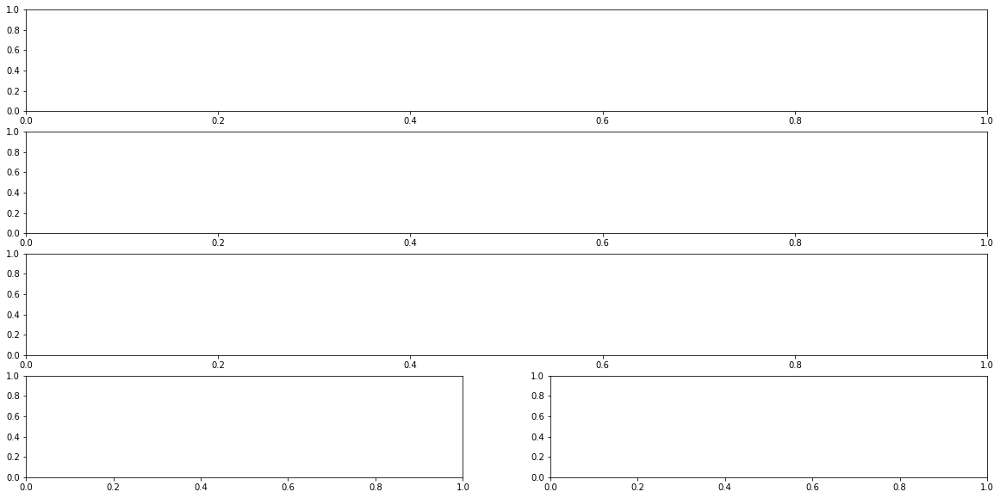

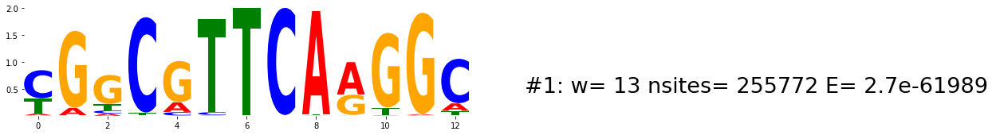

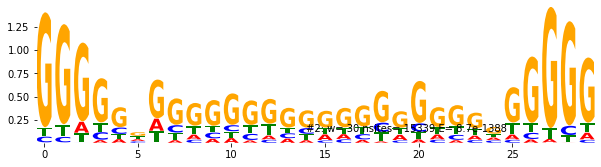

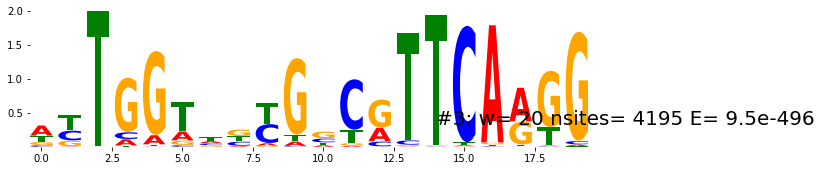

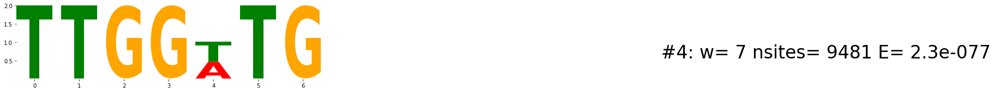

...

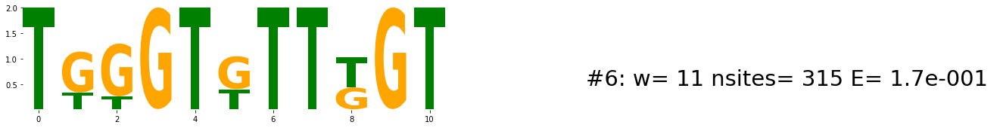

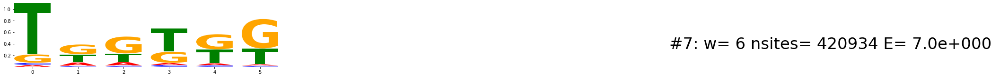

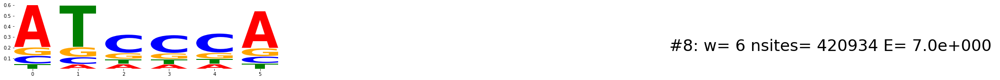

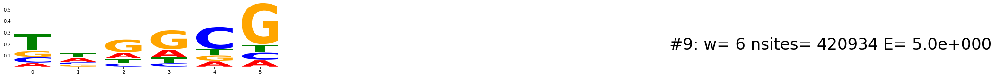

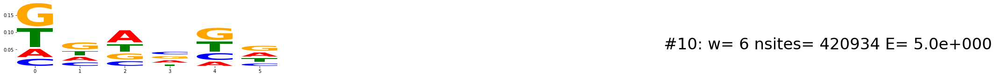

Thanks! Running co-occurance statistics on motifs 1 and 2
.G.CGTTCA.GGC
GG.........................GG.
{-10: 2, -9: 4, 0: 6, 1: 13, 7: 14, 8: 40, 27: 62, 12: 82, 10: 146, 3: 171, 13: 171, 11: 189, 2: 211, 9: 266, 4: 599, 5: 1233, 26: 1710, 18: 2293, -1: 2569, 17: 4637}
420934
Spacing Distribution Counts  
-10              2       
-9               4       
0                6       
1                13      
7                14      
8                40      
27               62      
12               82      
10               146     
3                171     
13               171     
11               189     
2                211     
9                266     
4                599     
5                1233    
26               1710    
18               2293    
-1               2569    
17               4637    
--- 5.956290245056152 seconds ---
----------  ZNF454_CC40NTTGTTA_Lysate_BatchAATA_Cycle3_R1  ---------


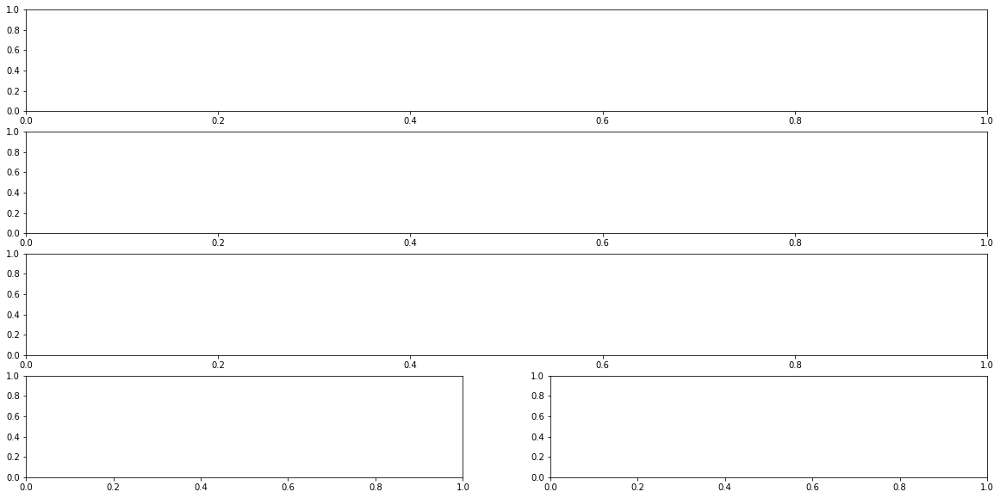

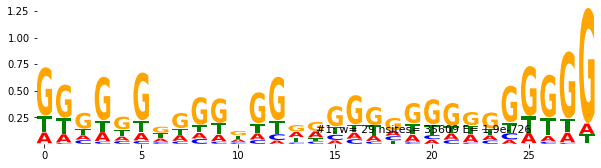

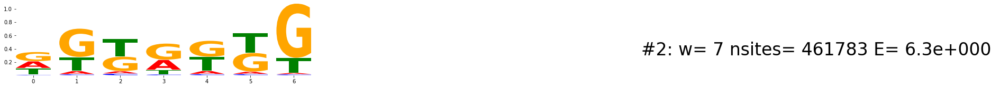

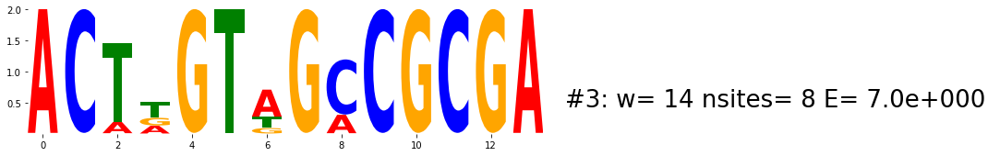

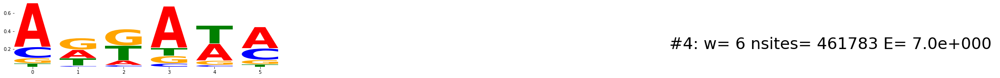

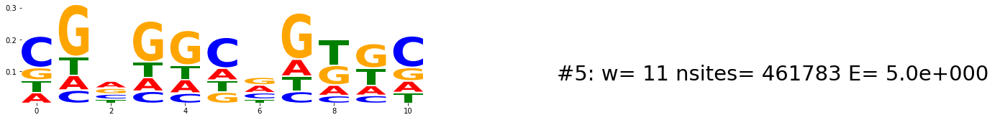

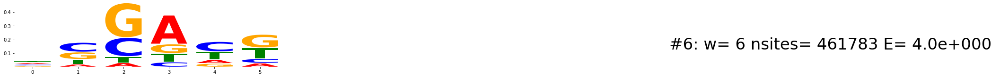

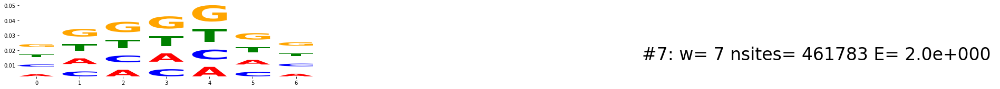

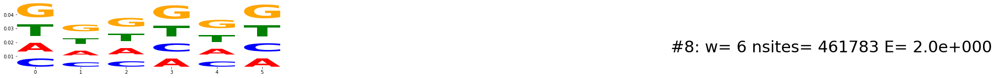

Thanks! Running co-occurance statistics on motifs 1 and 2
............................G
.......
{11: 1797, 10: 2529, 9: 3615, 8: 5287, 7: 8161, 6: 12602, 5: 18992, 4: 29266, 3: 44893, 2: 67274, 1: 102449, 0: 161073}
461783
Spacing Distribution Counts  
11               1797    
10               2529    
9                3615    
8                5287    
7                8161    
6                12602   
5                18992   
4                29266   
3                44893   
2                67274   
1                102449  
0                161073  
--- 5.976902723312378 seconds ---
----------  ZNF35_CG40NTCTTGA_IVT_BatchAATBA_Cycle3_R1  ---------


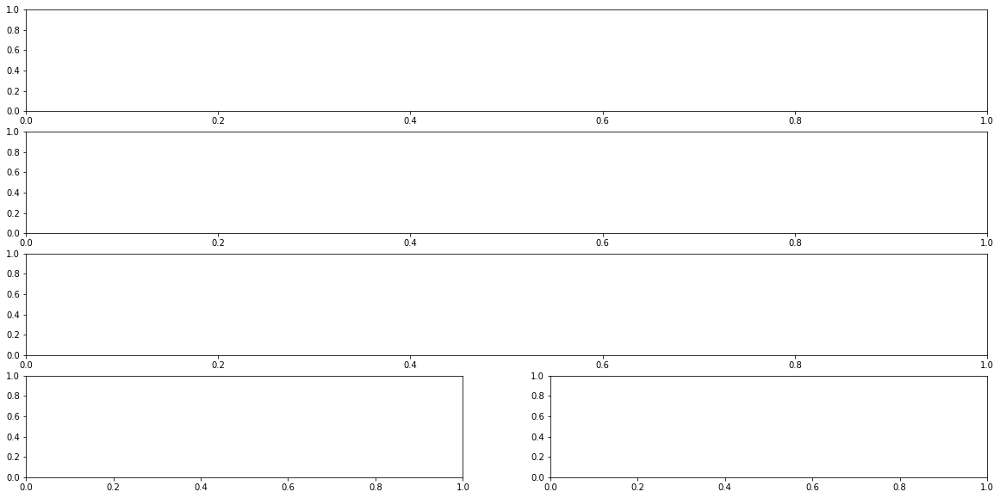

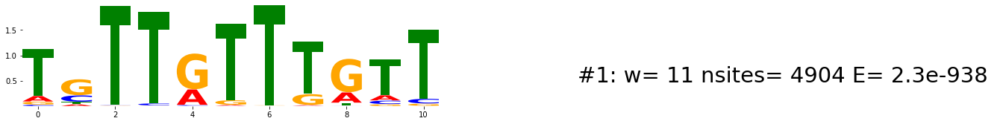

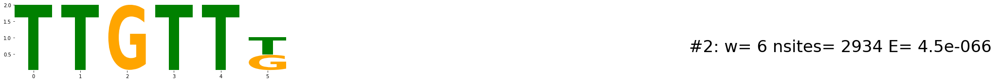

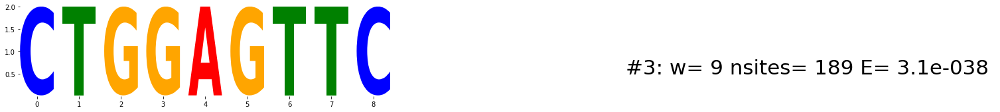

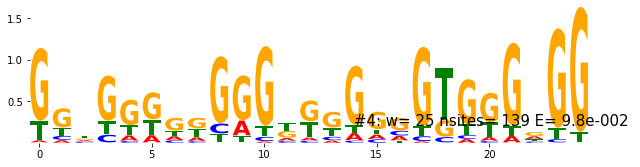

...

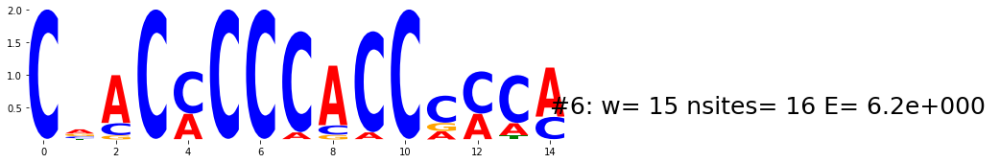

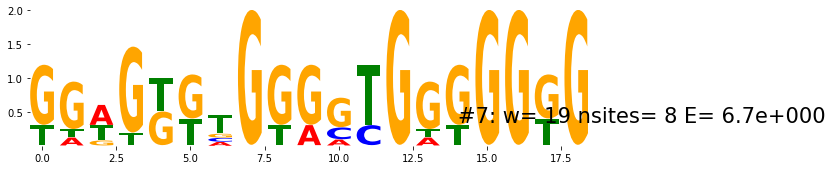

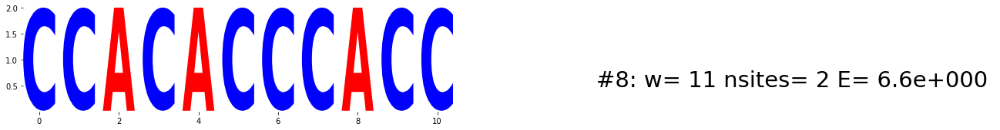

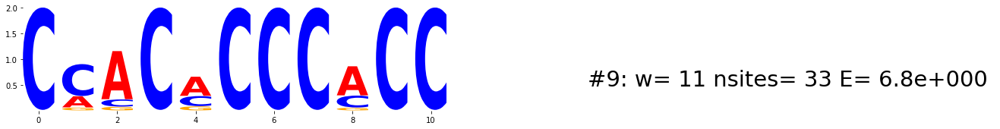

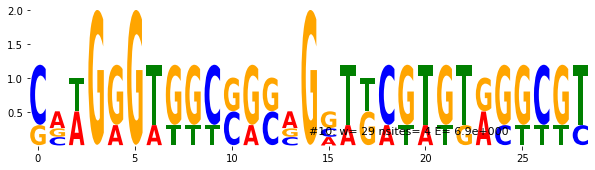

Thanks! Running co-occurance statistics on motifs 1 and 2
T.TT.TTT.TT
TTGTT.
{-19: 1, -13: 1, 23: 1, -12: 1, 26: 1, -24: 1, -21: 1, 3: 2, -17: 2, 22: 2, 28: 2, 27: 3, -18: 3, 6: 4, -10: 4, -20: 5, 21: 7, 25: 7, 5: 8, 24: 9, 19: 9, -9: 10, 15: 12, 16: 15, 13: 16, 17: 16, 20: 16, 14: 19, 10: 20, 9: 20, 8: 22, 11: 25, 7: 26, 18: 32, 12: 33, 4: 52, -6: 266, 1: 591, -2: 730}
35950
Spacing Distribution Counts  
-19              1       
-13              1       
23               1       
-12              1       
26               1       
-24              1       
-21              1       
3                2       
-17              2       
22               2       
28               2       
27               3       
-18              3       
6                4       
-10              4       
-20              5       
21               7       
25               7       
5                8       
24               9       
19               9       
-9               10      
15               12

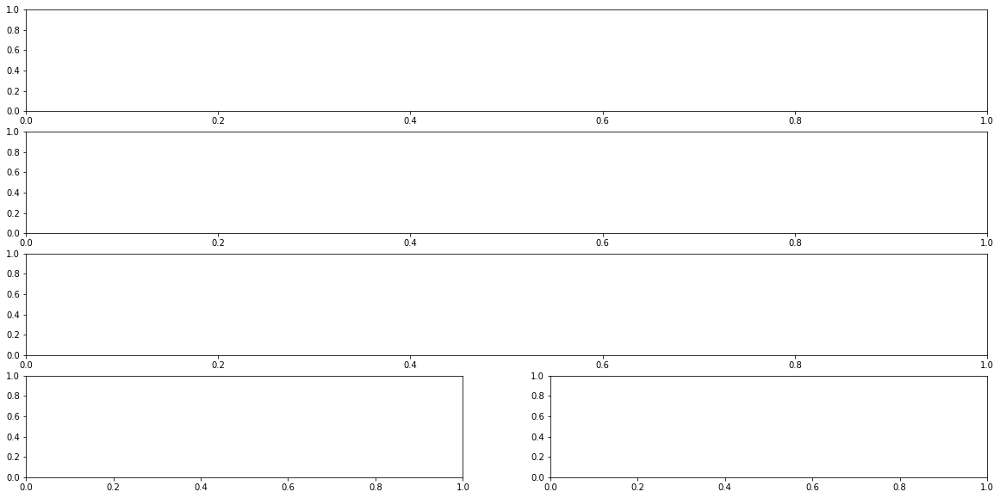

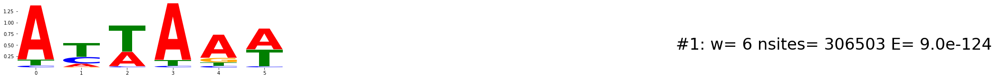

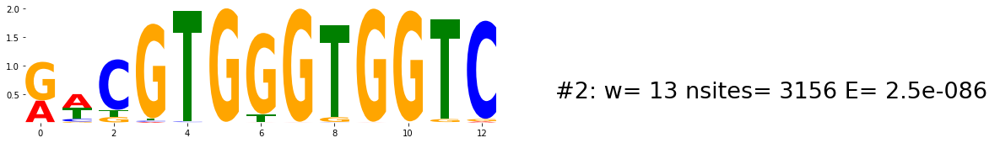

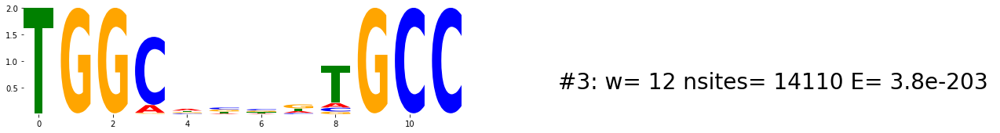

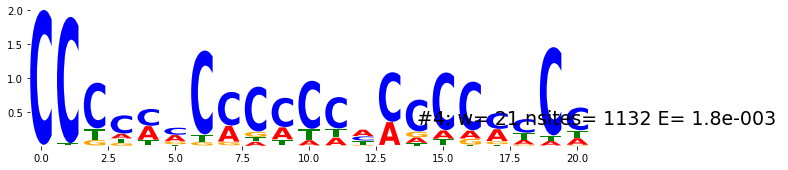

Thanks! Running co-occurance statistics on motifs 1 and 2
A..A..
..CGTGGGTGGTC
{31: 1, -4: 2, 33: 4, 27: 5, 30: 7, -23: 7, -26: 8, 13: 10, 28: 11, 29: 11, 26: 11, 24: 14, -20: 15, 23: 15, -24: 19, 22: 19, 25: 21, -25: 23, -22: 27, 21: 27, 18: 27, 19: 28, 20: 29, 16: 31, 17: 38, -16: 41, -7: 42, -14: 42, -13: 45, -17: 45, -21: 45, -18: 47, -8: 47, -10: 53, -15: 55, -19: 58, -11: 64, 15: 66, -12: 67, -9: 75, -5: 84, 14: 88, -6: 89, -3: 103, -2: 152}
679709
Spacing Distribution Counts  
31               1       
-4               2       
33               4       
27               5       
30               7       
-23              7       
-26              8       
13               10      
28               11      
29               11      
26               11      
24               14      
-20              15      
23               15      
-24              19      
22               19      
25               21      
-25              23      
-22              27      
21               

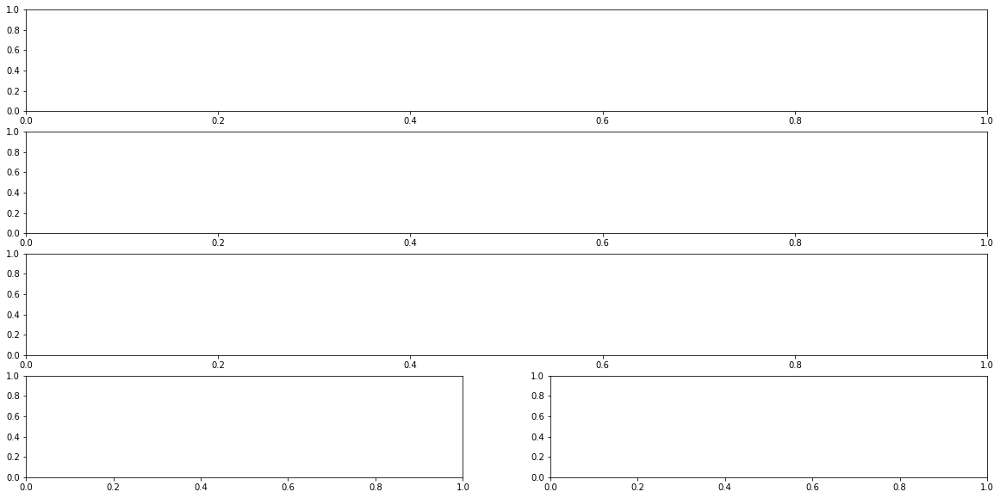

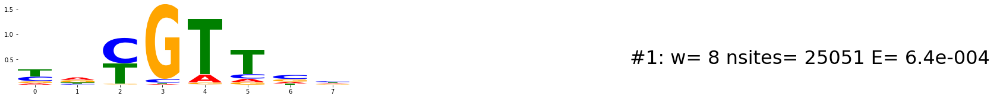

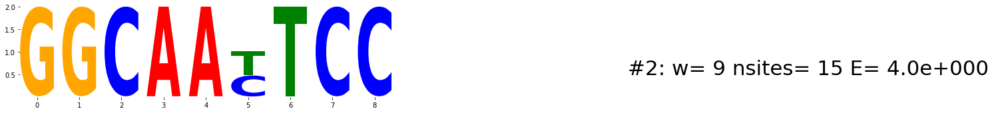

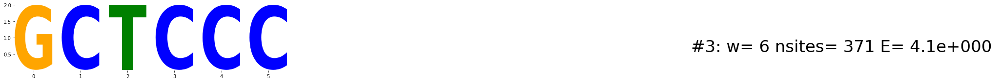

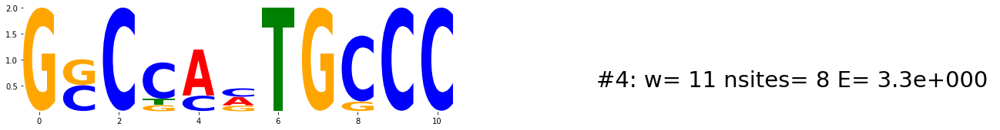

...

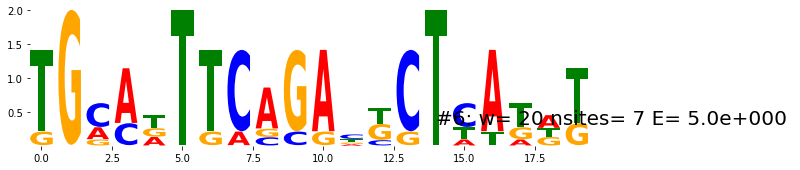

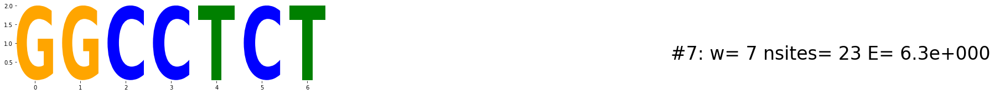

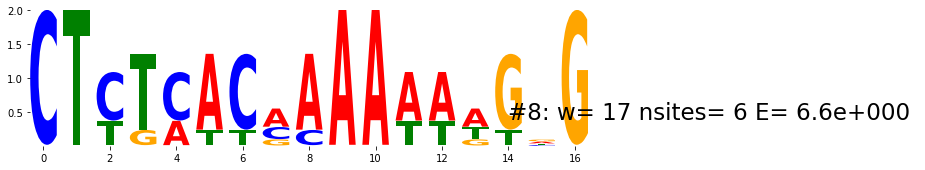

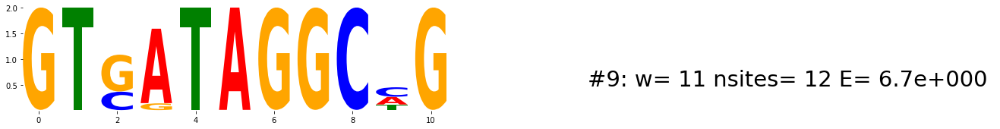

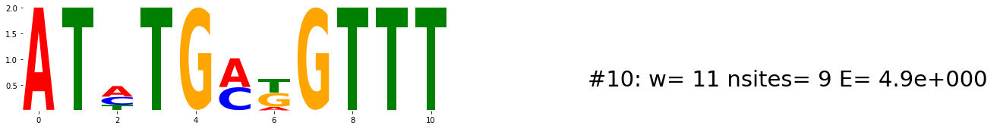

Thanks! Running co-occurance statistics on motifs 1 and 2
...GT...
GGCAA.TCC
{-12: 1, -8: 1, 26: 1, 8: 1, 7: 1, 11: 1, -27: 1, 10: 2, -9: 3}
30077
Spacing Distribution Counts  
-12              1       
-8               1       
26               1       
8                1       
7                1       
11               1       
-27              1       
10               2       
-9               3       
--- 2.8120296001434326 seconds ---
----------  ZNF250_TC40NTTCCGG_Lysate_BatchAATA_Cycle3_R1  ---------


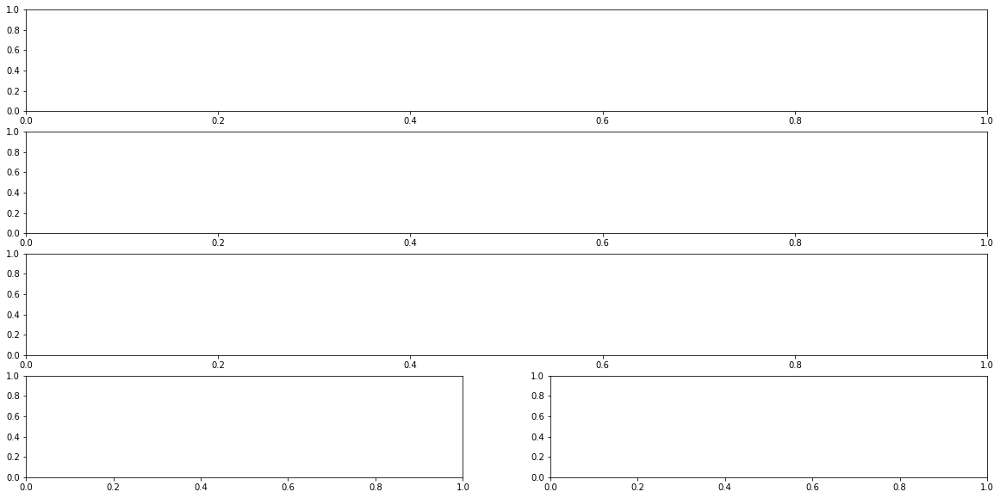

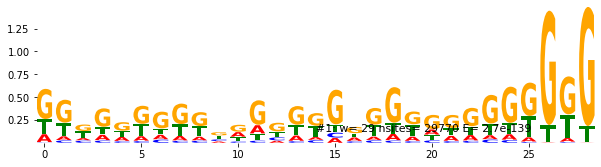

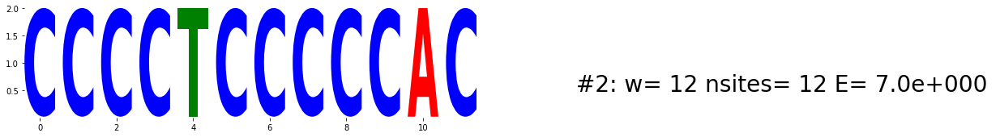

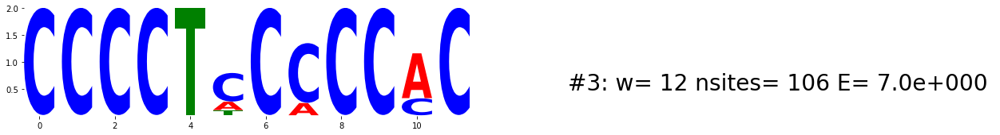

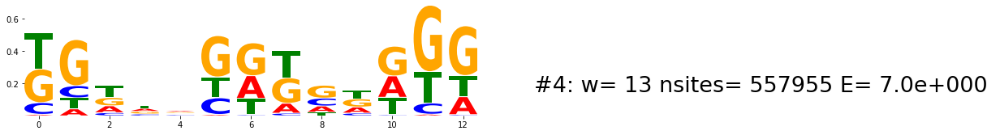

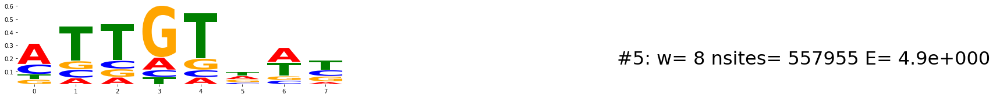

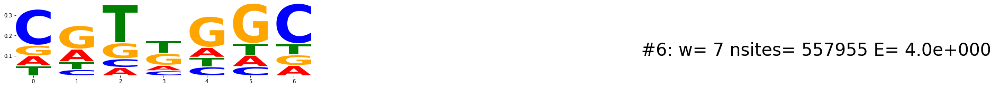

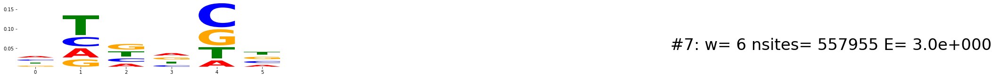

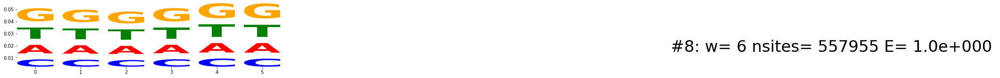

Thanks! Running co-occurance statistics on motifs 1 and 2
..........................G.G
CCCCTCCCCCAC
{}
557955
Spacing Distribution Counts  
--- 6.430203676223755 seconds ---
----------  ZNF322_CA40NAGCGTA_IVT_BatchAATBA_Cycle3_R1  ---------


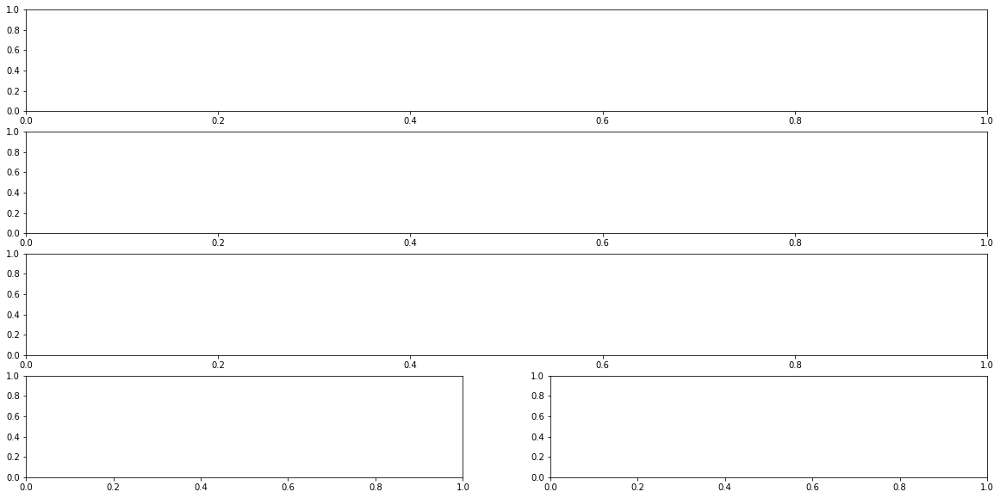

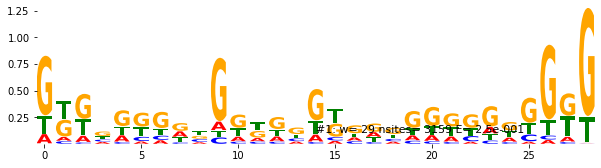

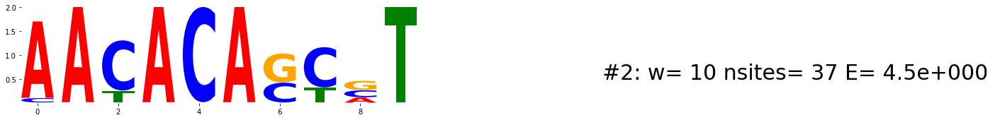

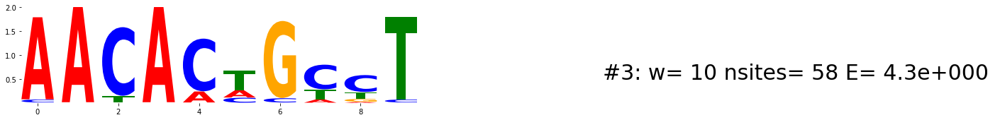

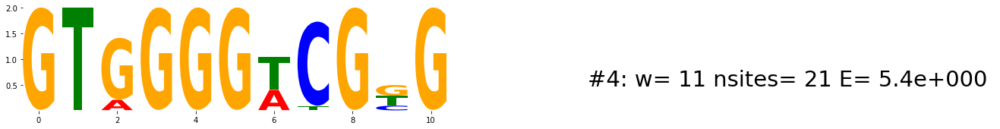

...

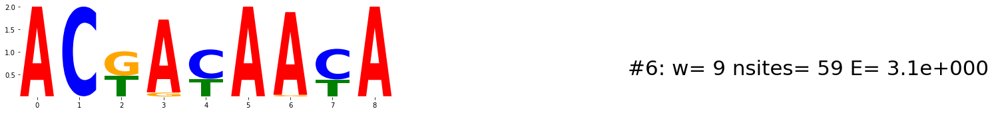

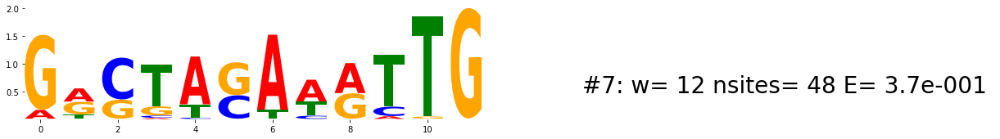

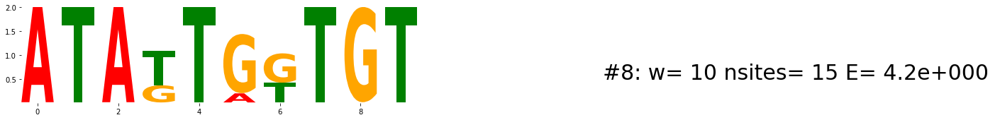

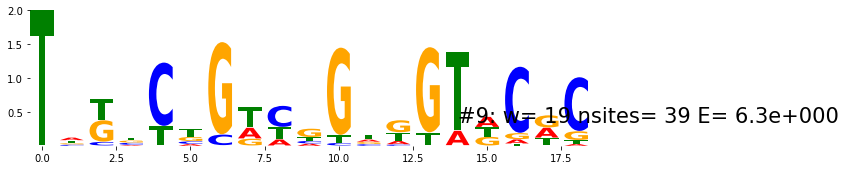

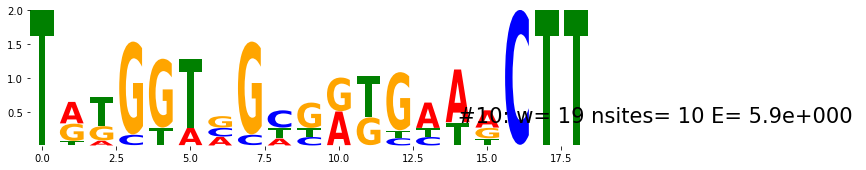

Thanks! Running co-occurance statistics on motifs 1 and 2
.........G................G.G
AACACA...T
{2: 1, -20: 1, 5: 1, -3: 2}
28141
Spacing Distribution Counts  
2                1       
-20              1       
5                1       
-3               2       
--- 2.9342267513275146 seconds ---
----------  ZFP3_CG40NGTTATT_IVT_BatchAATBA_Cycle3_R1  ---------


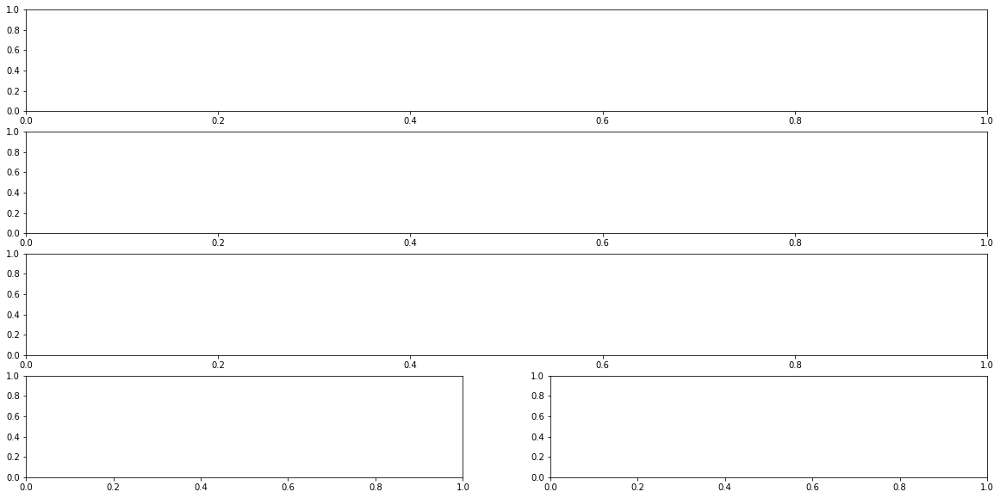

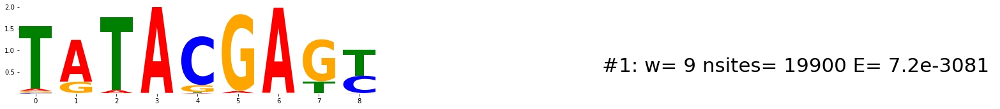

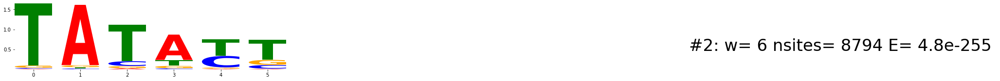

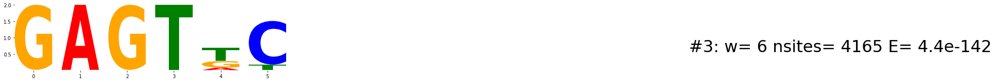

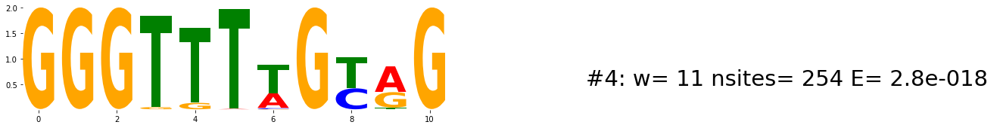

...

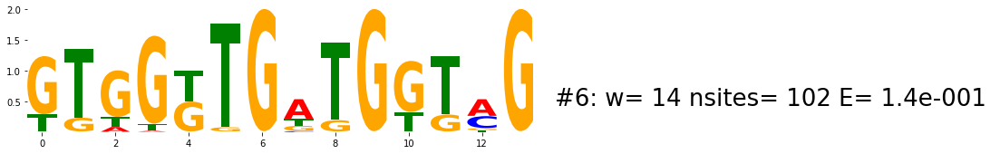

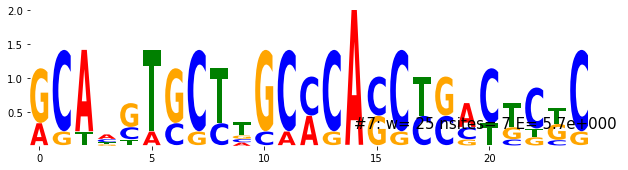

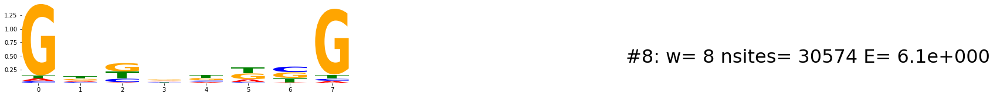

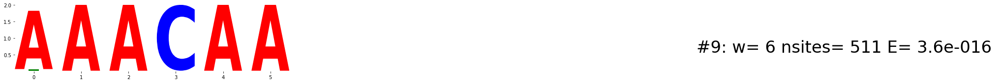

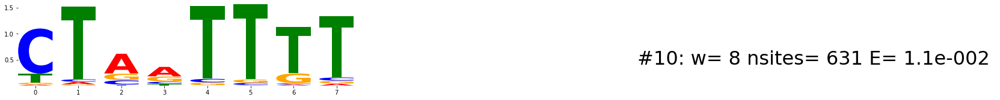

Thanks! Running co-occurance statistics on motifs 1 and 2
TATACGAG.
TAT...
{31: 1, 30: 5, 4: 5, 26: 29, 27: 32, 13: 36, 28: 41, 20: 43, 25: 44, 15: 44, 7: 46, 24: 47, 23: 47, 3: 48, 10: 48, 9: 49, 17: 50, 6: 50, 16: 50, 19: 56, 11: 58, 21: 59, 22: 64, 12: 67, 14: 77, 5: 80, 18: 82, 2: 98, 8: 102, 29: 131, 0: 4139}
30574
Spacing Distribution Counts  
31               1       
30               5       
4                5       
26               29      
27               32      
13               36      
28               41      
20               43      
25               44      
15               44      
7                46      
24               47      
23               47      
3                48      
10               48      
9                49      
17               50      
6                50      
16               50      
19               56      
11               58      
21               59      
22               64      
12               67      
14               77     

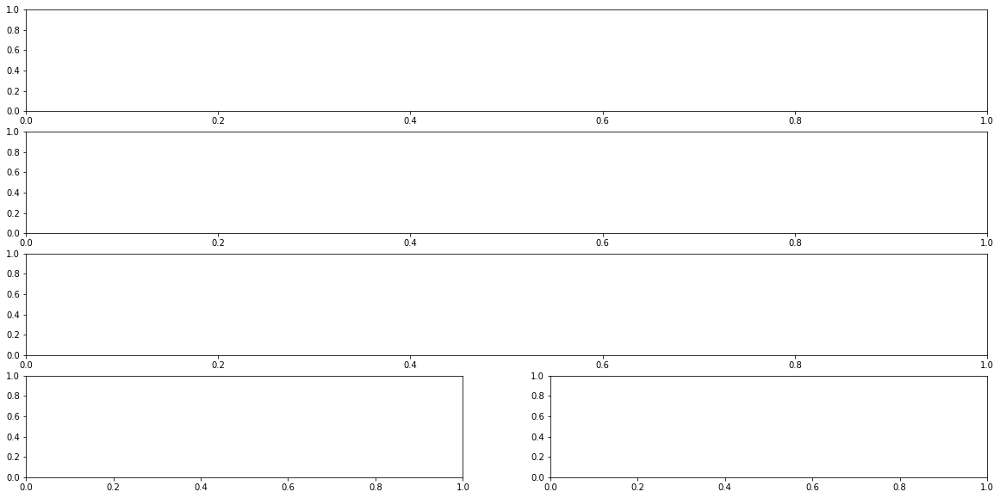

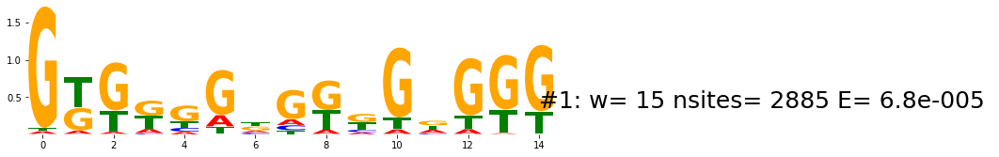

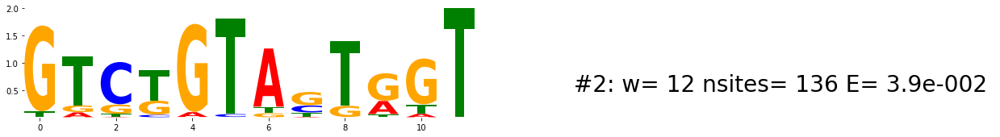

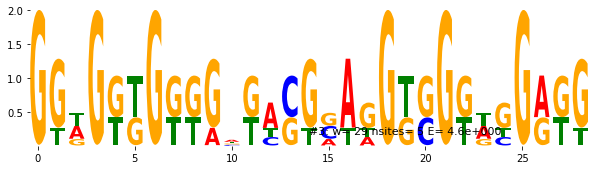

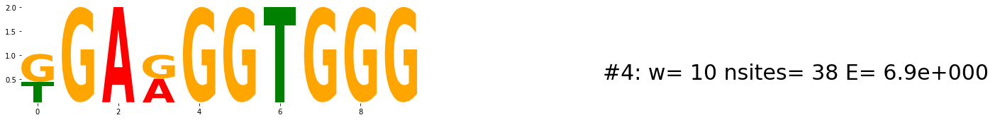

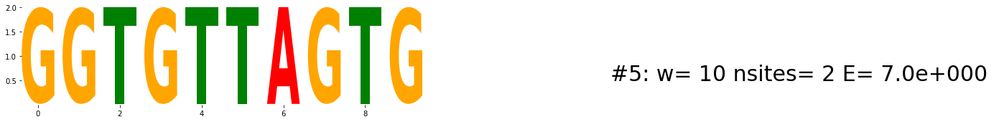

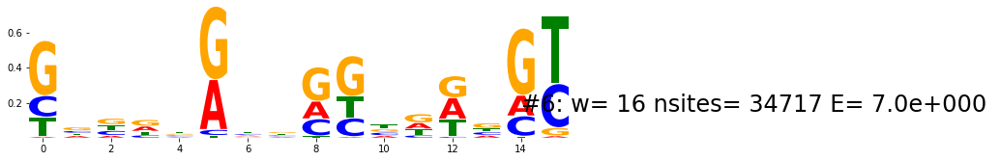

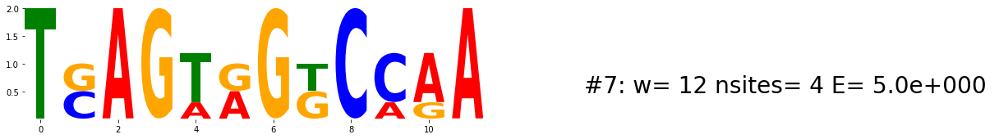

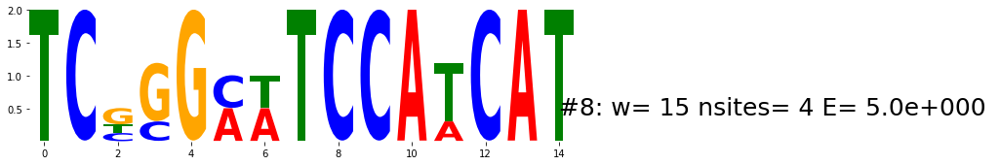

Thanks! Running co-occurance statistics on motifs 1 and 2
G.........G.G.G
GT..GTA.T..T
{13: 1, 15: 1, -21: 1, 12: 1, -19: 1, -15: 1, -20: 1, 14: 1, -12: 1, -22: 1, -14: 2, 10: 2, 9: 2, -25: 3, 4: 4, -10: 7, 0: 9}
34717
Spacing Distribution Counts  
13               1       
15               1       
-21              1       
12               1       
-19              1       
-15              1       
-20              1       
14               1       
-12              1       
-22              1       
-14              2       
10               2       
9                2       
-25              3       
4                4       
-10              7       
0                9       
--- 2.7942733764648438 seconds ---
----------  ZNF708_CC40NGACATG_Lysate_BatchAATA_Cycle3_R1  ---------


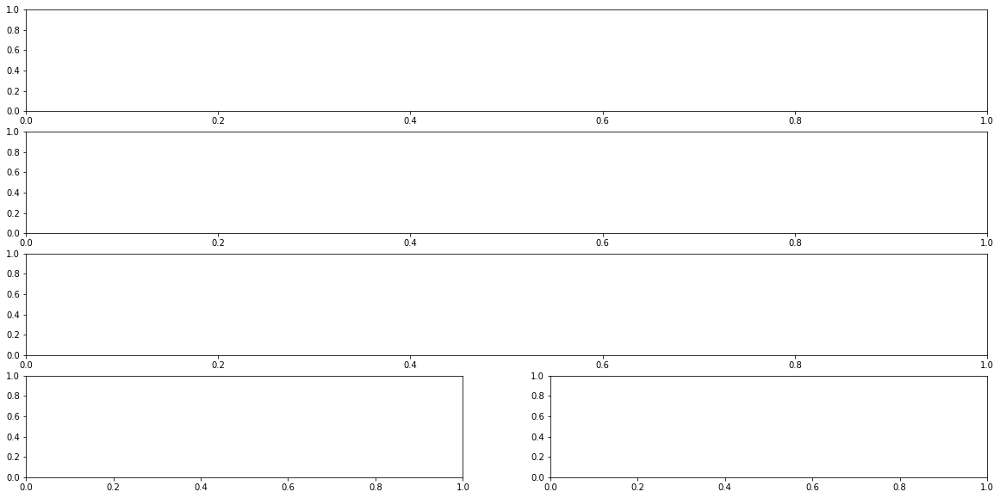

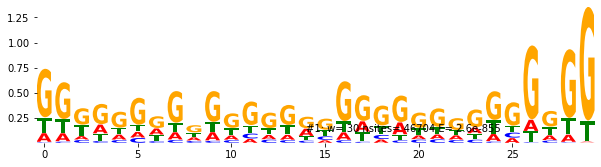

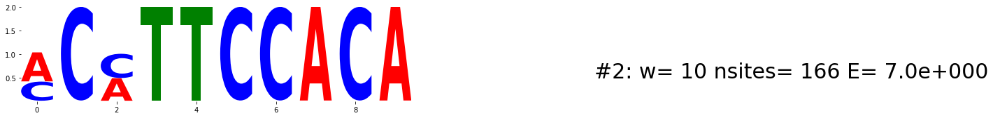

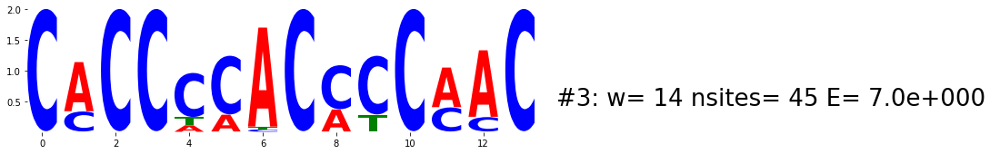

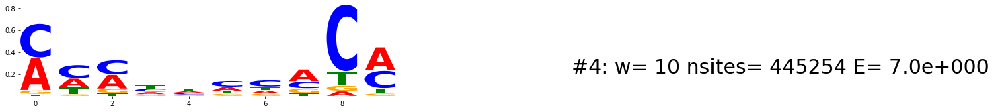

...

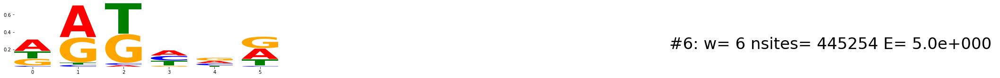

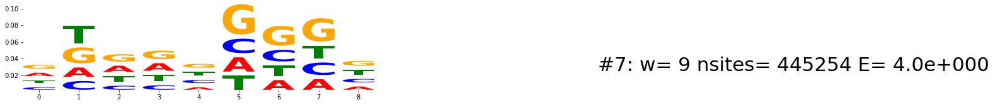

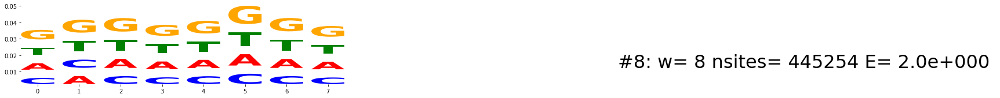

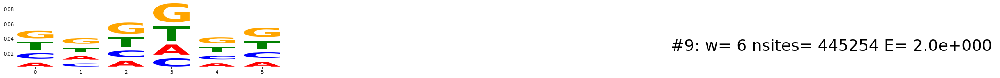

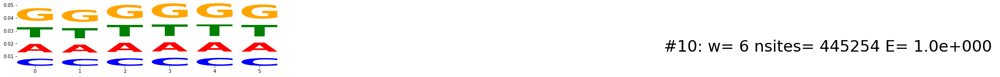

Thanks! Running co-occurance statistics on motifs 1 and 2
..........................G..G
.C.TTCCACA
{5: 1, -11: 1, 6: 1, 4: 1, -15: 1, -16: 2, 2: 2, -7: 2, -5: 2, -4: 3, -3: 3, -13: 3, -14: 3, 0: 4, -8: 4, -1: 4, -6: 4, 1: 6}
445254
Spacing Distribution Counts  
5                1       
-11              1       
6                1       
4                1       
-15              1       
-16              2       
2                2       
-7               2       
-5               2       
-4               3       
-3               3       
-13              3       
-14              3       
0                4       
-8               4       
-1               4       
-6               4       
1                6       
--- 6.255824089050293 seconds ---
----------  SNAI1_AC40NGCTGCT_Lysate_BatchAATA_Cycle3_R1  ---------


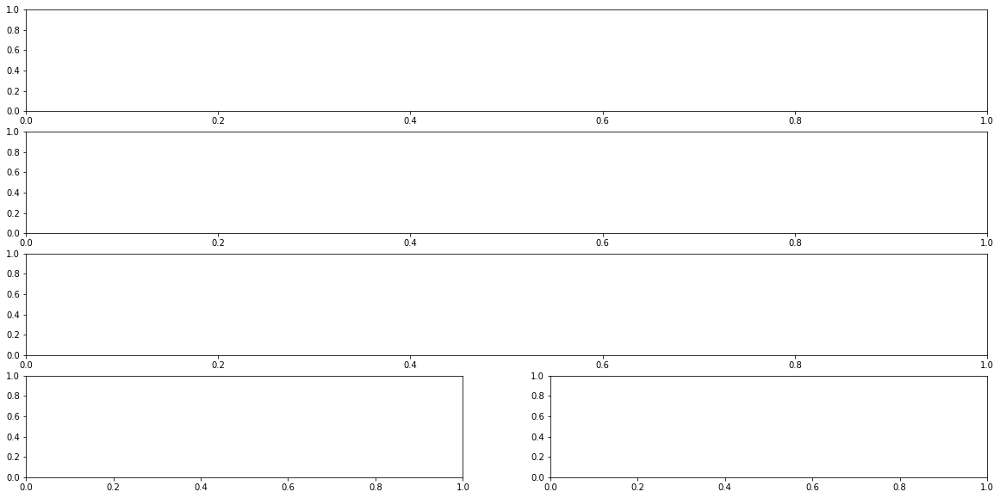

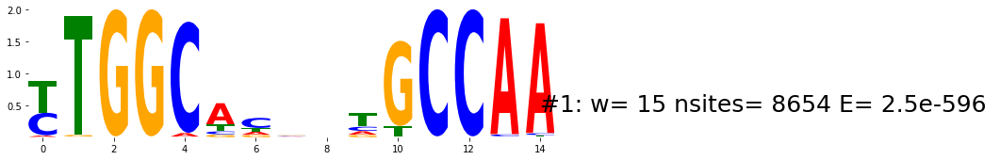

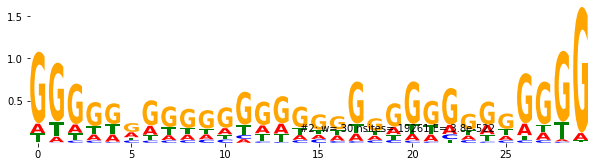

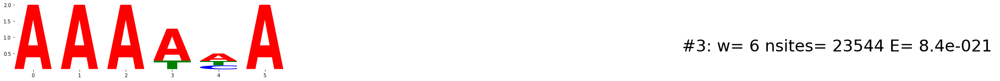

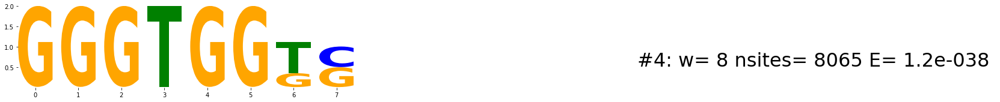

...

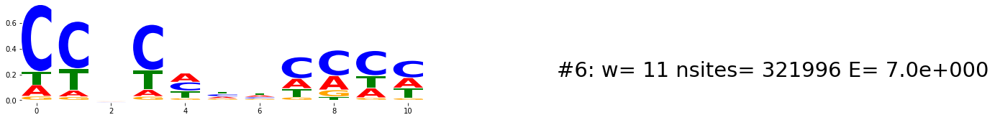

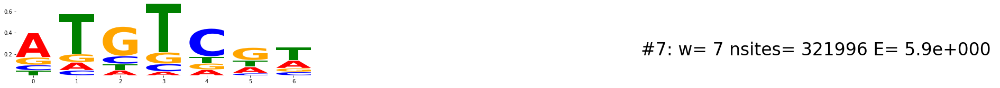

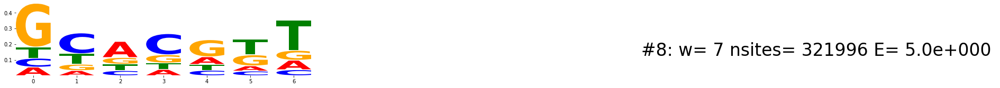

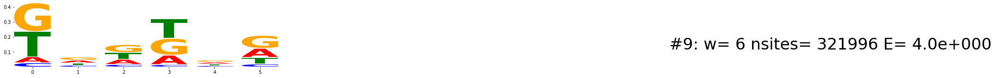

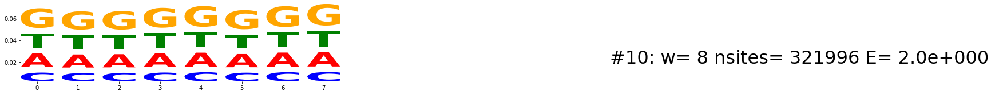

Thanks! Running co-occurance statistics on motifs 1 and 2
.TGGC.....GCCAA
.............................G
{-8: 1, -10: 1, -7: 3, -9: 5, -6: 18, -5: 19, -4: 29, 20: 40, 24: 49, -3: 57, 23: 96, -2: 101, 22: 138, -1: 168, 13: 174, 8: 187, 21: 192, 11: 193, 1: 194, 4: 200, 6: 200, 12: 219, 9: 221, 5: 224, 3: 224, 7: 228, 10: 229, 2: 235, 0: 246, 14: 357, 19: 503}
321996
Spacing Distribution Counts  
-8               1       
-10              1       
-7               3       
-9               5       
-6               18      
-5               19      
-4               29      
20               40      
24               49      
-3               57      
23               96      
-2               101     
22               138     
-1               168     
13               174     
8                187     
21               192     
11               193     
1                194     
4                200     
6                200     
12               219     
9                221     
5   

In [3]:
BASE_DIR = 'HT-SELEX/improved_html_SELEX_MEME_Results/'
end_time = time.time()
counter = 0
for filename in os.listdir(BASE_DIR):
    print("---------- ", filename, " ---------")
    fastaFileT, memeTextFileNameT = BASE_DIR + filename + "/" + filename + ".fa", BASE_DIR + filename + "/meme_out/meme.txt"
    
    motif = RunMotif(fastaFileT, memeTextFileNameT)
    motif.setUp()
    results = RunOccurrence(motif)
    results.act(filename, motif)
    counter = counter + 1
    
print("Went through", counter, "data files.")
print("--- %s seconds ---" % (time.time() - end_time))